# Importing the relevant libraries

In [1]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline
import warnings
warnings.filterwarnings("ignore")
import statsmodels.api as sm
import scipy as sc

In [2]:
np.set_printoptions(suppress=True,linewidth=150,precision=2)

In [3]:
plt.rcParams["figure.figsize"] = (15,8)

# Loading the dataset

In [4]:
data = pd.read_csv('final_dataset.csv')
epl_data = data.copy()
epl_data.head()

,Unnamed: 0,Date,HomeTeam,AwayTeam,FTHG,FTAG,FTR,HTGS,ATGS,HTGC,...,HTLossStreak3,HTLossStreak5,ATWinStreak3,ATWinStreak5,ATLossStreak3,ATLossStreak5,HTGD,ATGD,DiffPts,DiffFormPts
0,0,19/08/00,Charlton,Man City,4,0,H,0,0,0,...,0,0,0,0,0,0,0.0,0.0,0.0,0.0
1,1,19/08/00,Chelsea,West Ham,4,2,H,0,0,0,...,0,0,0,0,0,0,0.0,0.0,0.0,0.0
2,2,19/08/00,Coventry,Middlesbrough,1,3,NH,0,0,0,...,0,0,0,0,0,0,0.0,0.0,0.0,0.0
3,3,19/08/00,Derby,Southampton,2,2,NH,0,0,0,...,0,0,0,0,0,0,0.0,0.0,0.0,0.0
4,4,19/08/00,Leeds,Everton,2,0,H,0,0,0,...,0,0,0,0,0,0,0.0,0.0,0.0,0.0


In [5]:
epl_data.shape

(6840, 40)

## Dropping irrelevant columns

In [6]:
epl_data.drop(columns=["Unnamed: 0","HM1","HM2","HM3","HM4","HM5","AM1","AM2","AM3","AM4","AM5","HTFormPtsStr","ATFormPtsStr"],inplace=True)

In [7]:
epl_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6840 entries, 0 to 6839
Data columns (total 27 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Date           6840 non-null   object 
 1   HomeTeam       6840 non-null   object 
 2   AwayTeam       6840 non-null   object 
 3   FTHG           6840 non-null   int64  
 4   FTAG           6840 non-null   int64  
 5   FTR            6840 non-null   object 
 6   HTGS           6840 non-null   int64  
 7   ATGS           6840 non-null   int64  
 8   HTGC           6840 non-null   int64  
 9   ATGC           6840 non-null   int64  
 10  HTP            6840 non-null   float64
 11  ATP            6840 non-null   float64
 12  MW             6840 non-null   float64
 13  HTFormPts      6840 non-null   int64  
 14  ATFormPts      6840 non-null   int64  
 15  HTWinStreak3   6840 non-null   int64  
 16  HTWinStreak5   6840 non-null   int64  
 17  HTLossStreak3  6840 non-null   int64  
 18  HTLossSt

In [8]:
epl_data.describe()

,FTHG,FTAG,HTGS,ATGS,HTGC,ATGC,HTP,ATP,MW,HTFormPts,...,HTLossStreak3,HTLossStreak5,ATWinStreak3,ATWinStreak5,ATLossStreak3,ATLossStreak5,HTGD,ATGD,DiffPts,DiffFormPts
count,6840.000000,6840.000000,6840.000000,6840.000000,6840.000000,6840.000000,6840.000000,6840.000000,6840.000000,6840.000000,...,6840.000000,6840.000000,6840.000000,6840.000000,6840.000000,6840.000000,6840.000000,6840.000000,6840.000000,6840.000000
mean,1.527485,1.130263,24.416667,24.514327,24.497807,24.347515,1.209014,1.226768,19.500000,6.242690,...,0.057602,0.014327,0.062865,0.016520,0.051023,0.010234,-0.009690,0.014539,-0.017755,-0.018086
std,1.297913,1.124566,17.178524,17.136894,16.401571,16.341557,0.530186,0.523176,10.966658,3.582486,...,0.233007,0.118846,0.242739,0.127475,0.220062,0.100651,0.693593,0.692937,0.668523,0.408488
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,-3.000000,-3.333333,-2.363636,-2.250000
25%,1.000000,0.000000,11.000000,11.000000,11.000000,11.000000,0.888889,0.906250,10.000000,4.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,-0.500000,-0.464286,-0.451613,-0.176471
50%,1.000000,1.000000,23.000000,23.000000,23.000000,23.000000,1.172414,1.192308,19.500000,6.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,-0.076923,-0.050000,0.000000,0.000000
75%,2.000000,2.000000,35.000000,35.000000,36.000000,36.000000,1.555556,1.562500,29.000000,9.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.400000,0.421053,0.428571,0.153846
max,9.000000,7.000000,102.000000,105.000000,85.000000,82.000000,2.736842,2.761905,38.000000,15.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,4.000000,3.500000,2.285714,2.250000


## Checking for null data

In [9]:
epl_data.isnull().sum()

Date             0
HomeTeam         0
AwayTeam         0
FTHG             0
FTAG             0
FTR              0
HTGS             0
ATGS             0
HTGC             0
ATGC             0
HTP              0
ATP              0
MW               0
HTFormPts        0
ATFormPts        0
HTWinStreak3     0
HTWinStreak5     0
HTLossStreak3    0
HTLossStreak5    0
ATWinStreak3     0
ATWinStreak5     0
ATLossStreak3    0
ATLossStreak5    0
HTGD             0
ATGD             0
DiffPts          0
DiffFormPts      0
dtype: int64

## Checking for duplicate data

In [10]:
epl_data[epl_data.duplicated()]

,Date,HomeTeam,AwayTeam,FTHG,FTAG,FTR,HTGS,ATGS,HTGC,ATGC,...,HTLossStreak3,HTLossStreak5,ATWinStreak3,ATWinStreak5,ATLossStreak3,ATLossStreak5,HTGD,ATGD,DiffPts,DiffFormPts


## Checking for total number of unique values for each column

In [11]:
for col in epl_data.columns:
    print('{}:'.format(col),epl_data[col].nunique())

Date: 1804
HomeTeam: 44
AwayTeam: 44
FTHG: 10
FTAG: 8
FTR: 2
HTGS: 96
ATGS: 92
HTGC: 81
ATGC: 80
HTP: 833
ATP: 835
MW: 38
HTFormPts: 15
ATFormPts: 15
HTWinStreak3: 2
HTWinStreak5: 2
HTLossStreak3: 2
HTLossStreak5: 2
ATWinStreak3: 2
ATWinStreak5: 2
ATLossStreak3: 2
ATLossStreak5: 2
HTGD: 1170
ATGD: 1172
DiffPts: 1164
DiffFormPts: 502


# Univariate Analysis

Mean of FTHG: 1.527485380116959
Median of FTHG: 1.0
Minimum value of FTHG: 0
Maximum value of FTHG: 9
Skewness of FTHG: 0.9719189988740283
Kurtosis of FTHG: 1.2682471073301405
Mode of FTHG 0    1
dtype: int64


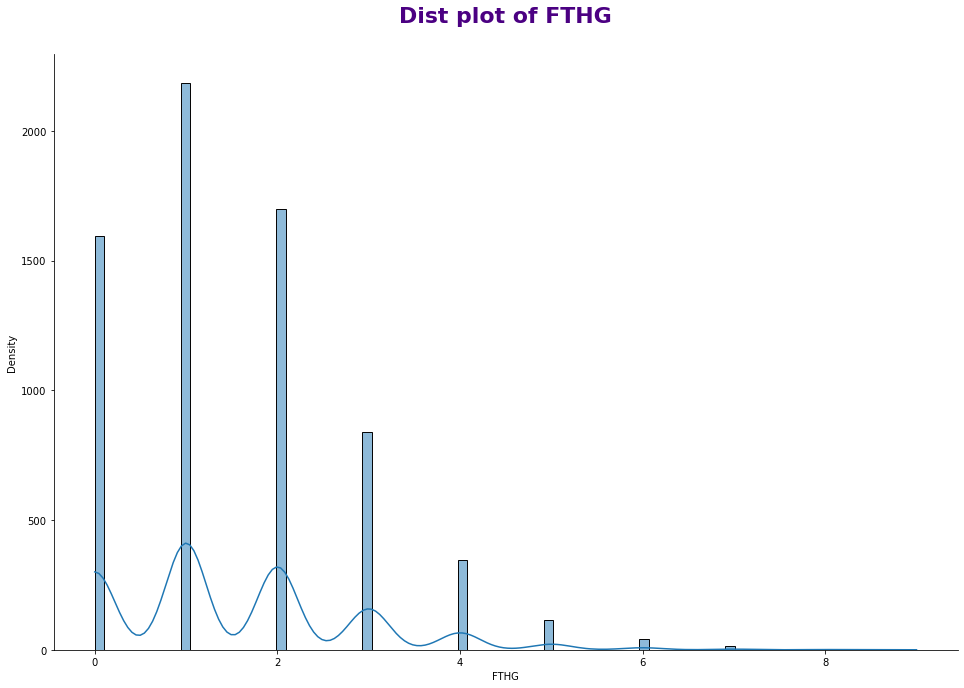

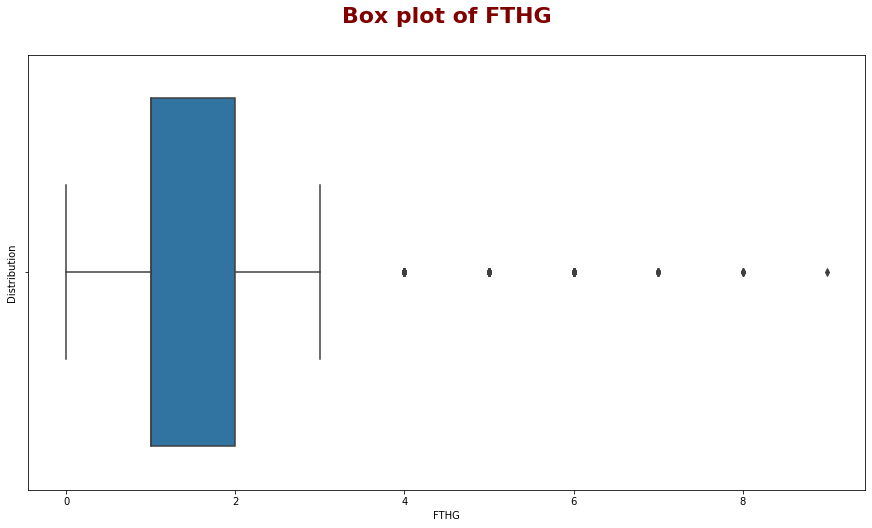

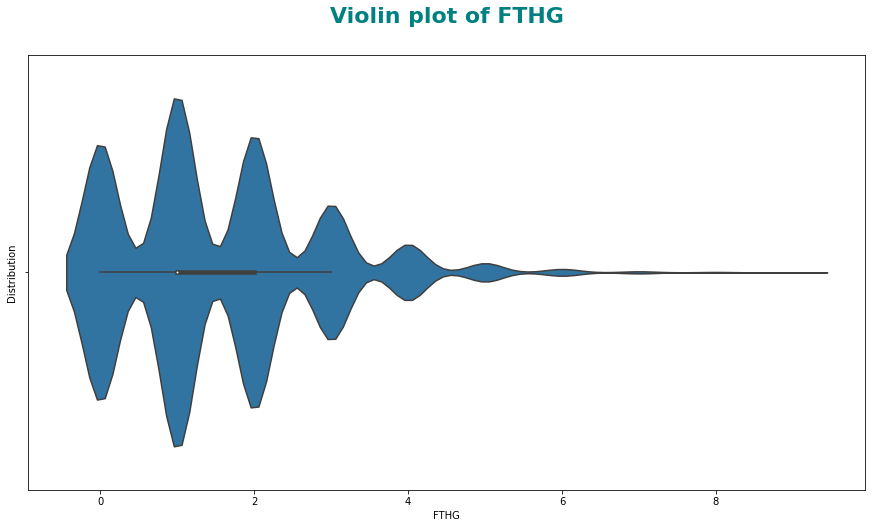

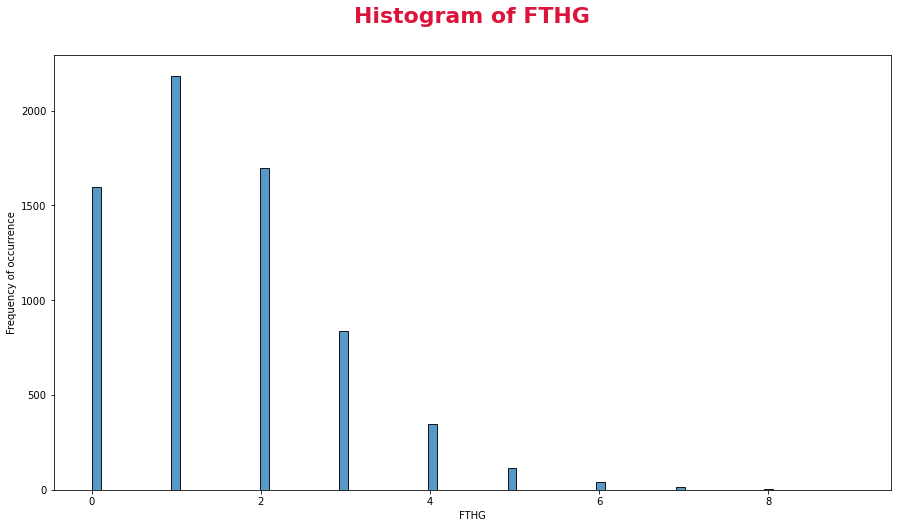

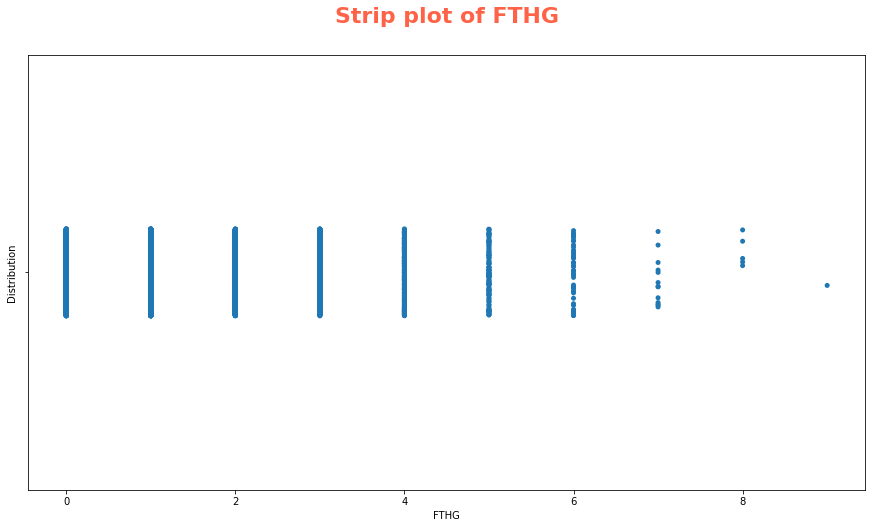

------------------------------

Mean of FTAG: 1.1302631578947369
Median of FTAG: 1.0
Minimum value of FTAG: 0
Maximum value of FTAG: 7
Skewness of FTAG: 1.0512689550568433
Kurtosis of FTAG: 1.0769376586071613
Mode of FTAG 0    1
dtype: int64


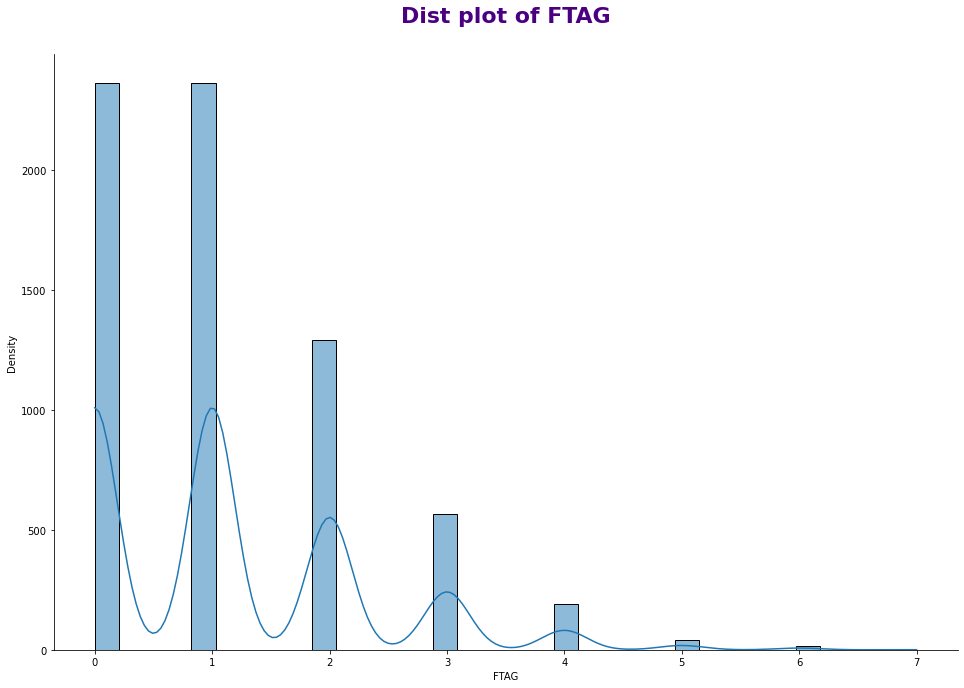

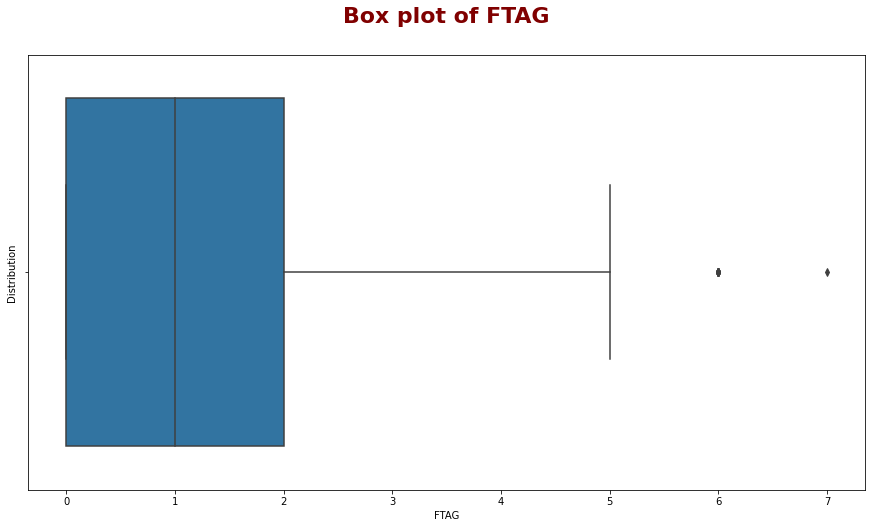

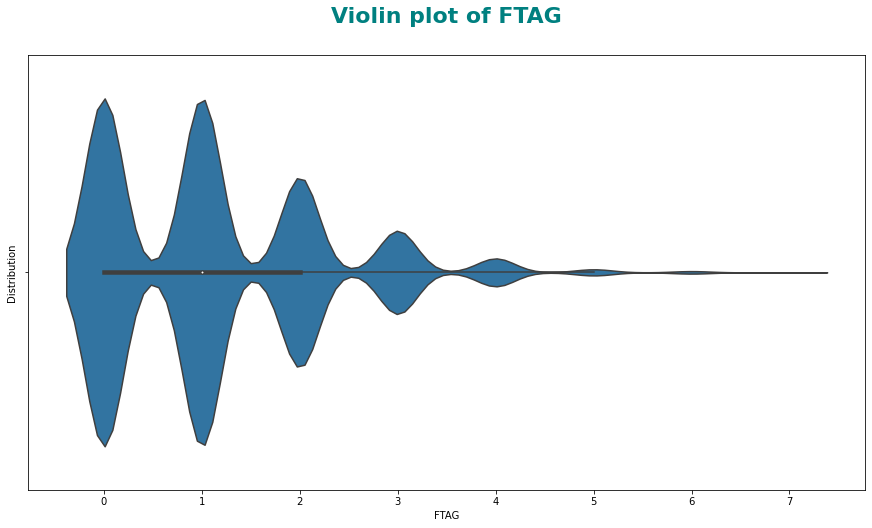

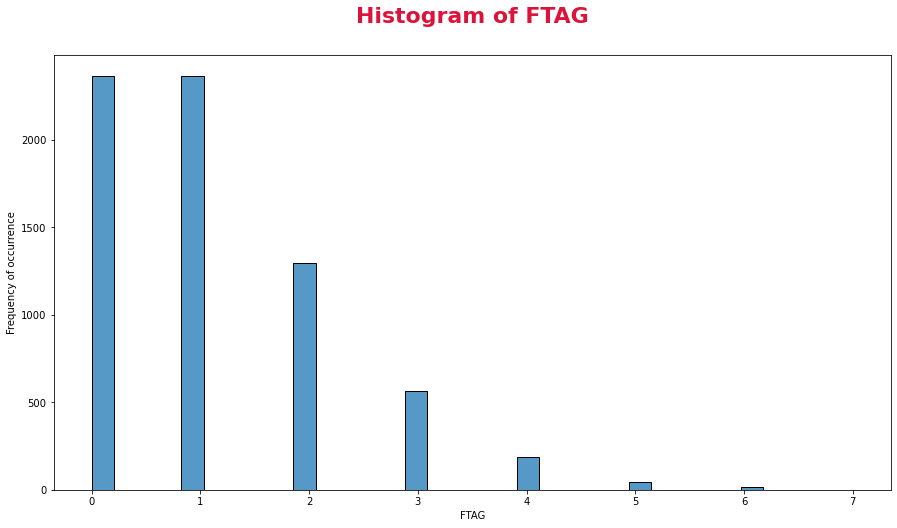

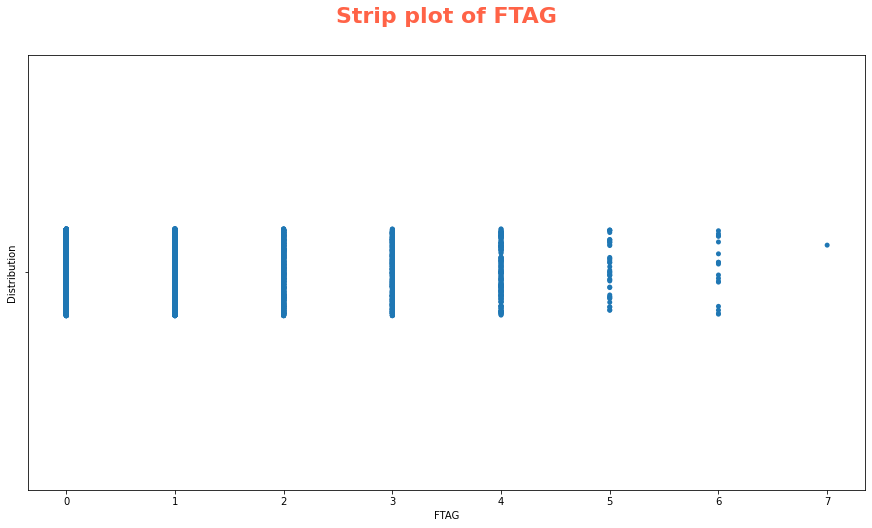

------------------------------

Mean of HTGS: 24.416666666666668
Median of HTGS: 23.0
Minimum value of HTGS: 0
Maximum value of HTGS: 102
Skewness of HTGS: 0.7505394147653944
Kurtosis of HTGS: 0.4427577449632989
Mode of HTGS 0    0
dtype: int64


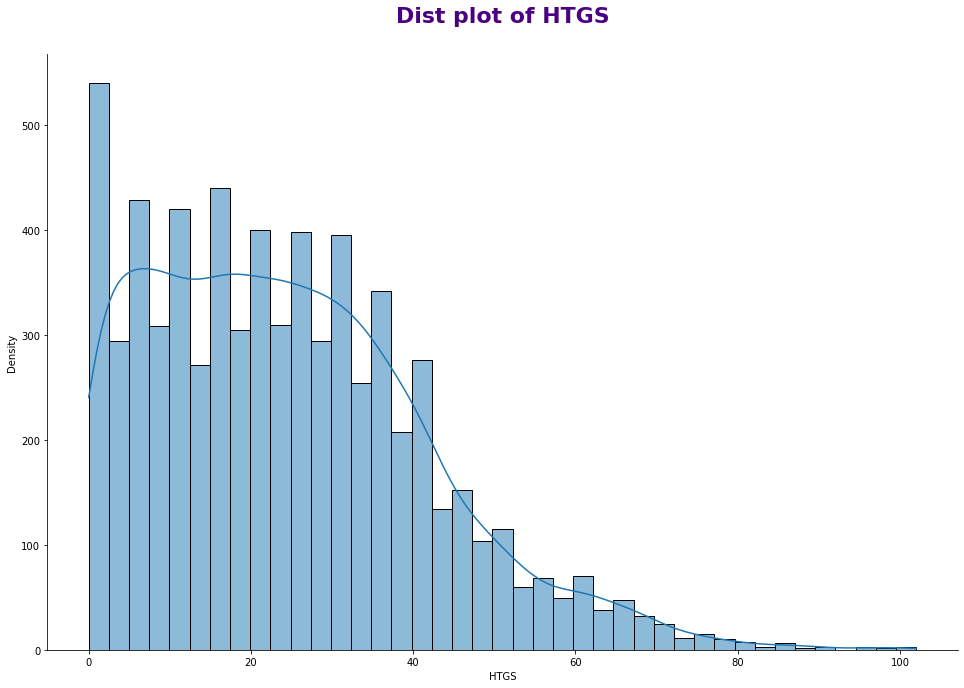

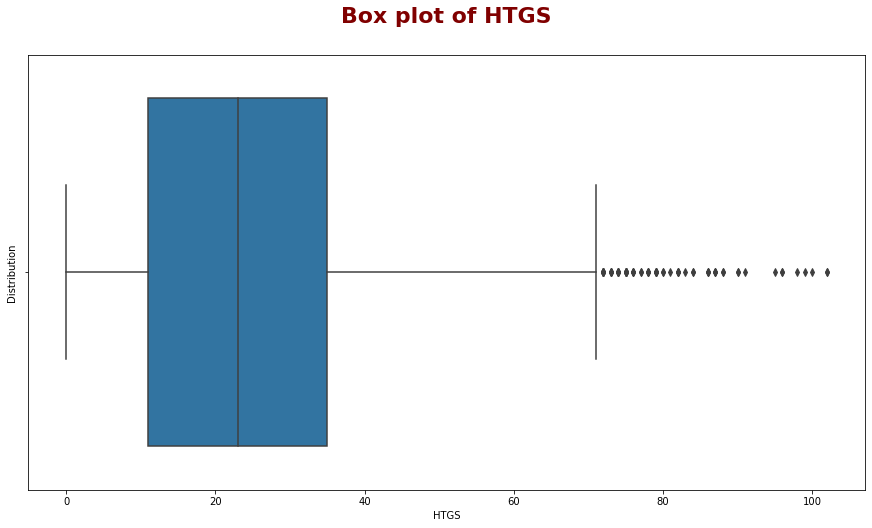

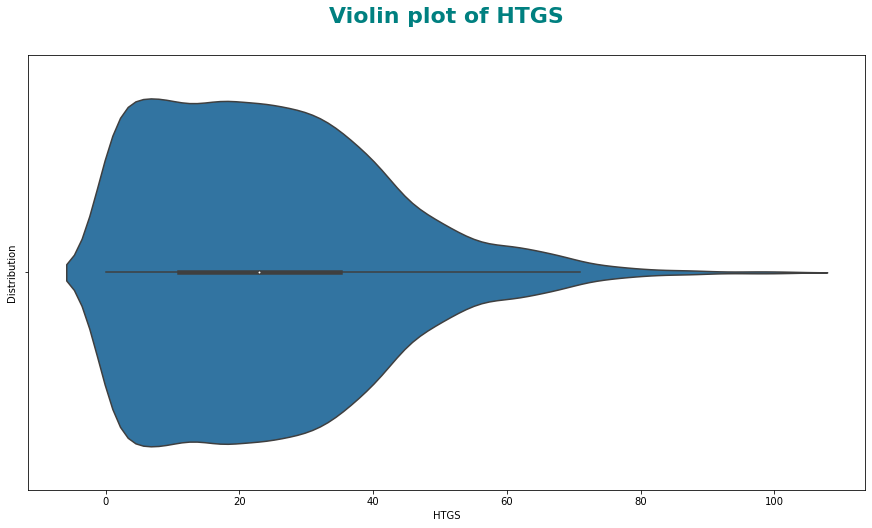

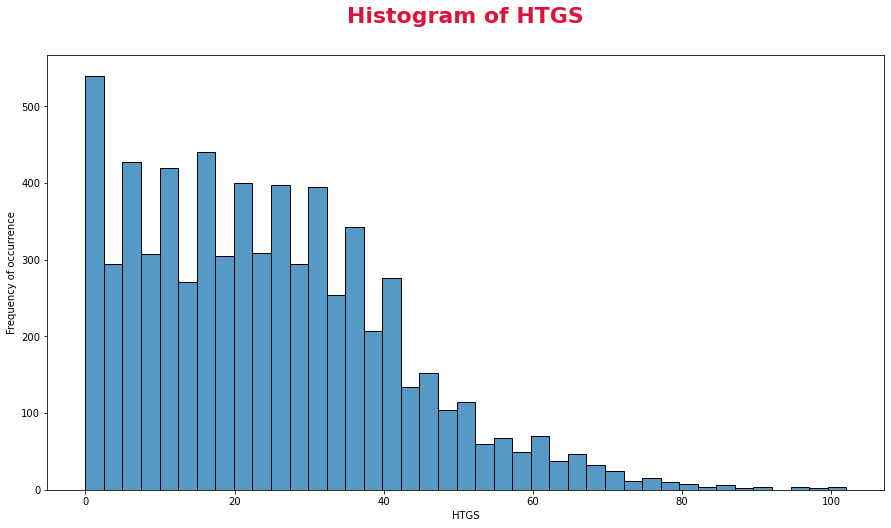

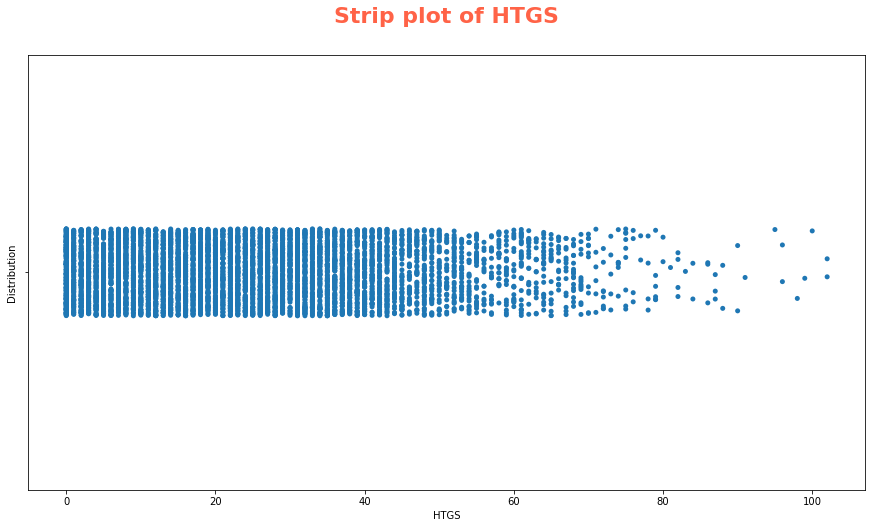

------------------------------

Mean of ATGS: 24.514327485380118
Median of ATGS: 23.0
Minimum value of ATGS: 0
Maximum value of ATGS: 105
Skewness of ATGS: 0.7427451962180077
Kurtosis of ATGS: 0.4108014292601041
Mode of ATGS 0    0
dtype: int64


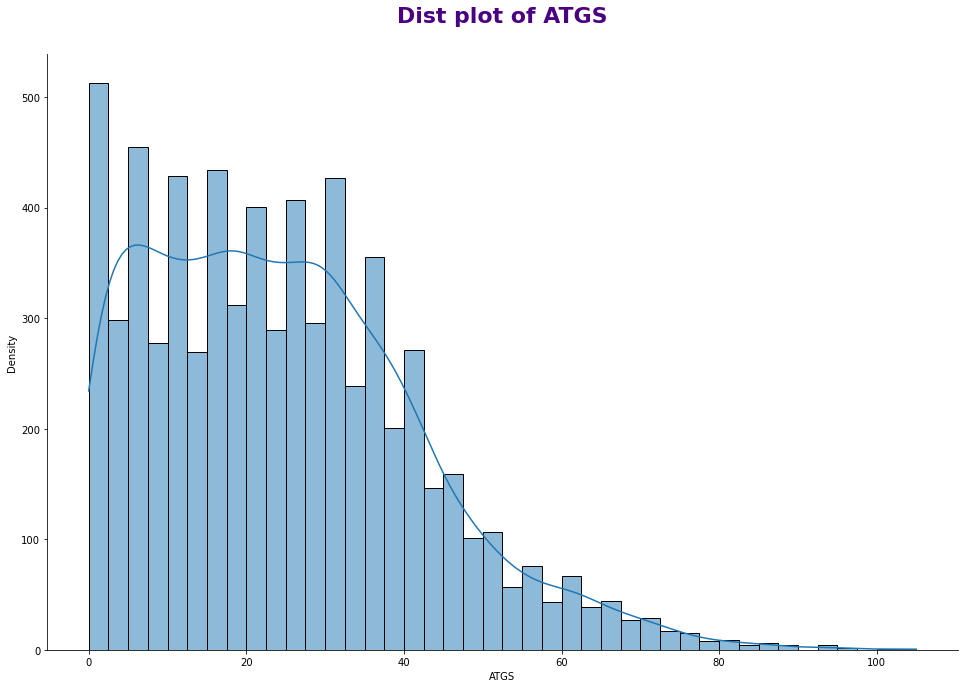

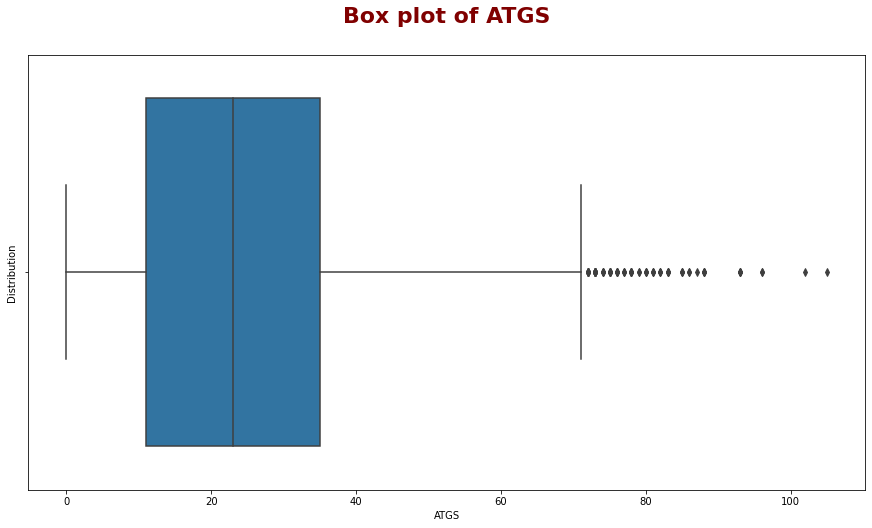

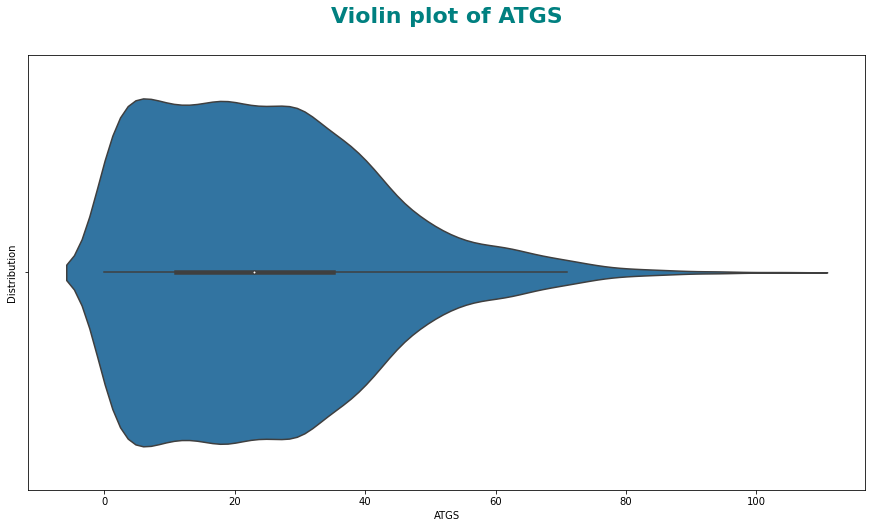

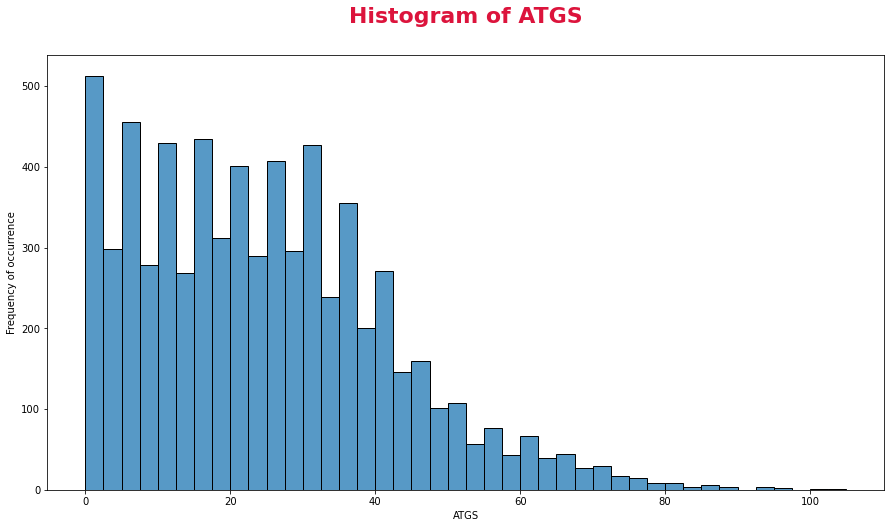

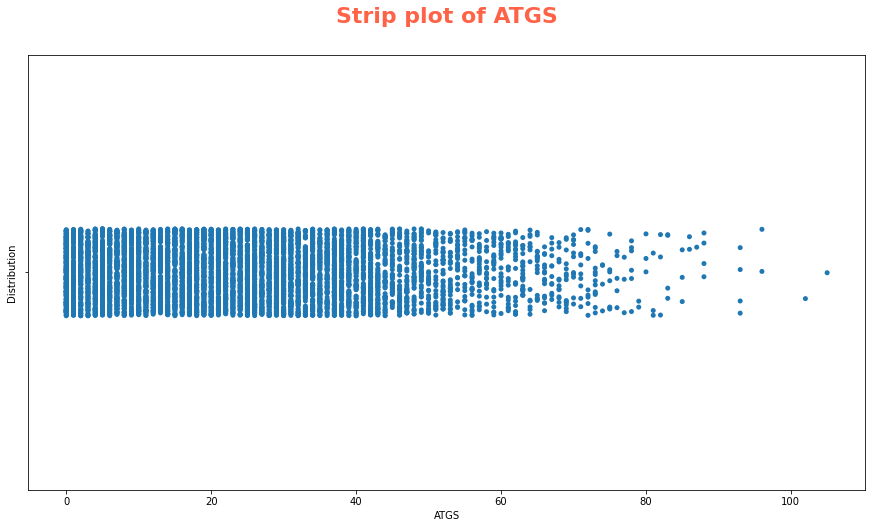

------------------------------

Mean of HTGC: 24.49780701754386
Median of HTGC: 23.0
Minimum value of HTGC: 0
Maximum value of HTGC: 85
Skewness of HTGC: 0.4444496678675963
Kurtosis of HTGC: -0.5227393450351765
Mode of HTGC 0    0
dtype: int64


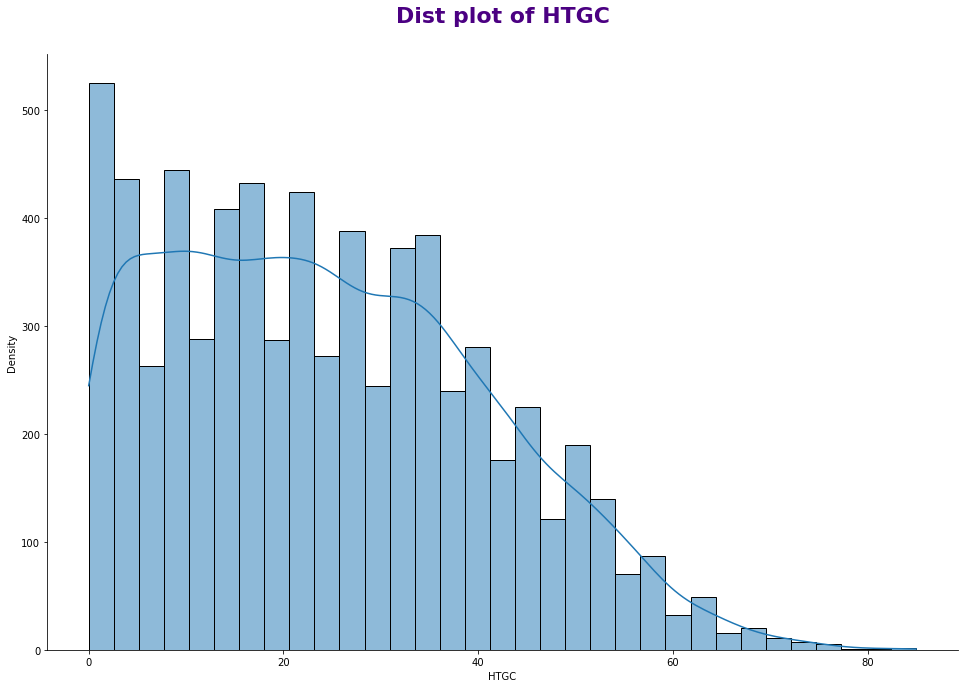

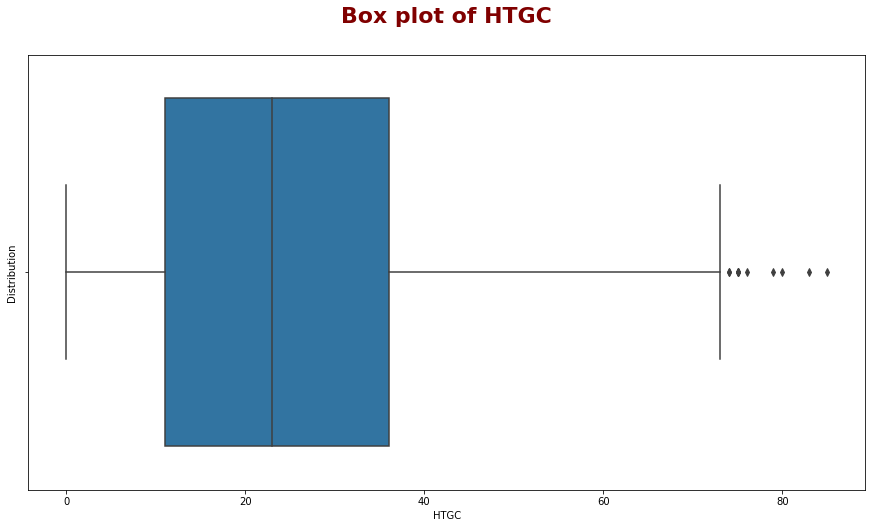

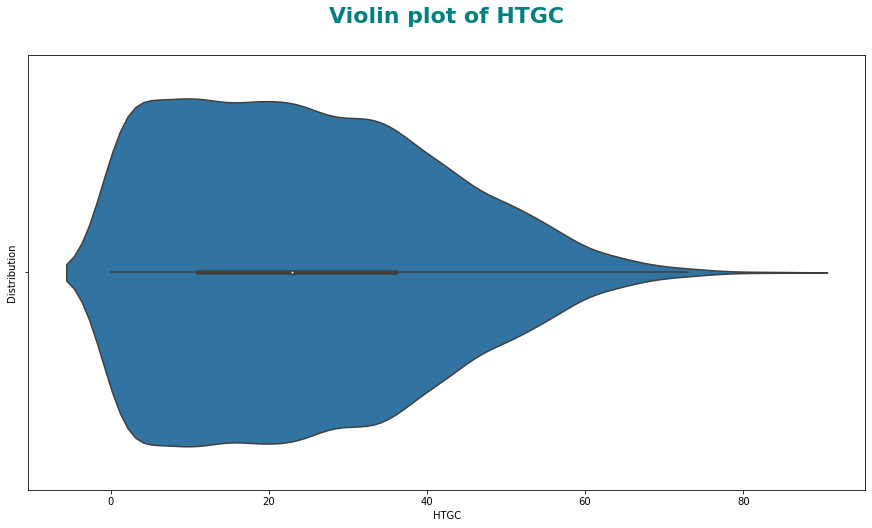

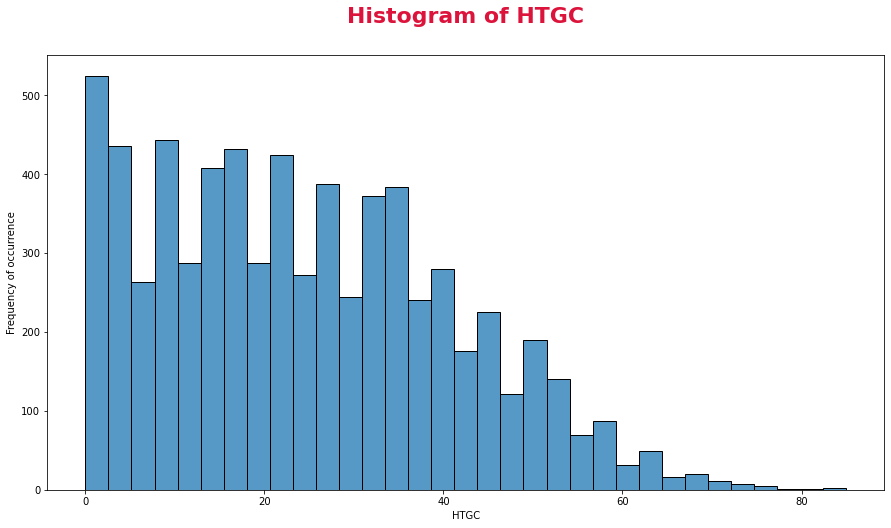

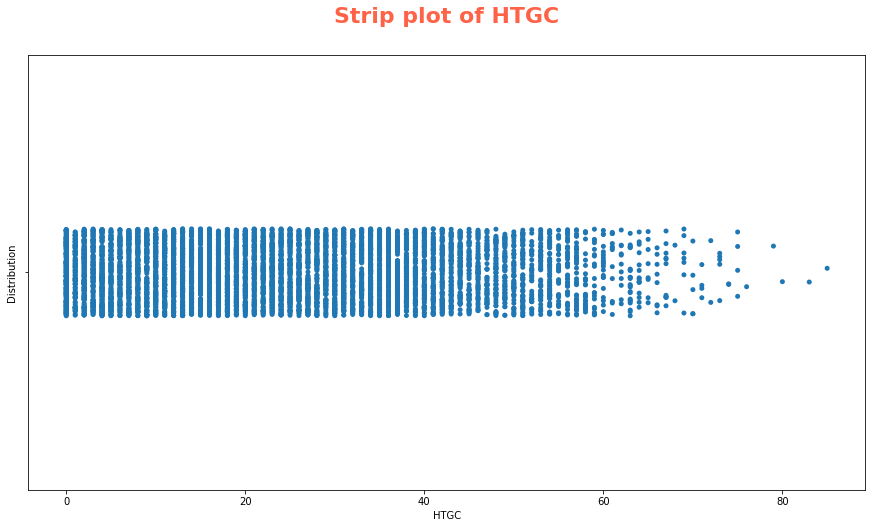

------------------------------

Mean of ATGC: 24.34751461988304
Median of ATGC: 23.0
Minimum value of ATGC: 0
Maximum value of ATGC: 82
Skewness of ATGC: 0.43948435848599476
Kurtosis of ATGC: -0.5410885094675013
Mode of ATGC 0    0
dtype: int64


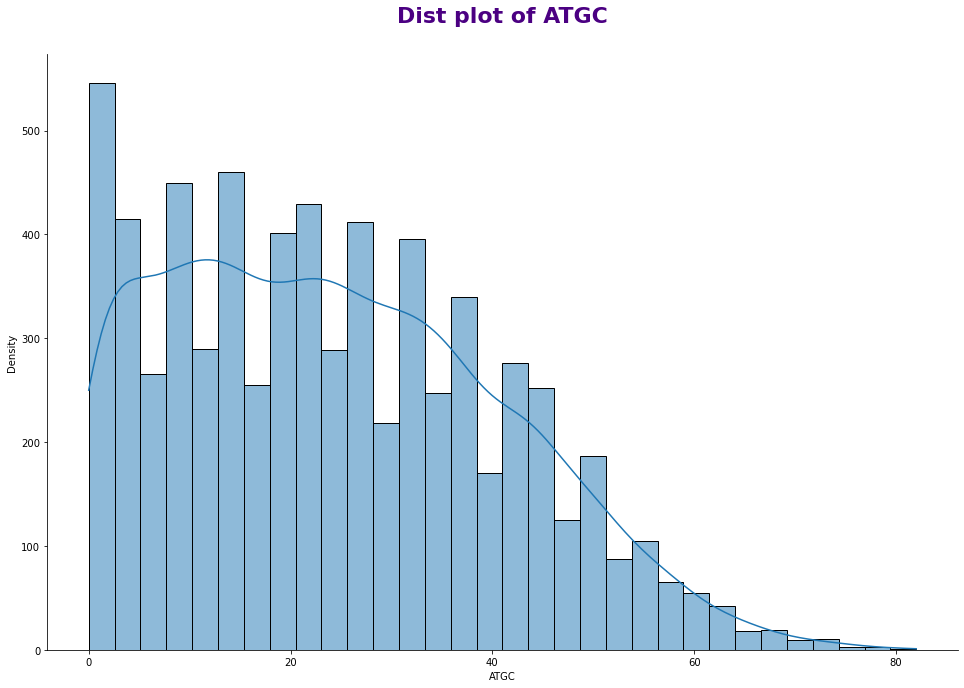

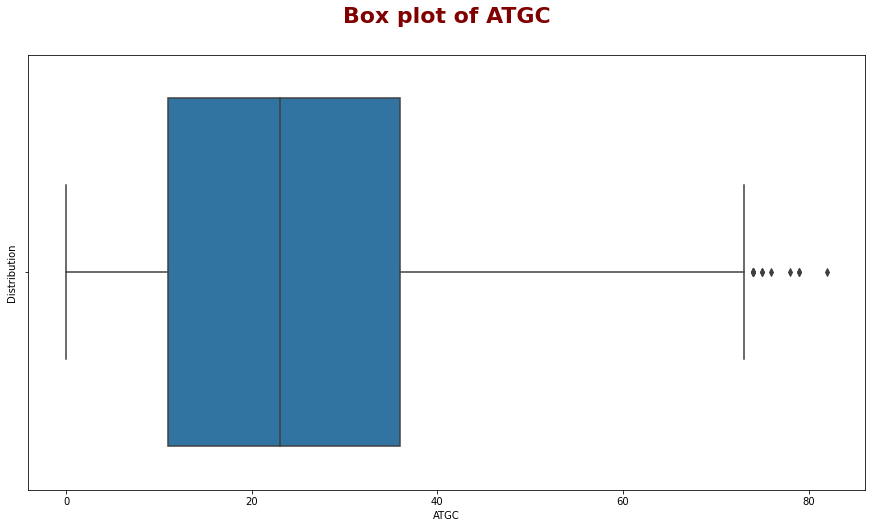

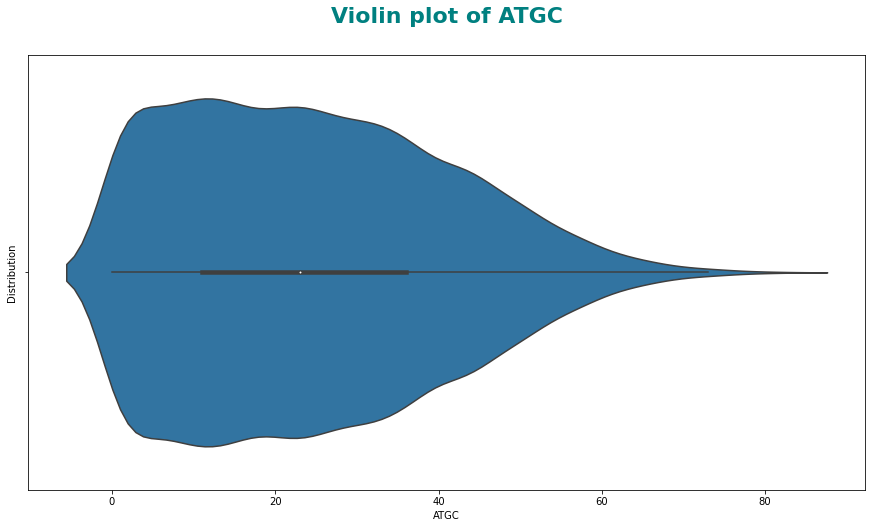

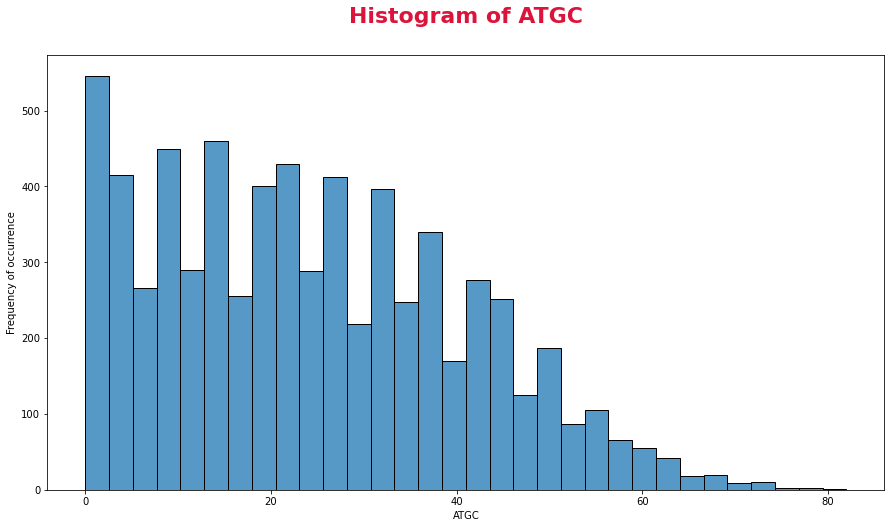

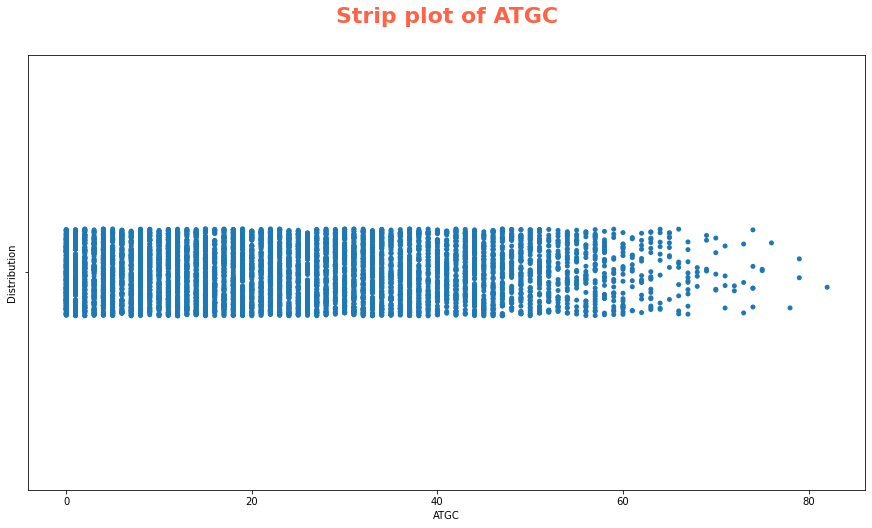

------------------------------

Mean of HTP: 1.2090137497952755
Median of HTP: 1.1724137931034482
Minimum value of HTP: 0.0
Maximum value of HTP: 2.736842105263158
Skewness of HTP: -0.033621532057585314
Kurtosis of HTP: -0.010279734410332697
Mode of HTP 0    1.0
dtype: float64


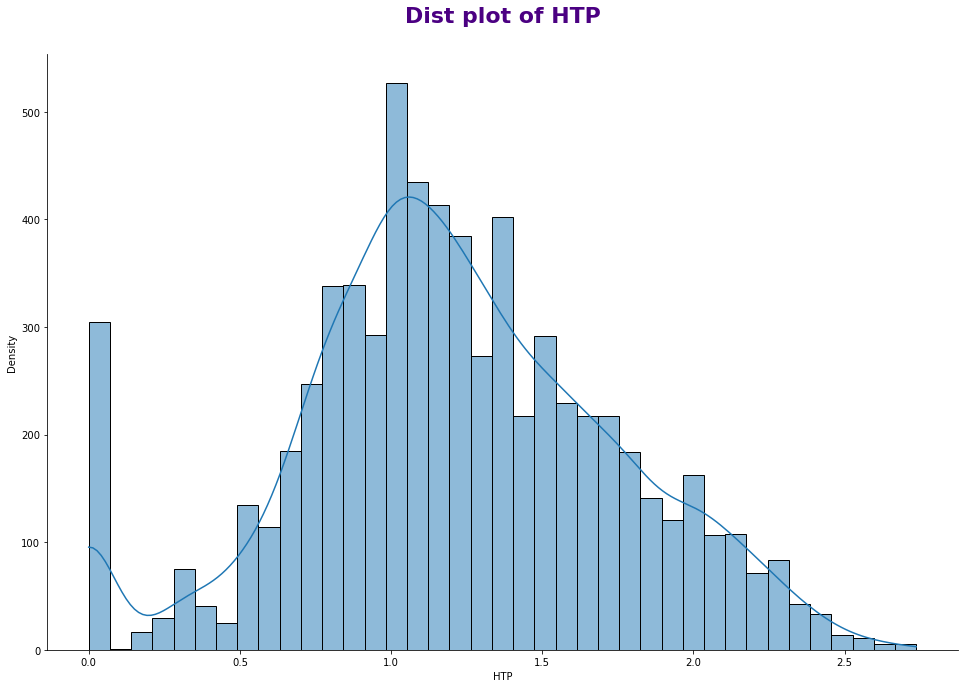

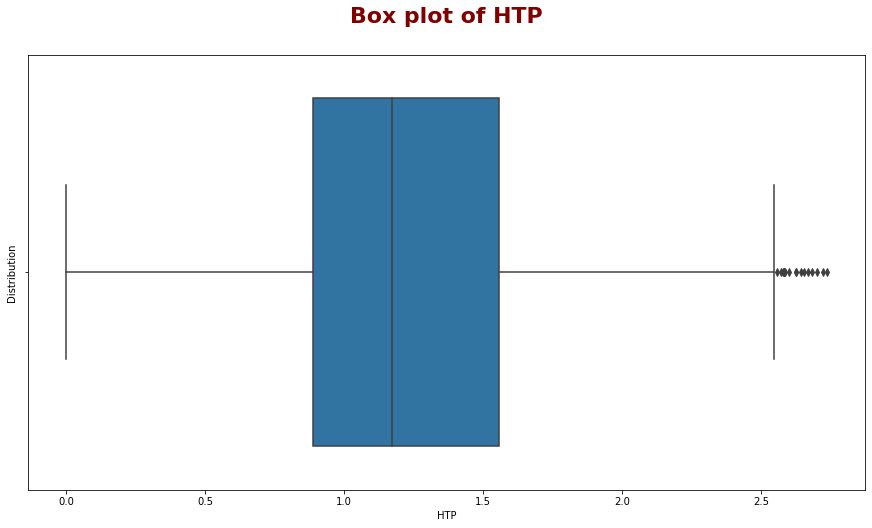

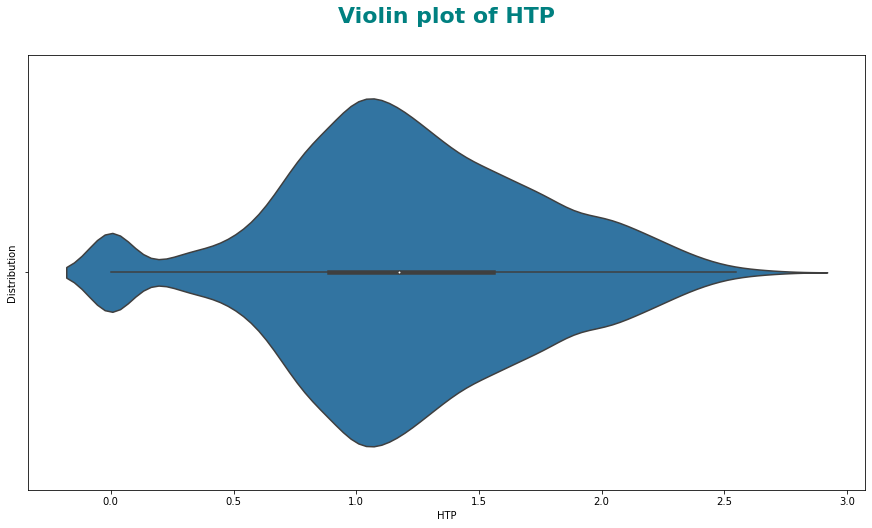

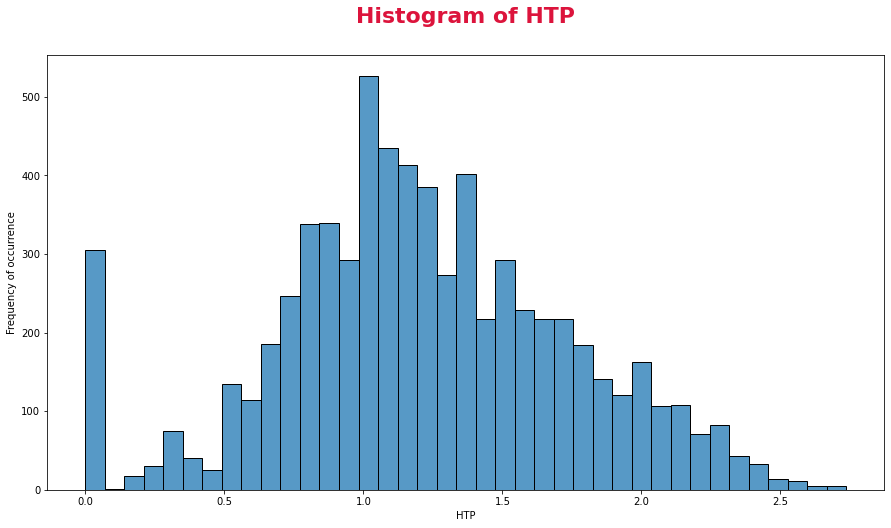

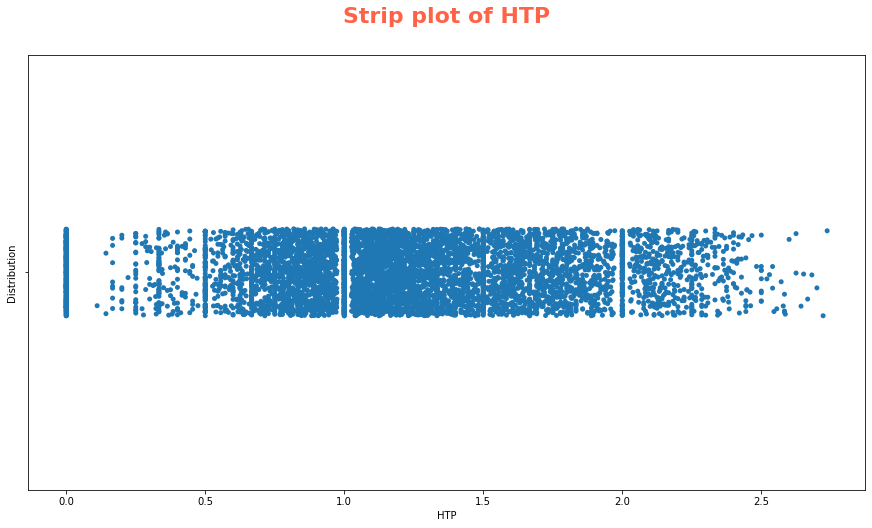

------------------------------

Mean of ATP: 1.226768267411768
Median of ATP: 1.1923076923076923
Minimum value of ATP: 0.0
Maximum value of ATP: 2.761904761904762
Skewness of ATP: -0.026304663930059
Kurtosis of ATP: 0.05006779823445795
Mode of ATP 0    1.0
dtype: float64


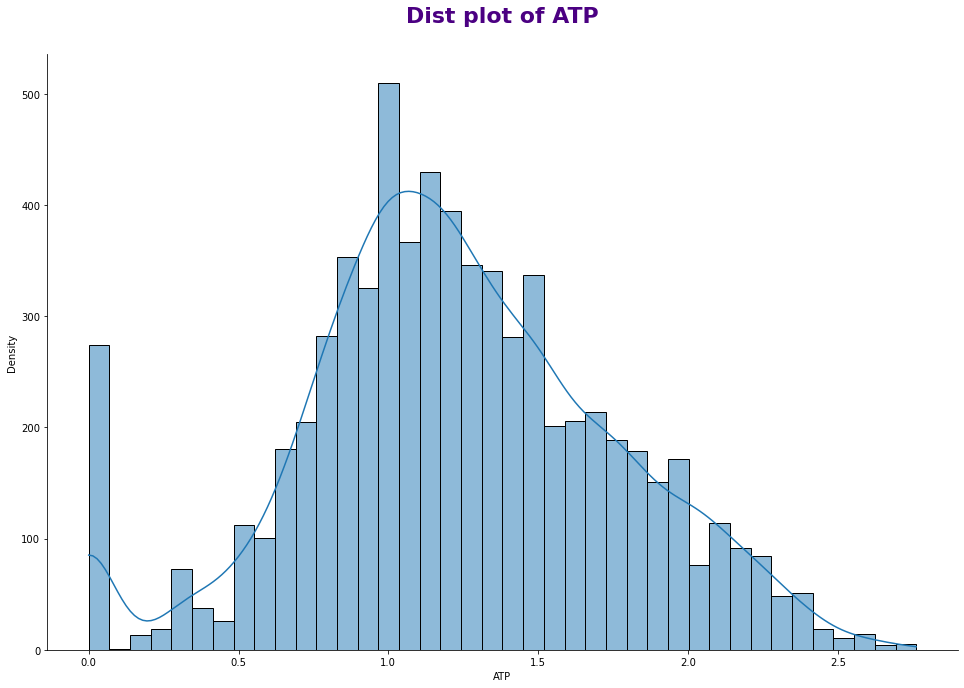

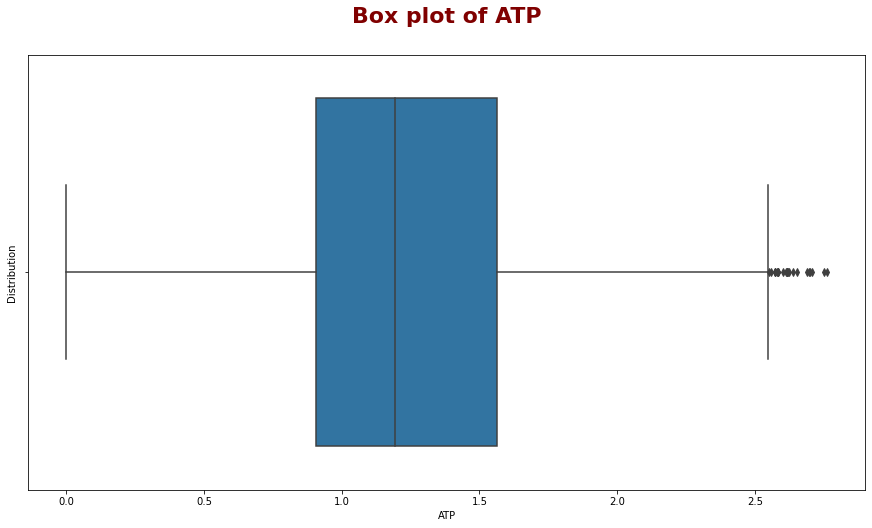

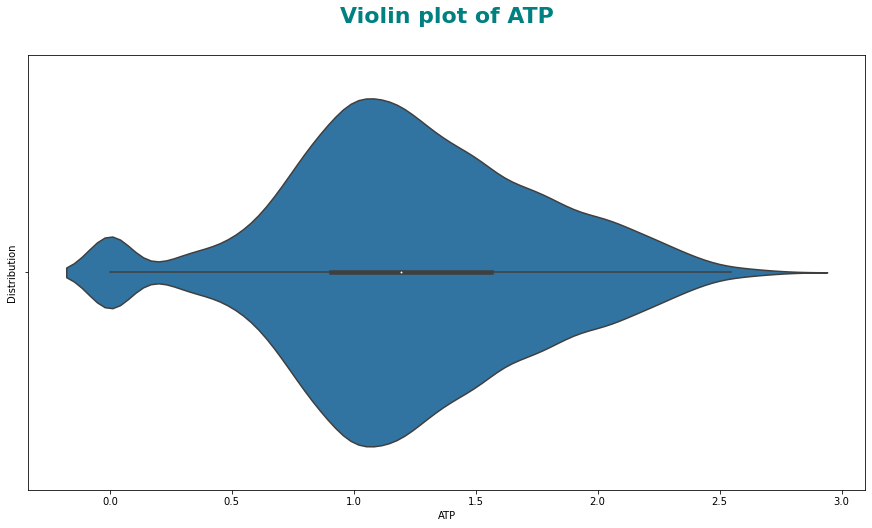

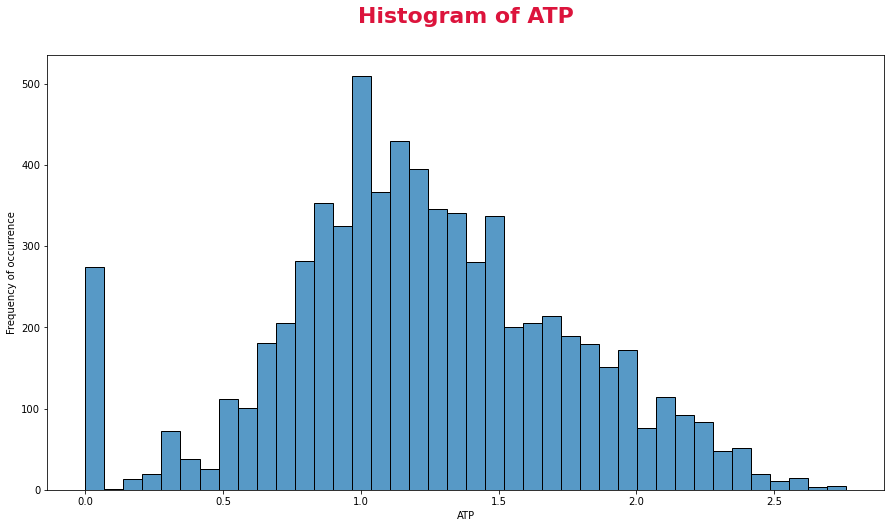

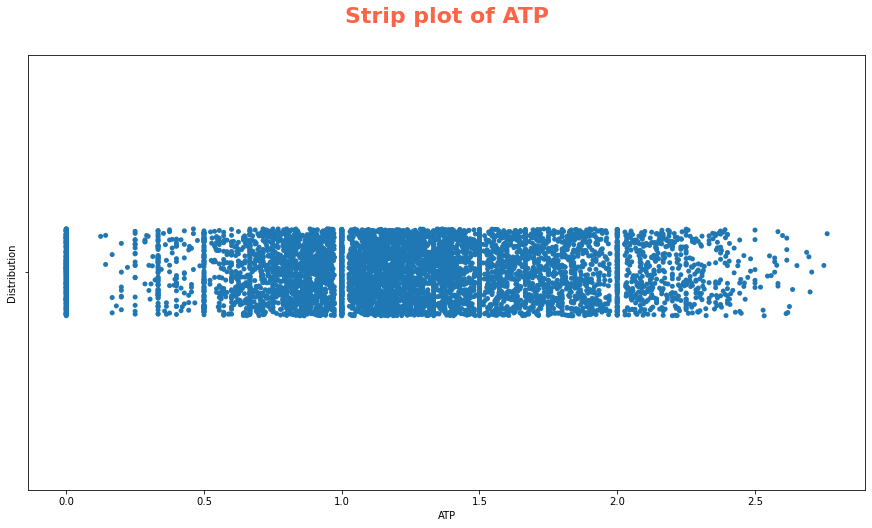

------------------------------

Mean of MW: 19.5
Median of MW: 19.5
Minimum value of MW: 1.0
Maximum value of MW: 38.0
Skewness of MW: 0.0
Kurtosis of MW: -1.2016643667587386
Mode of MW 0      1.0
1      2.0
2      3.0
3      4.0
4      5.0
5      6.0
6      7.0
7      8.0
8      9.0
9     10.0
10    11.0
11    12.0
12    13.0
13    14.0
14    15.0
15    16.0
16    17.0
17    18.0
18    19.0
19    20.0
20    21.0
21    22.0
22    23.0
23    24.0
24    25.0
25    26.0
26    27.0
27    28.0
28    29.0
29    30.0
30    31.0
31    32.0
32    33.0
33    34.0
34    35.0
35    36.0
36    37.0
37    38.0
dtype: float64


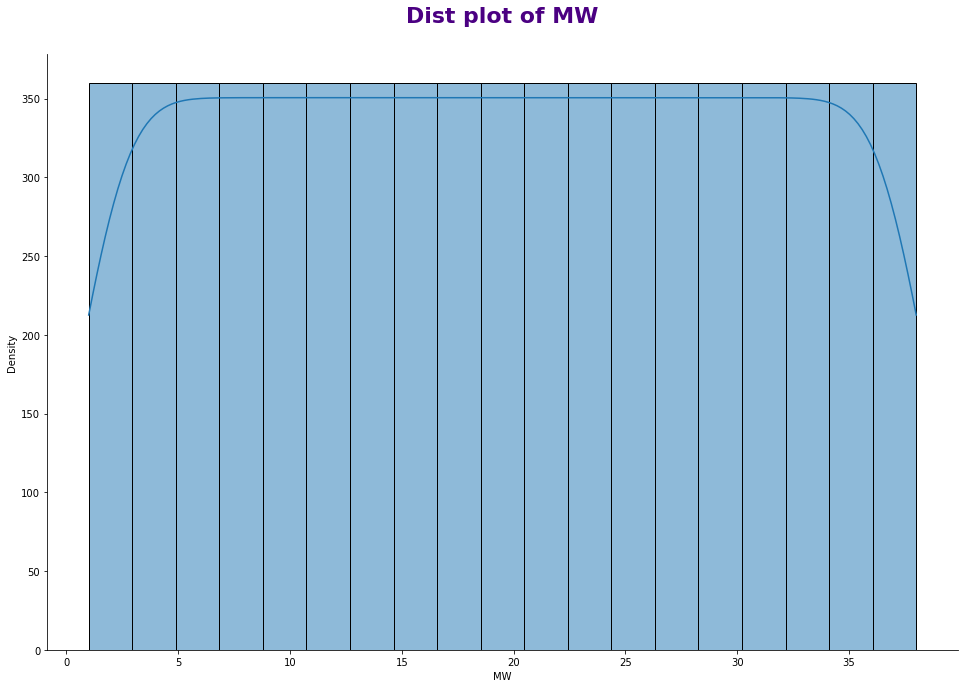

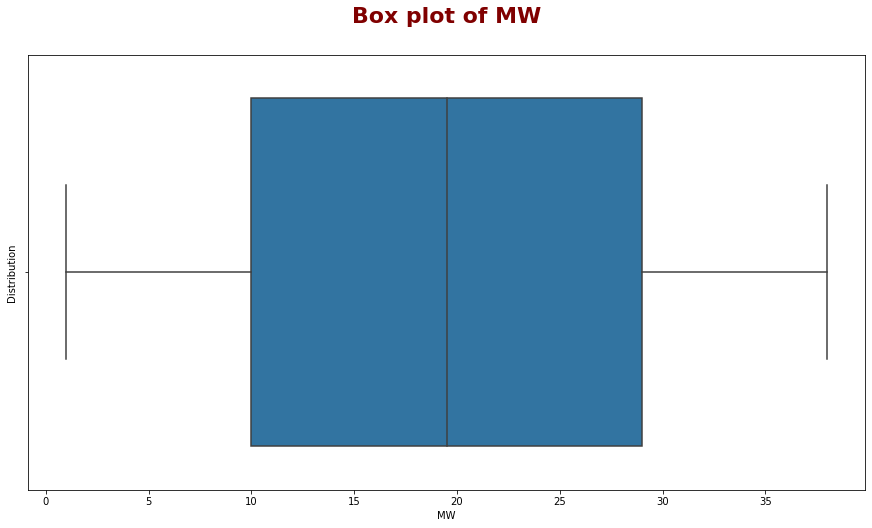

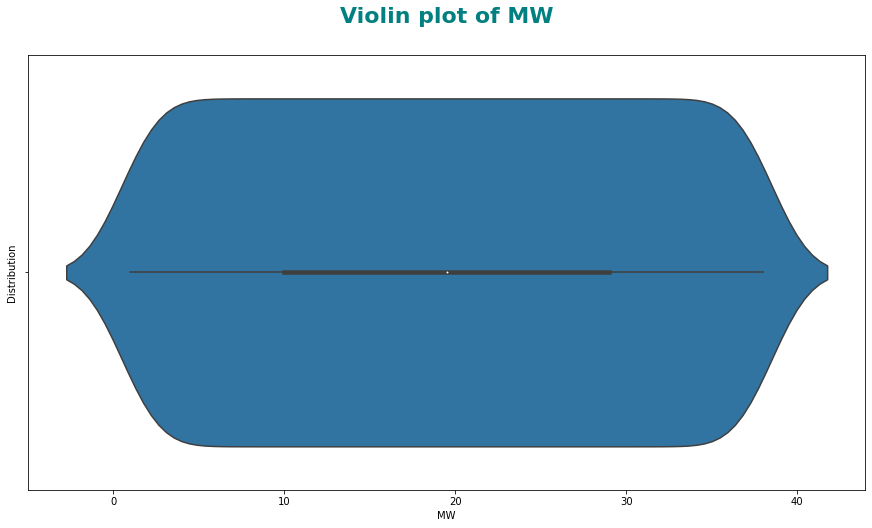

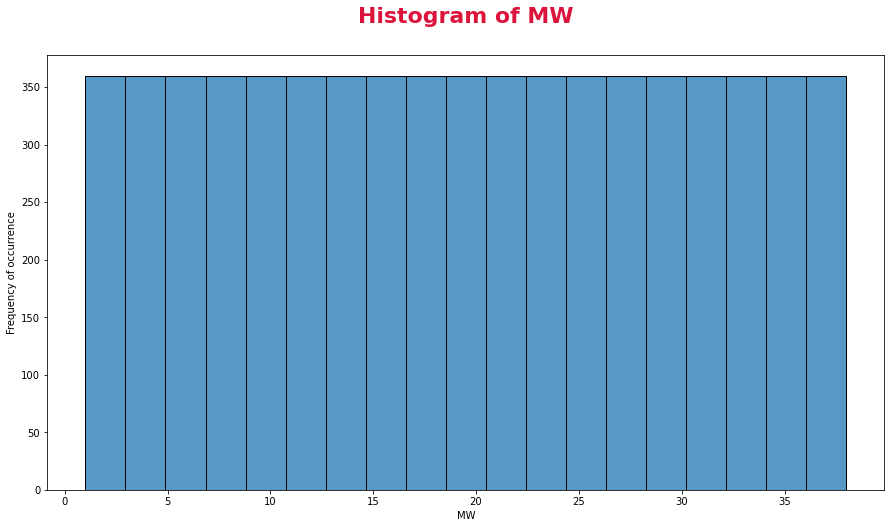

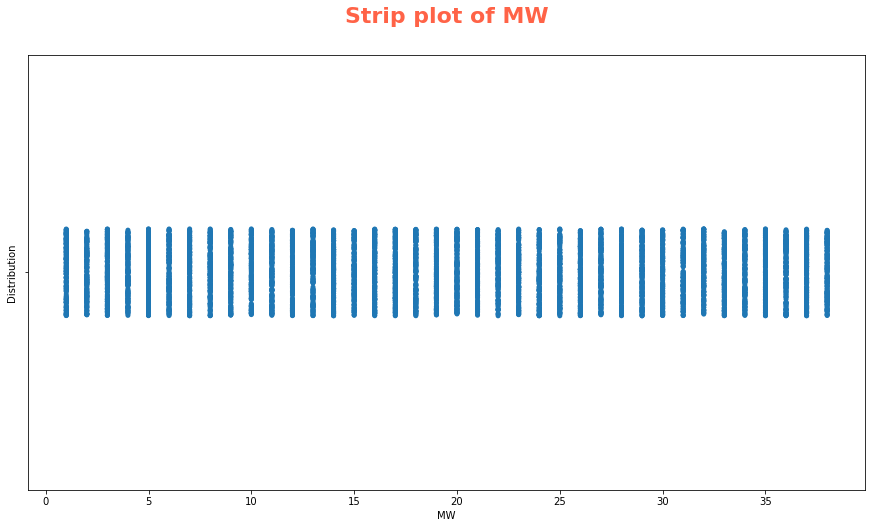

------------------------------

Mean of HTFormPts: 6.242690058479532
Median of HTFormPts: 6.0
Minimum value of HTFormPts: 0
Maximum value of HTFormPts: 15
Skewness of HTFormPts: 0.21914532360720457
Kurtosis of HTFormPts: -0.524208628492715
Mode of HTFormPts 0    4
dtype: int64


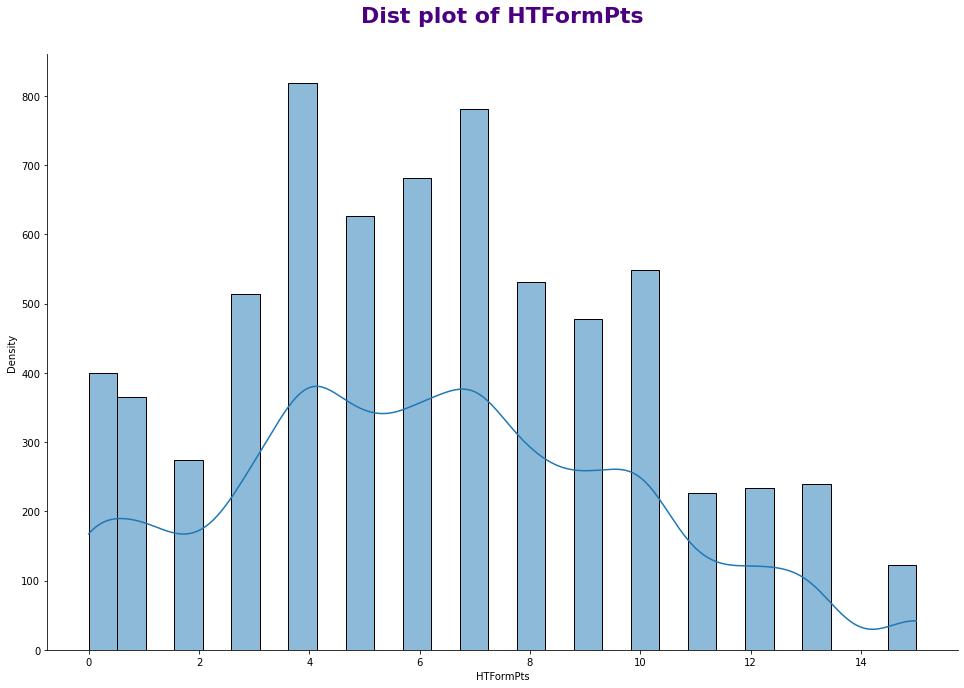

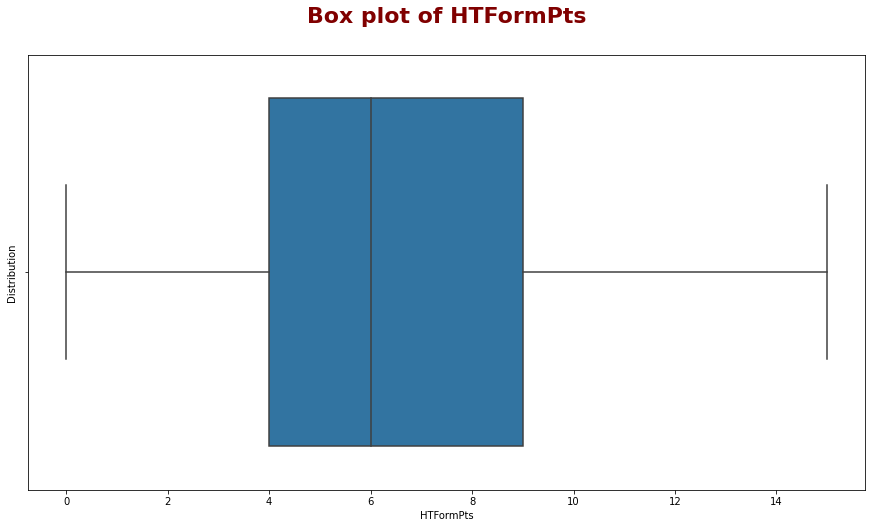

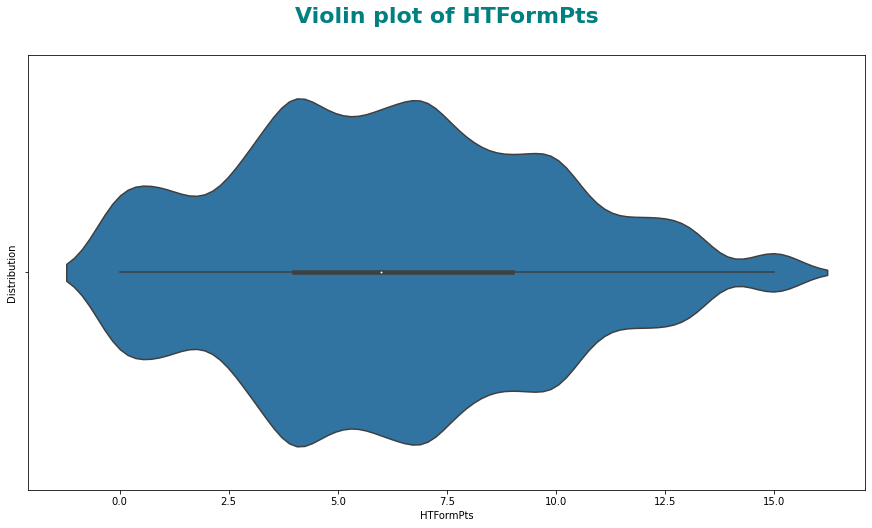

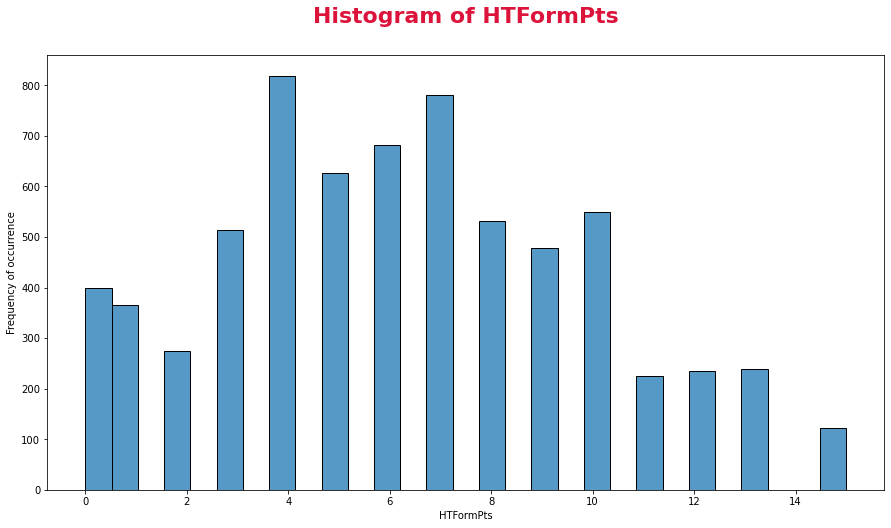

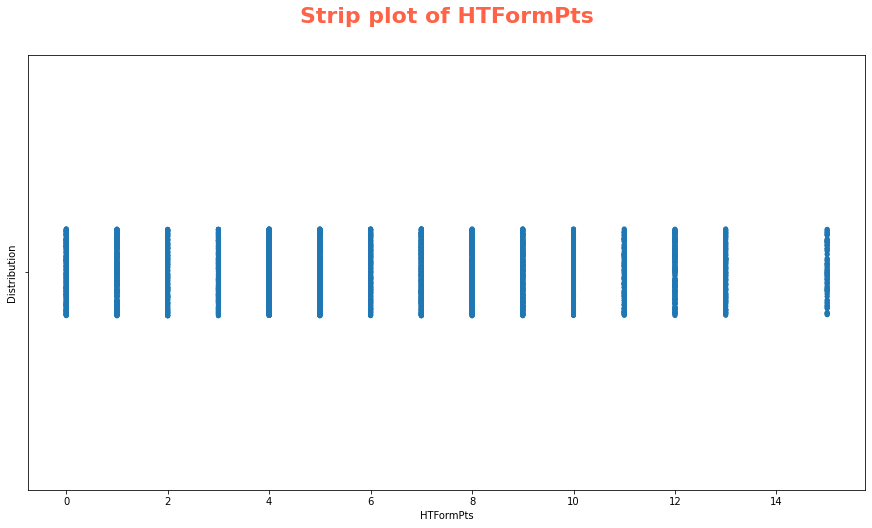

------------------------------

Mean of ATFormPts: 6.41359649122807
Median of ATFormPts: 6.0
Minimum value of ATFormPts: 0
Maximum value of ATFormPts: 15
Skewness of ATFormPts: 0.1828852546188718
Kurtosis of ATFormPts: -0.5529015939547315
Mode of ATFormPts 0    4
dtype: int64


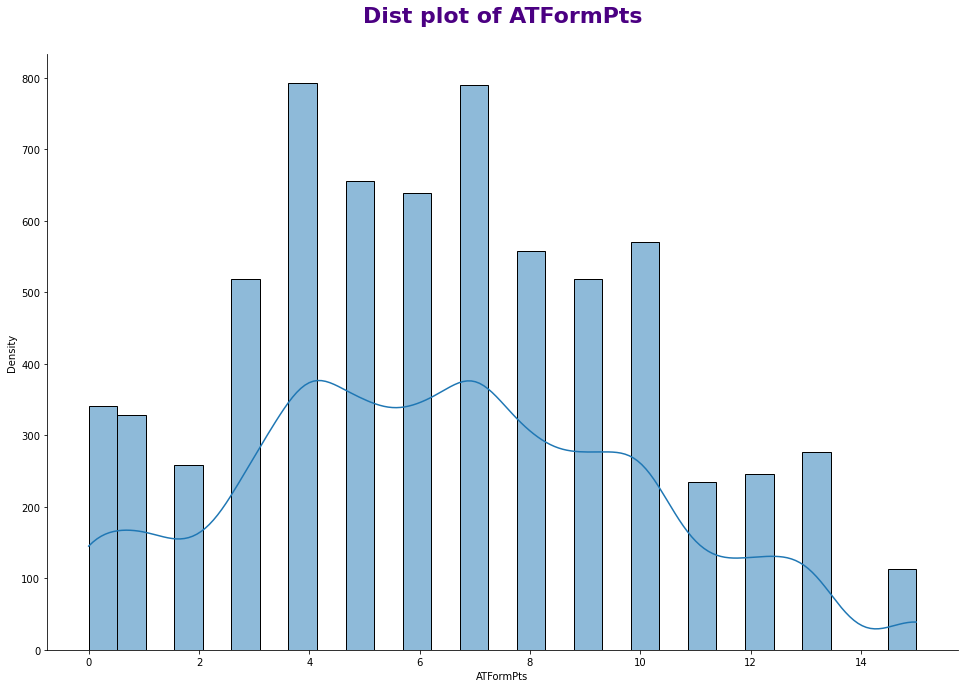

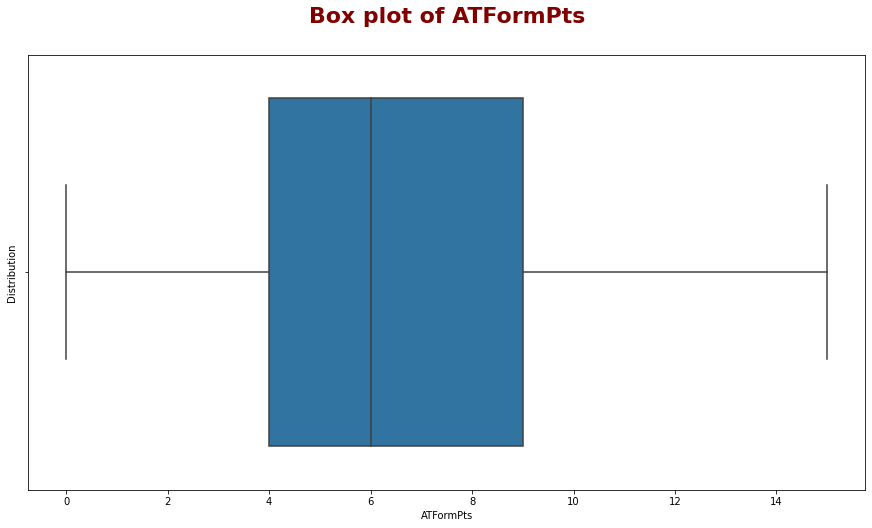

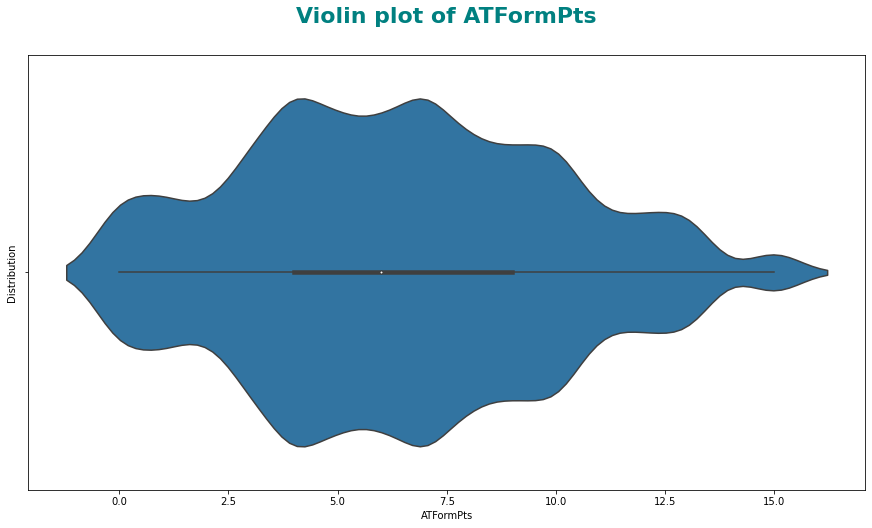

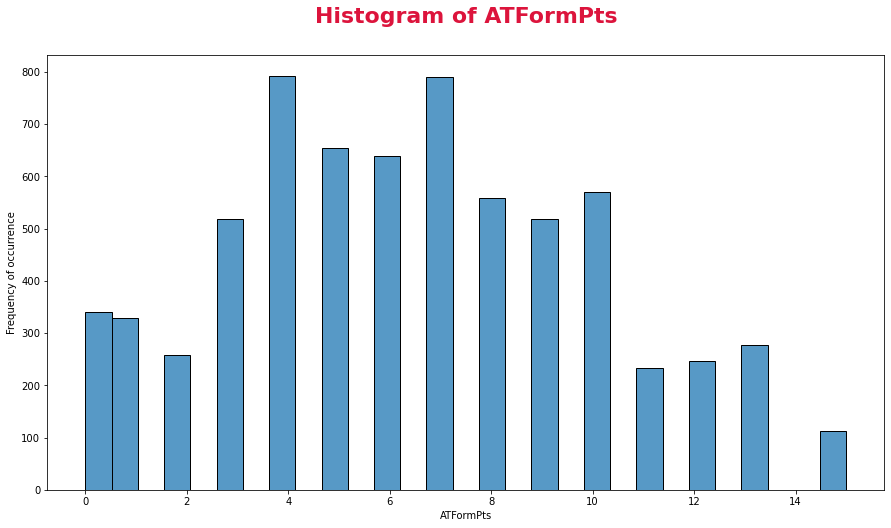

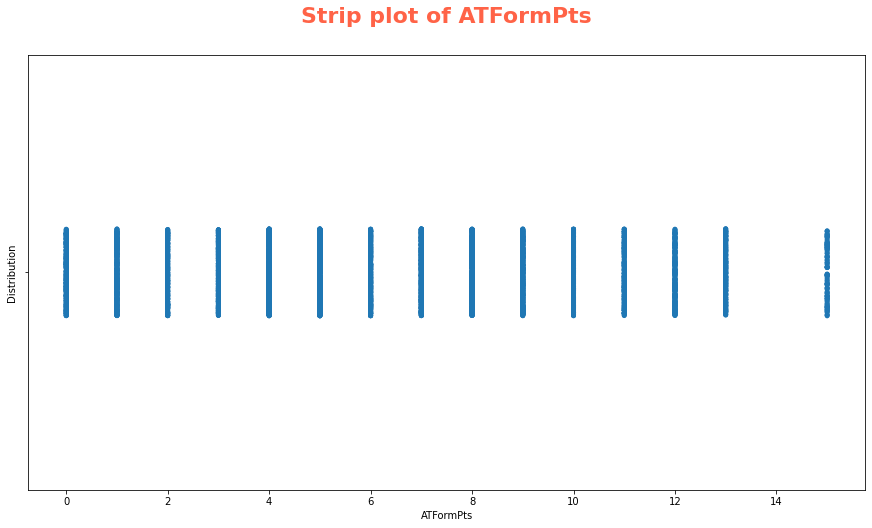

------------------------------

Mean of HTWinStreak3: 0.062280701754385964
Median of HTWinStreak3: 0.0
Minimum value of HTWinStreak3: 0
Maximum value of HTWinStreak3: 1
Skewness of HTWinStreak3: 3.6233290051605334
Kurtosis of HTWinStreak3: 11.131767897161788
Mode of HTWinStreak3 0    0
dtype: int64


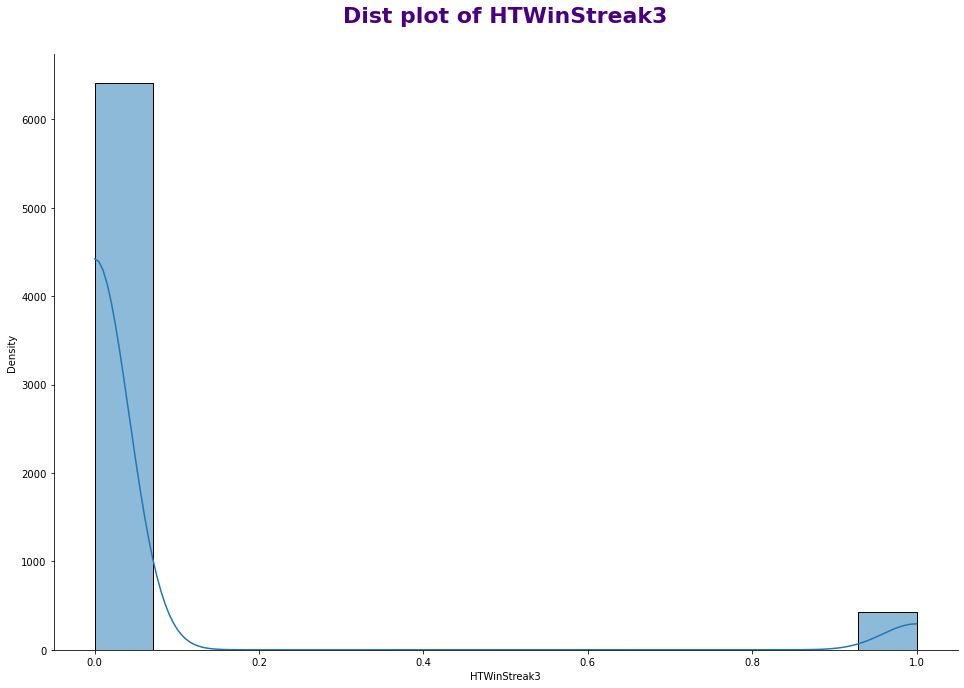

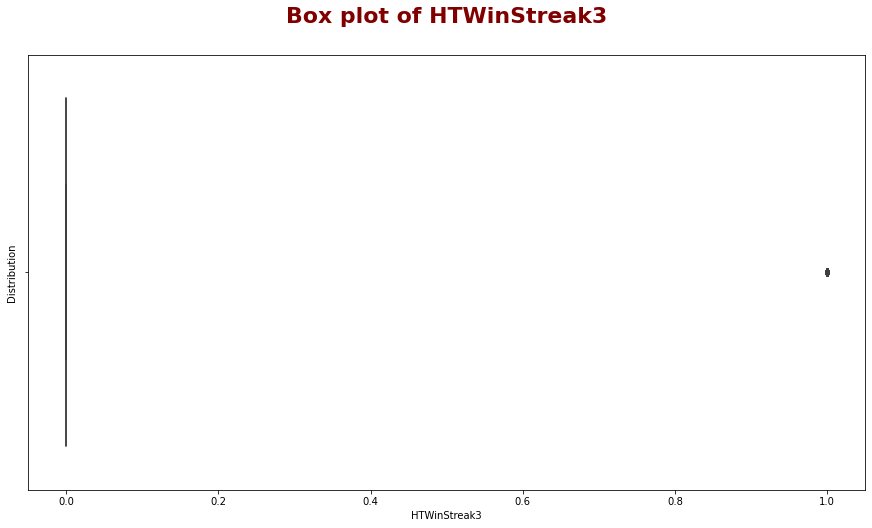

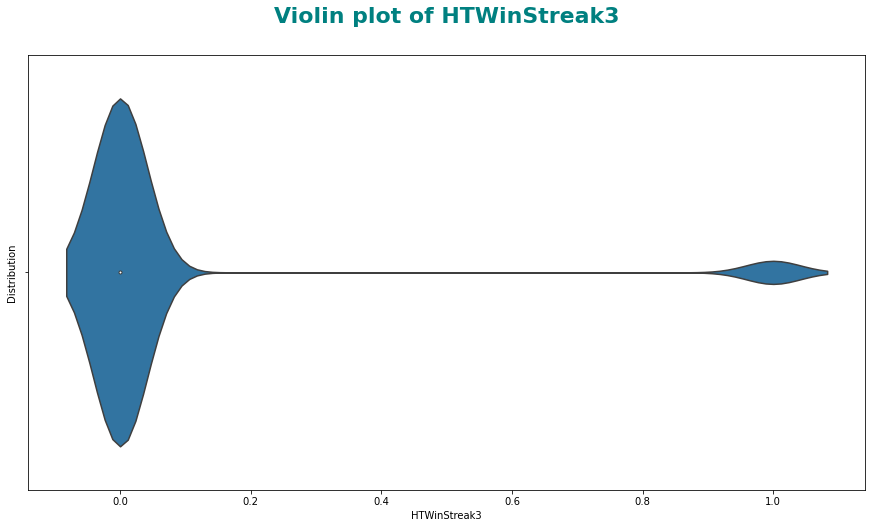

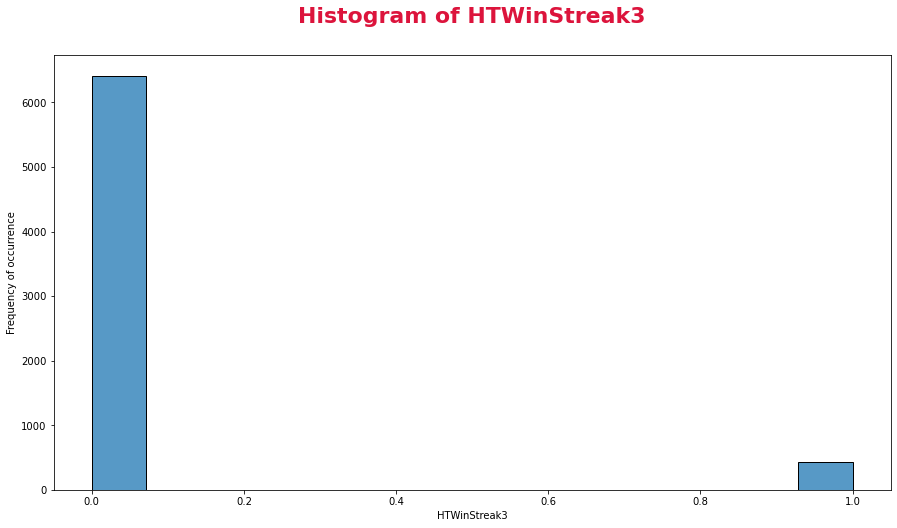

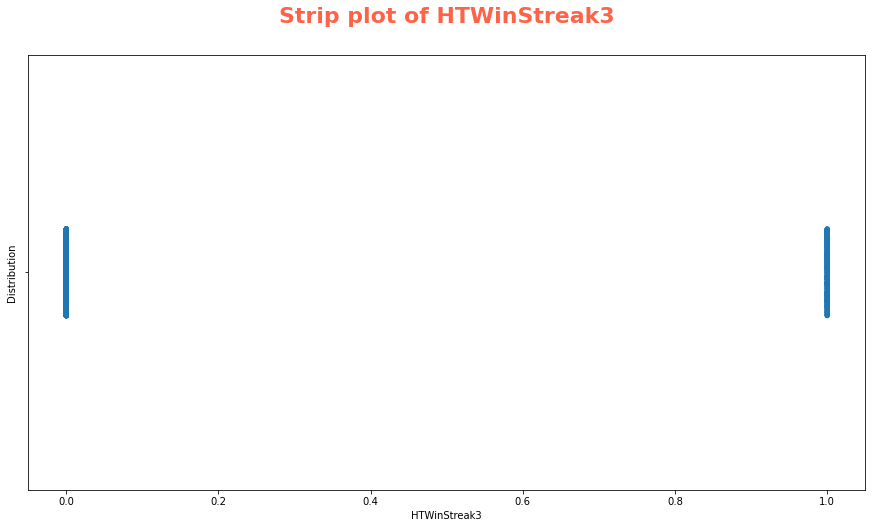

------------------------------

Mean of HTWinStreak5: 0.017982456140350878
Median of HTWinStreak5: 0.0
Minimum value of HTWinStreak5: 0
Maximum value of HTWinStreak5: 1
Skewness of HTWinStreak5: 7.256111860499593
Kurtosis of HTWinStreak5: 50.66597385944695
Mode of HTWinStreak5 0    0
dtype: int64


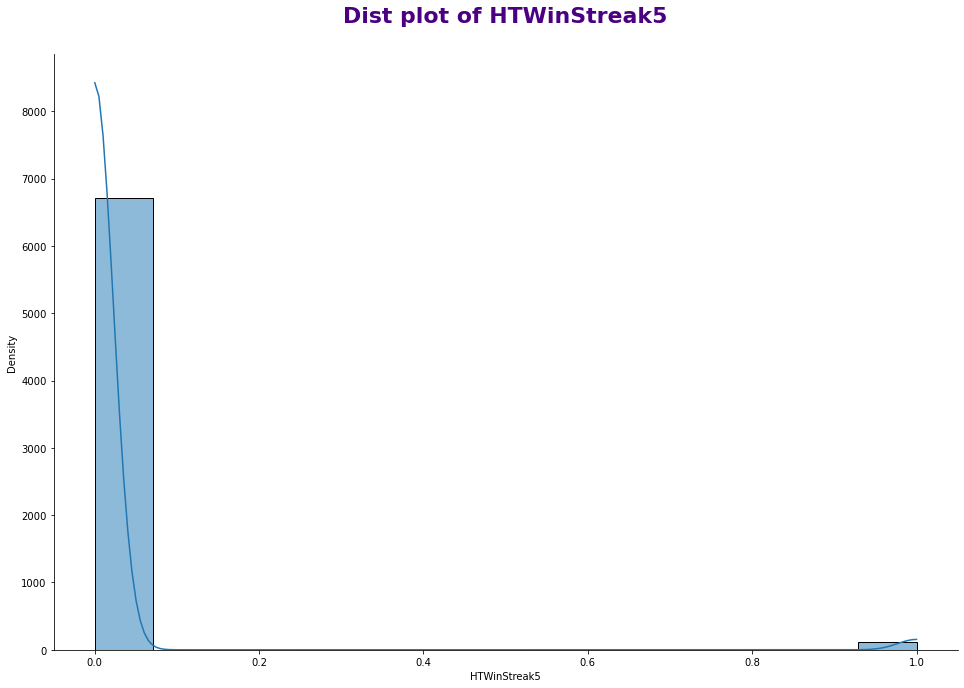

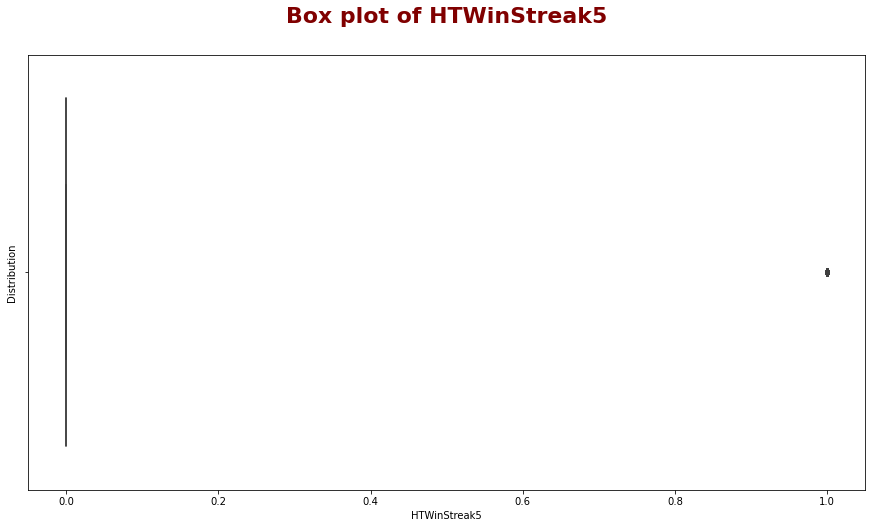

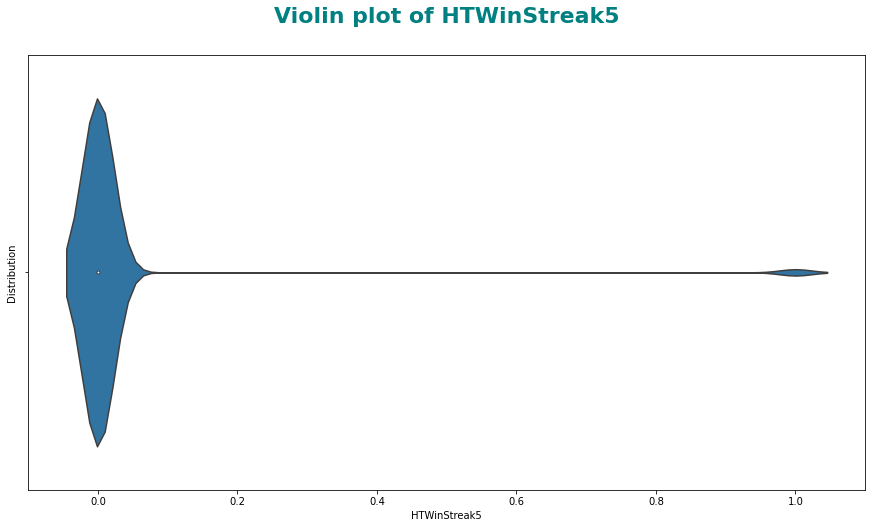

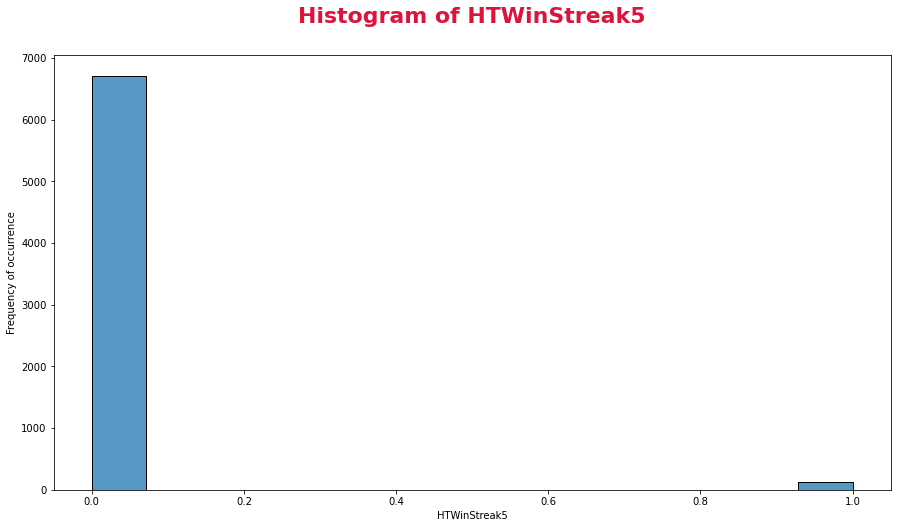

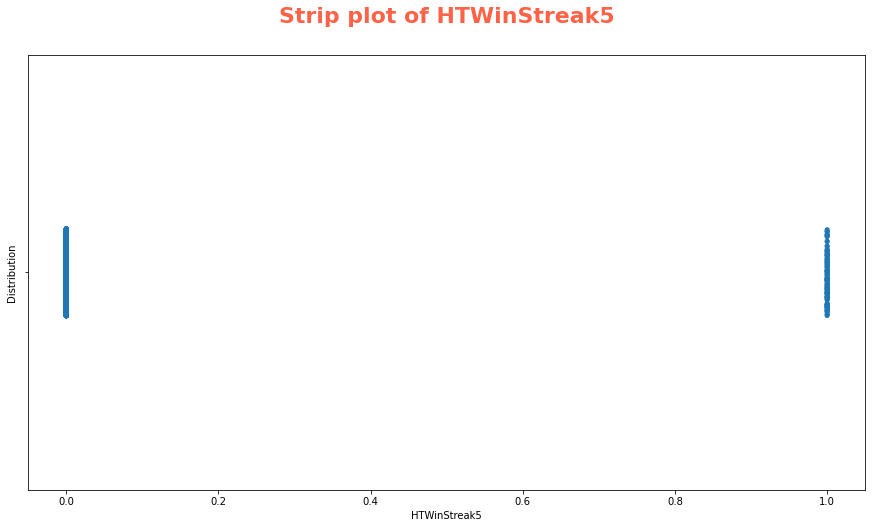

------------------------------

Mean of HTLossStreak3: 0.05760233918128655
Median of HTLossStreak3: 0.0
Minimum value of HTLossStreak3: 0
Maximum value of HTLossStreak3: 1
Skewness of HTLossStreak3: 3.7984018965282083
Kurtosis of HTLossStreak3: 12.431491821324634
Mode of HTLossStreak3 0    0
dtype: int64


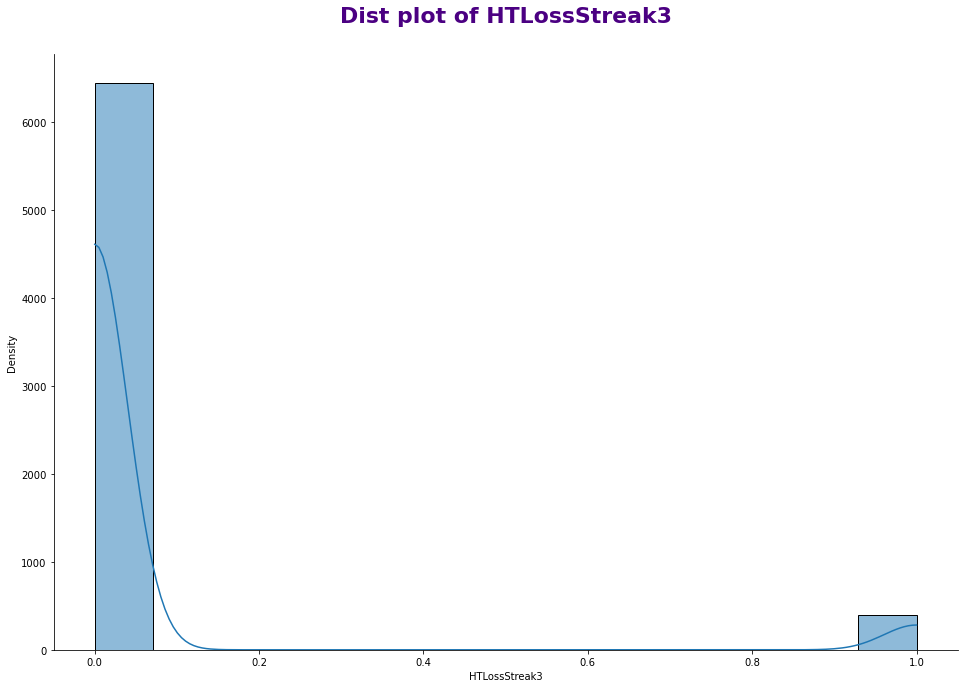

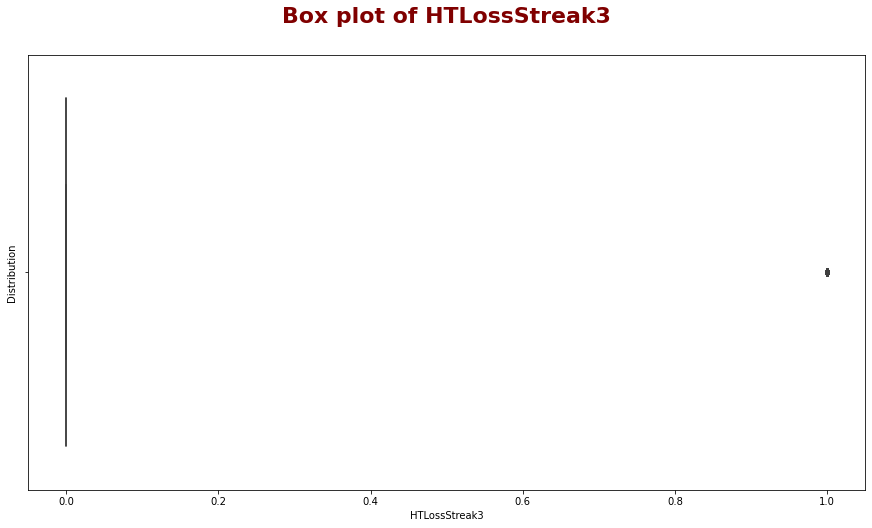

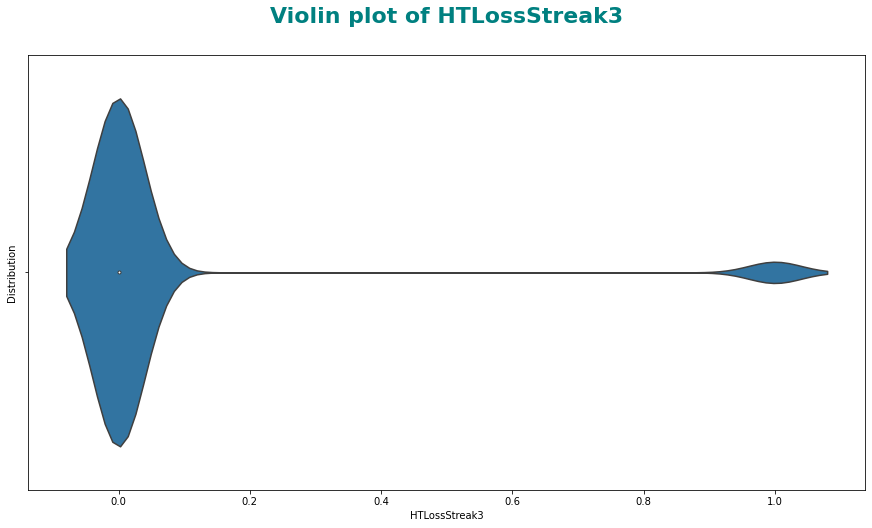

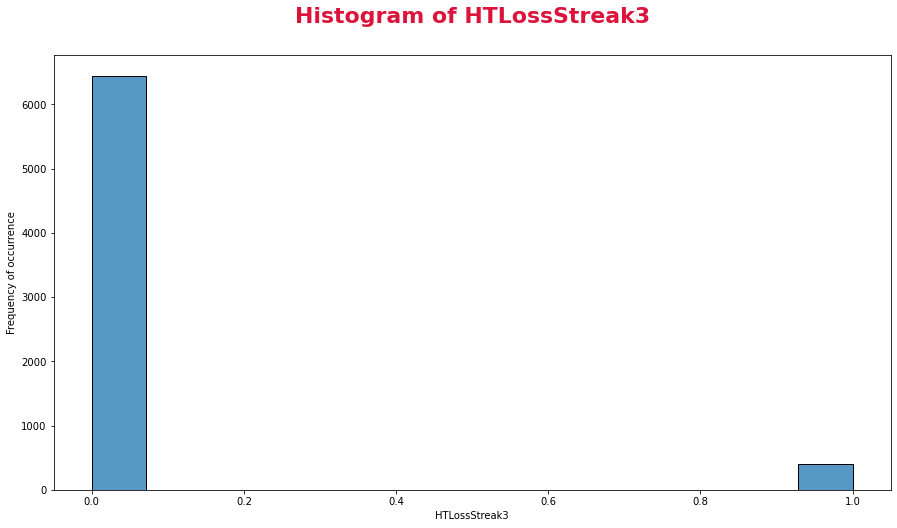

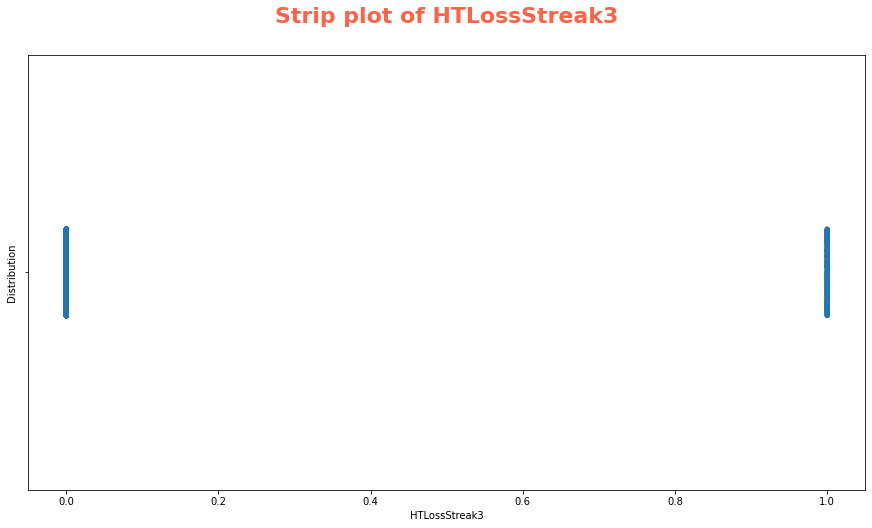

------------------------------

Mean of HTLossStreak5: 0.01432748538011696
Median of HTLossStreak5: 0.0
Minimum value of HTLossStreak5: 0
Maximum value of HTLossStreak5: 1
Skewness of HTLossStreak5: 8.175559208546561
Kurtosis of HTLossStreak5: 64.85873282951536
Mode of HTLossStreak5 0    0
dtype: int64


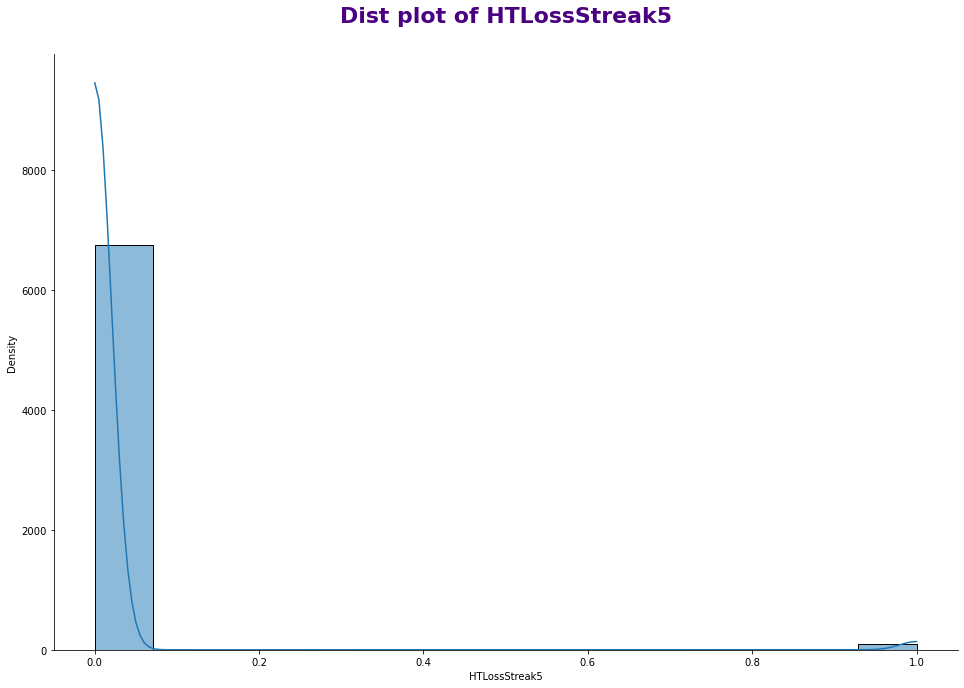

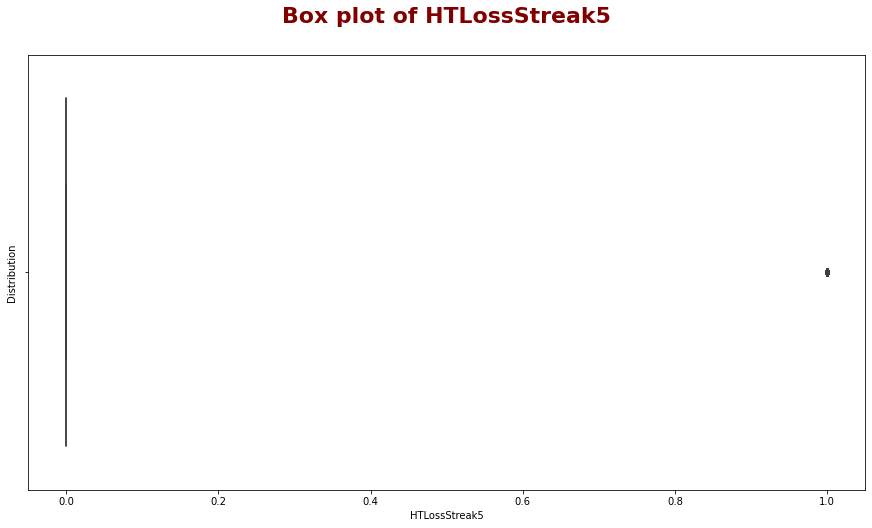

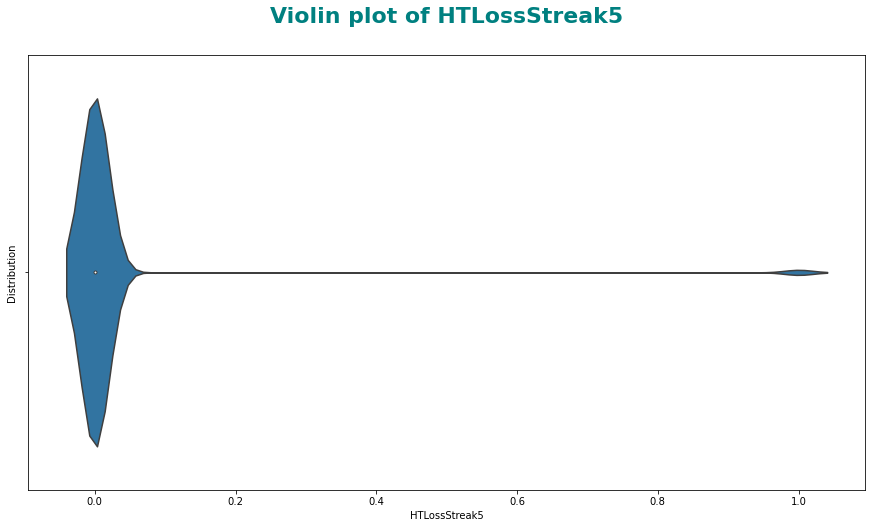

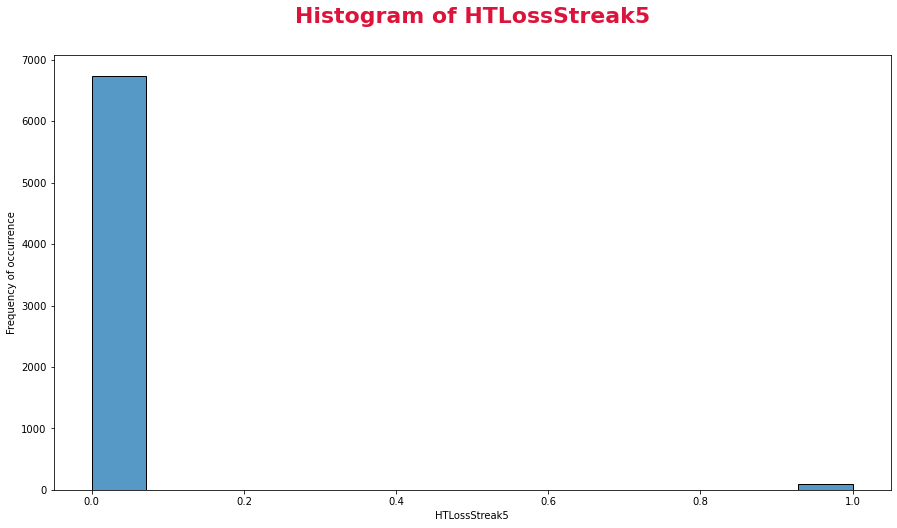

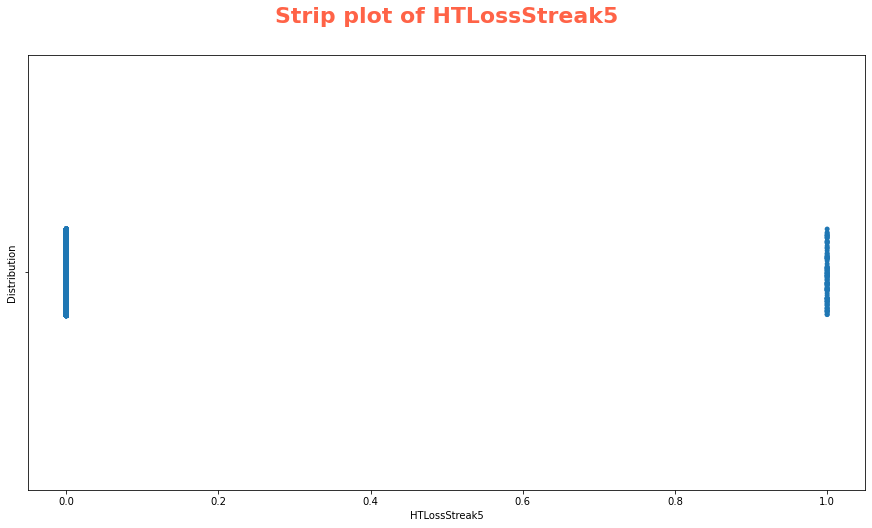

------------------------------

Mean of ATWinStreak3: 0.06286549707602339
Median of ATWinStreak3: 0.0
Minimum value of ATWinStreak3: 0
Maximum value of ATWinStreak3: 1
Skewness of ATWinStreak3: 3.6027422921598107
Kurtosis of ATWinStreak3: 10.982963331132213
Mode of ATWinStreak3 0    0
dtype: int64


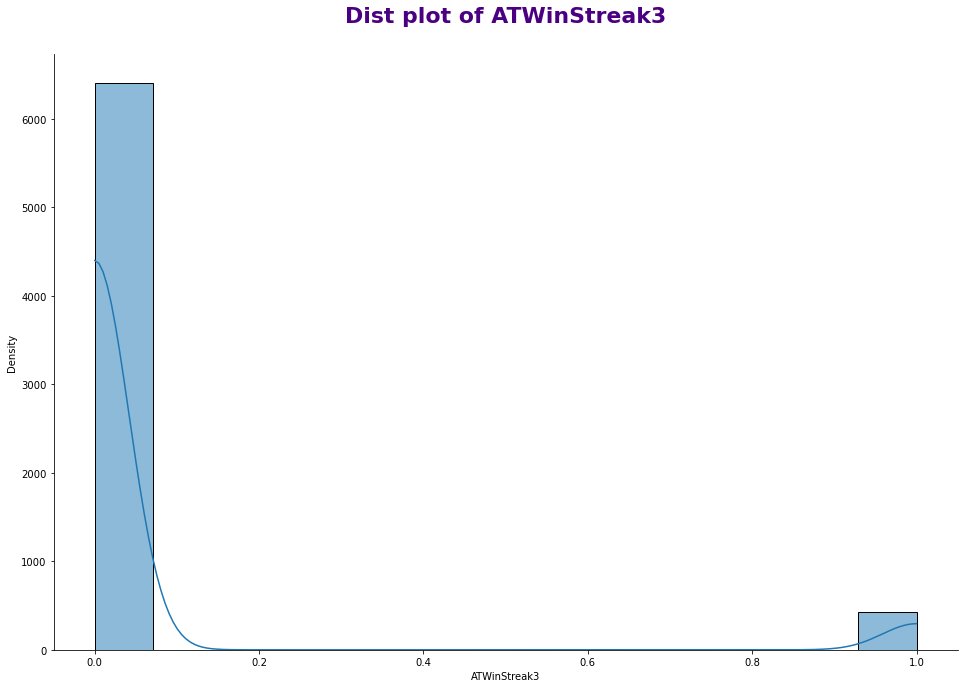

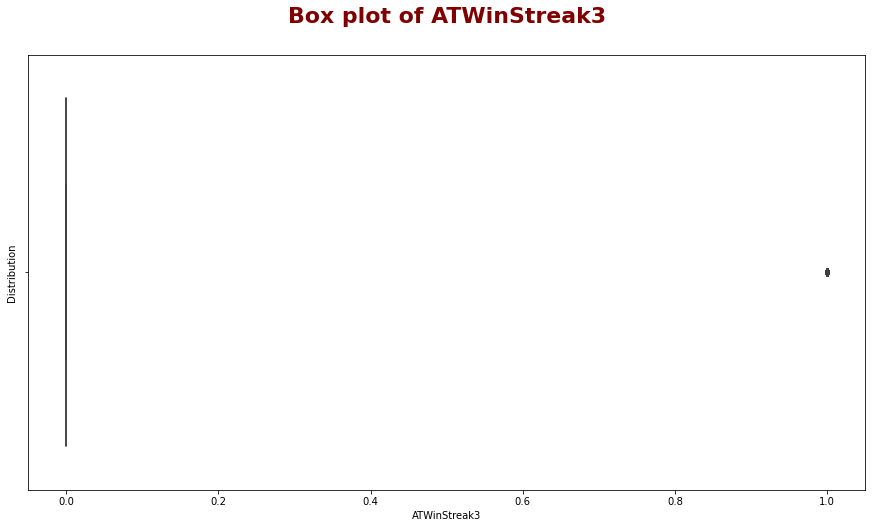

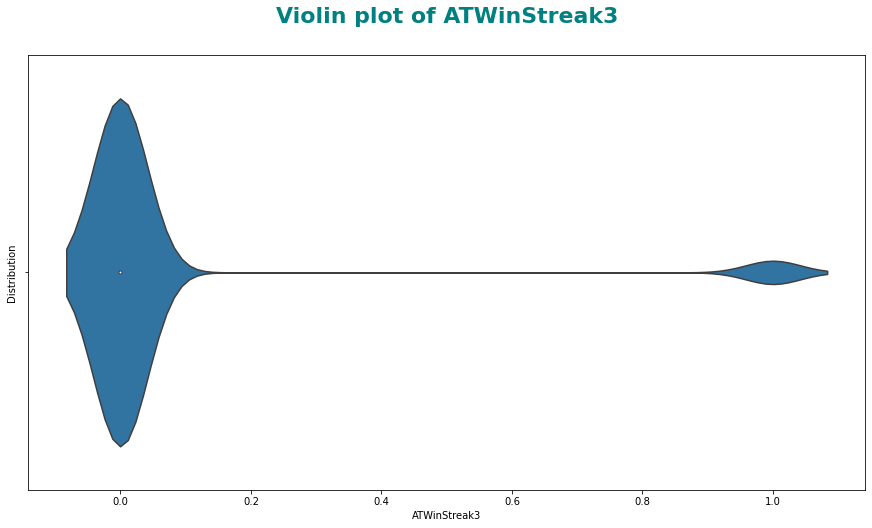

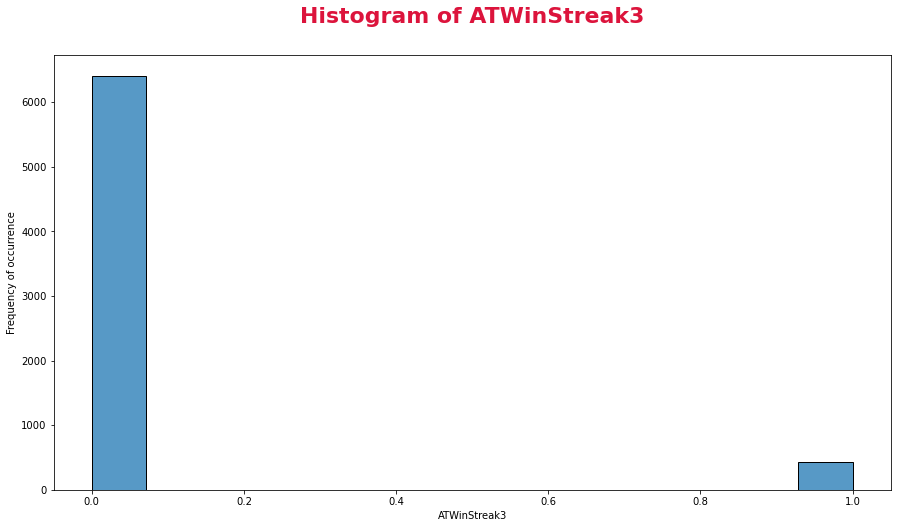

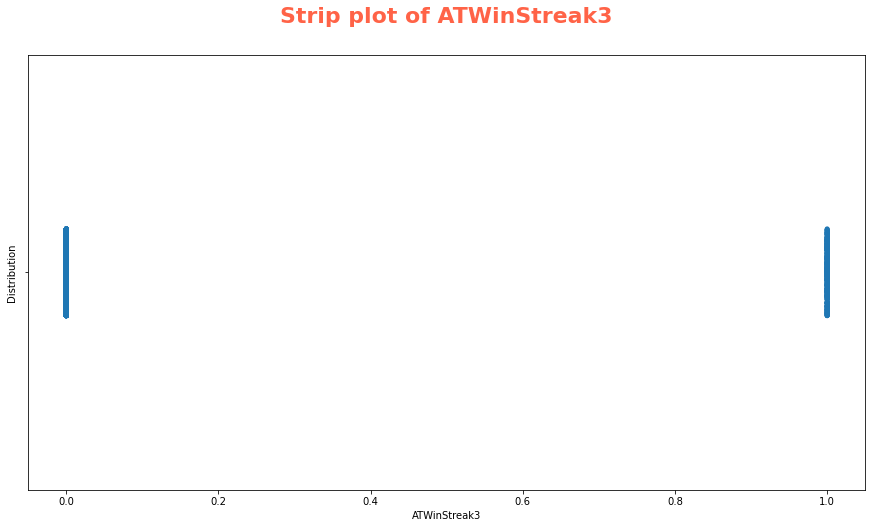

------------------------------

Mean of ATWinStreak5: 0.01652046783625731
Median of ATWinStreak5: 0.0
Minimum value of ATWinStreak5: 0
Maximum value of ATWinStreak5: 1
Skewness of ATWinStreak5: 7.5876888130775635
Kurtosis of ATWinStreak5: 55.589275613444386
Mode of ATWinStreak5 0    0
dtype: int64


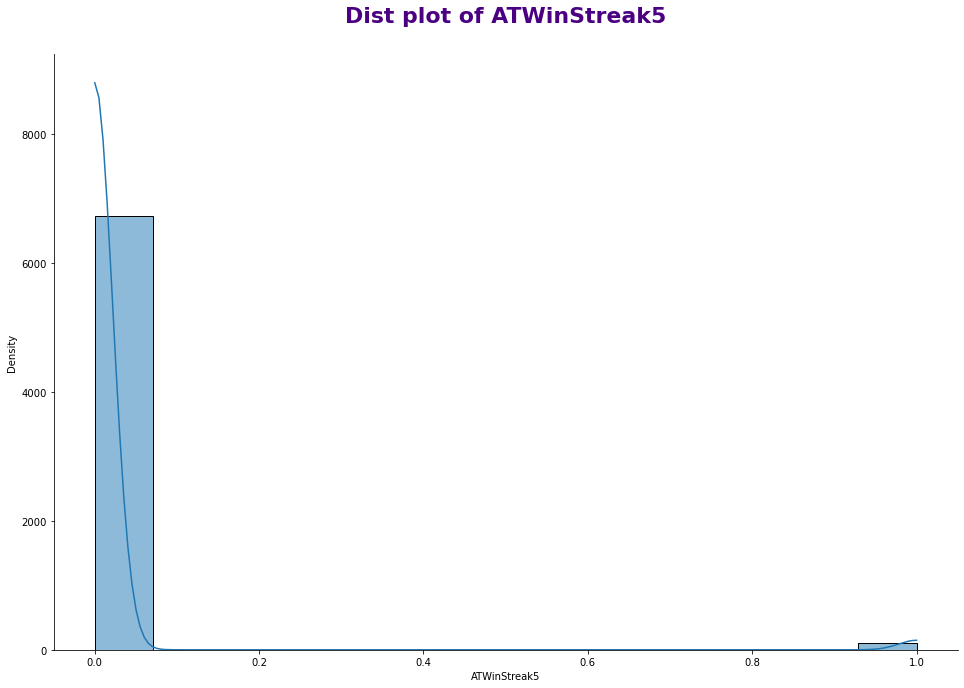

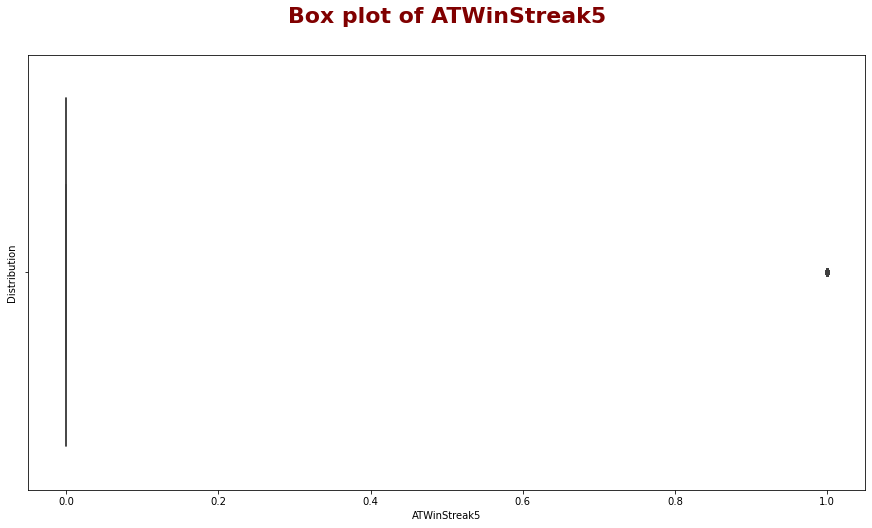

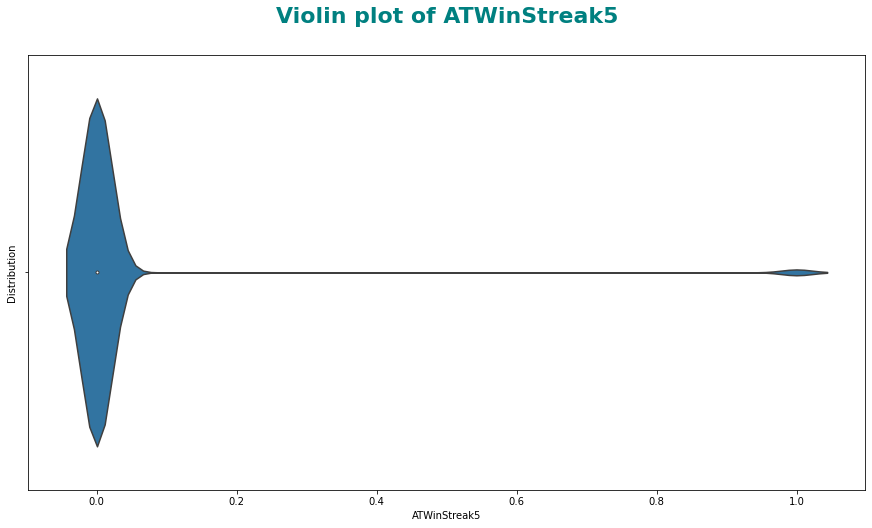

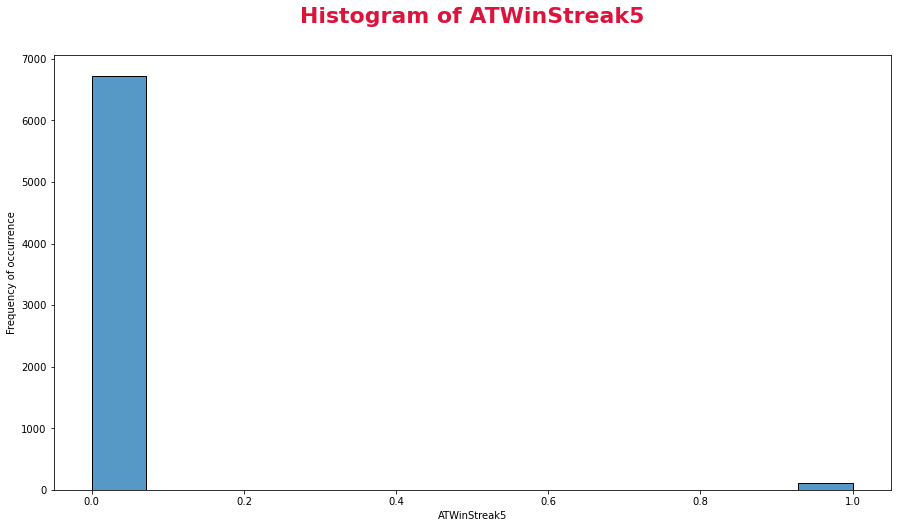

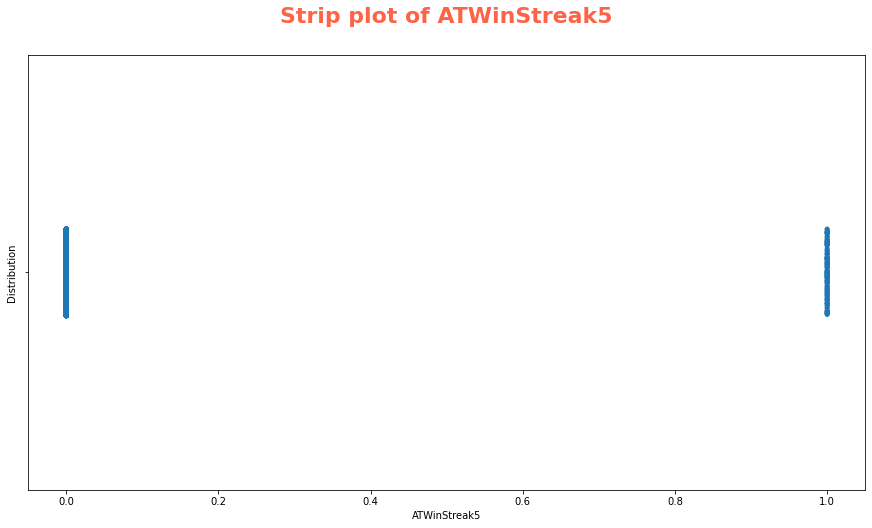

------------------------------

Mean of ATLossStreak3: 0.0510233918128655
Median of ATLossStreak3: 0.0
Minimum value of ATLossStreak3: 0
Maximum value of ATLossStreak3: 1
Skewness of ATLossStreak3: 4.08165741478331
Kurtosis of ATLossStreak3: 14.66421494847867
Mode of ATLossStreak3 0    0
dtype: int64


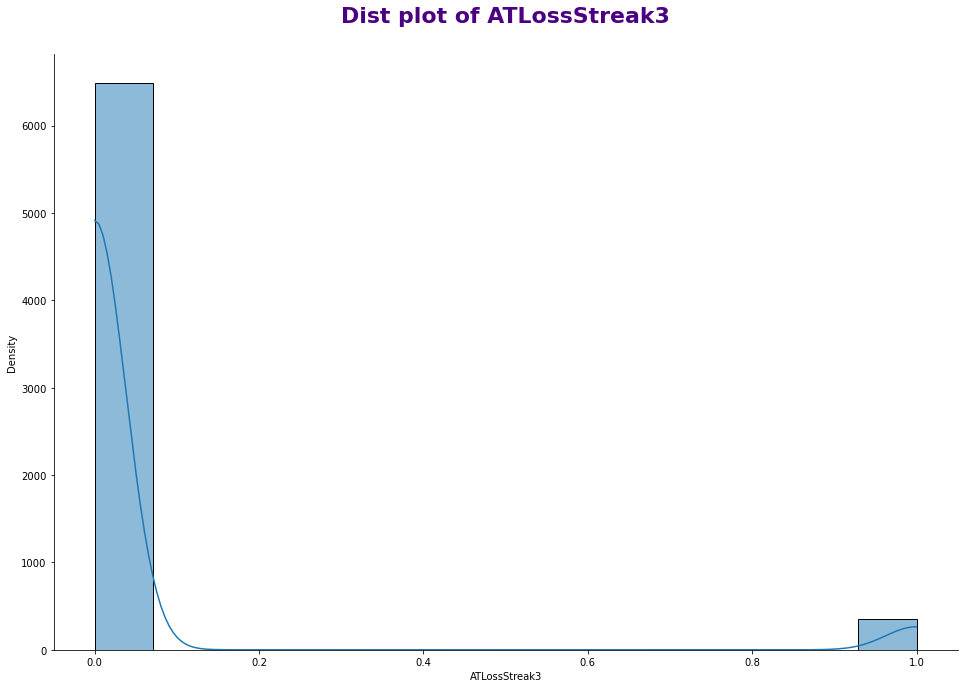

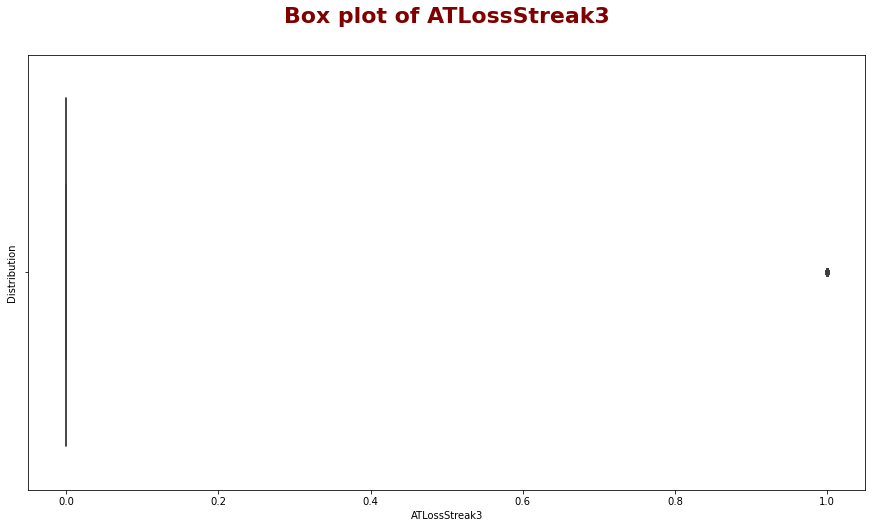

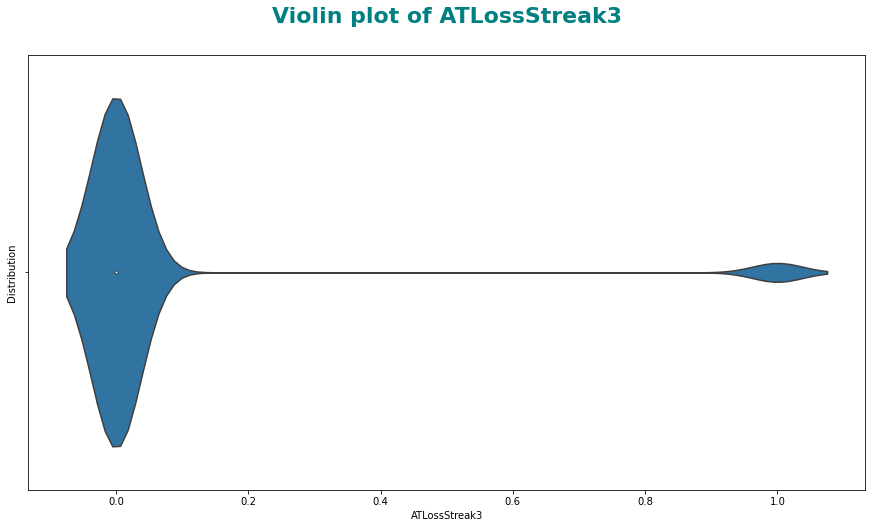

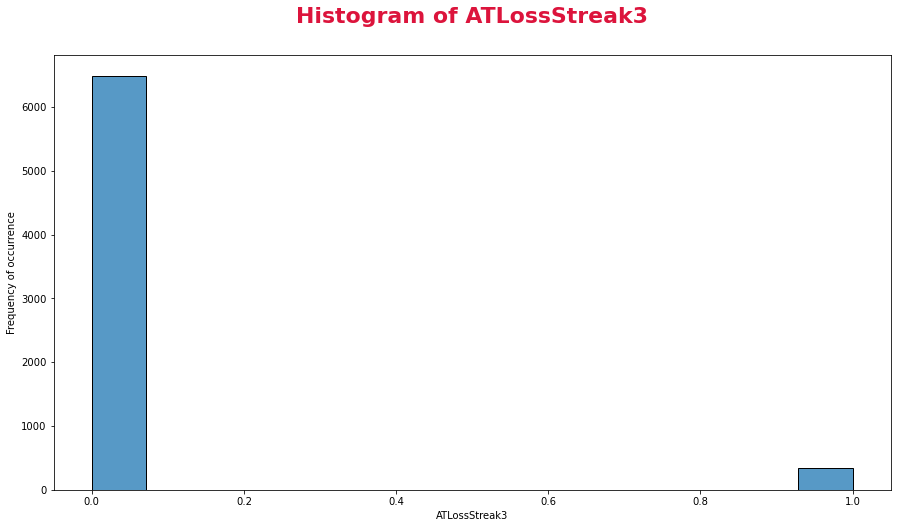

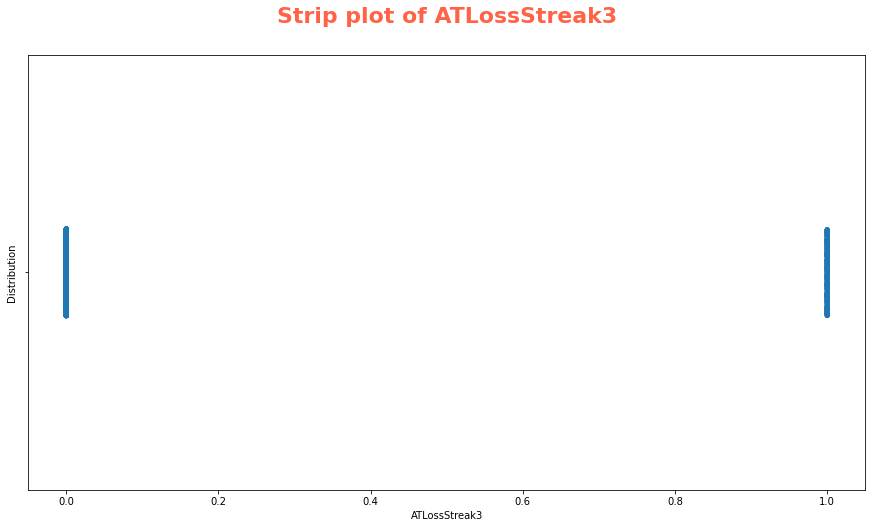

------------------------------

Mean of ATLossStreak5: 0.01023391812865497
Median of ATLossStreak5: 0.0
Minimum value of ATLossStreak5: 0
Maximum value of ATLossStreak5: 1
Skewness of ATLossStreak5: 9.734792629527908
Kurtosis of ATLossStreak5: 92.7933200052712
Mode of ATLossStreak5 0    0
dtype: int64


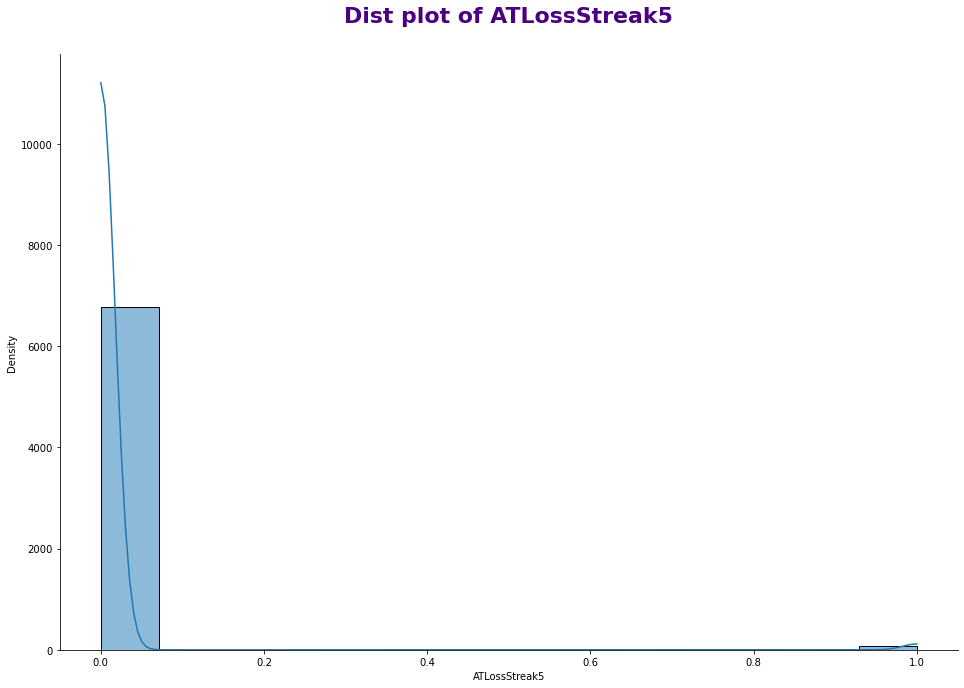

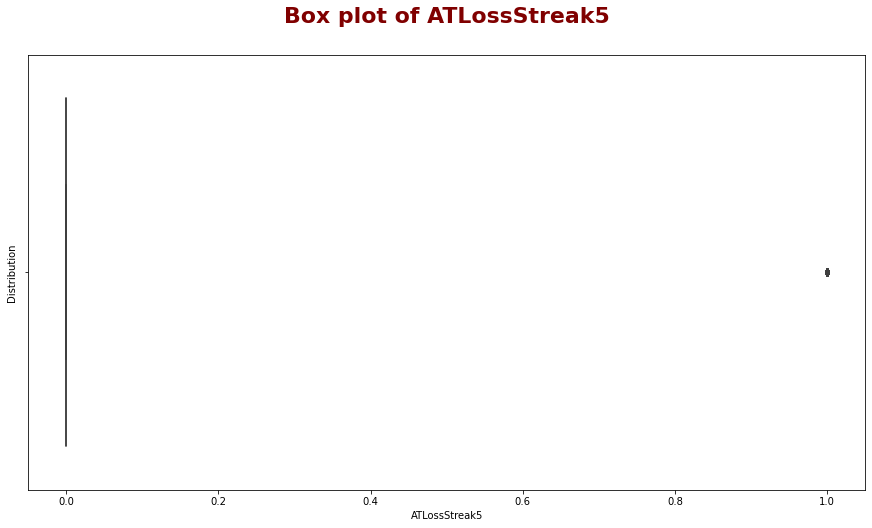

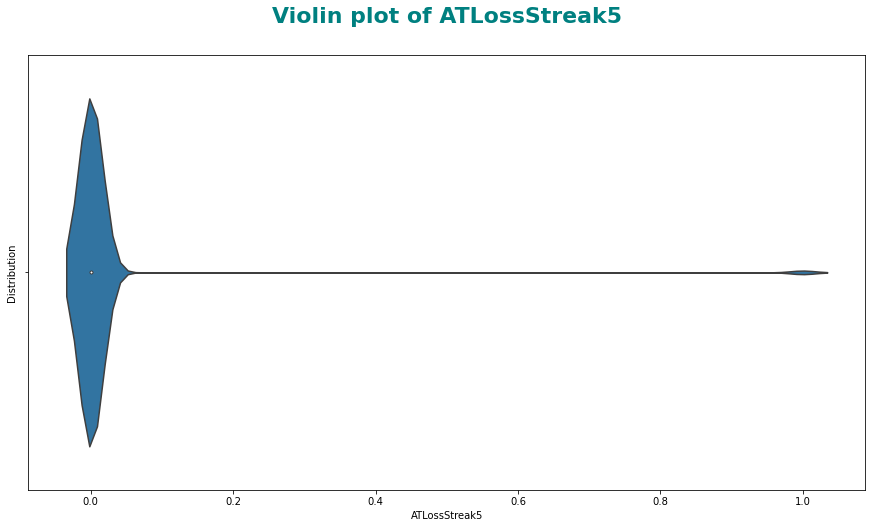

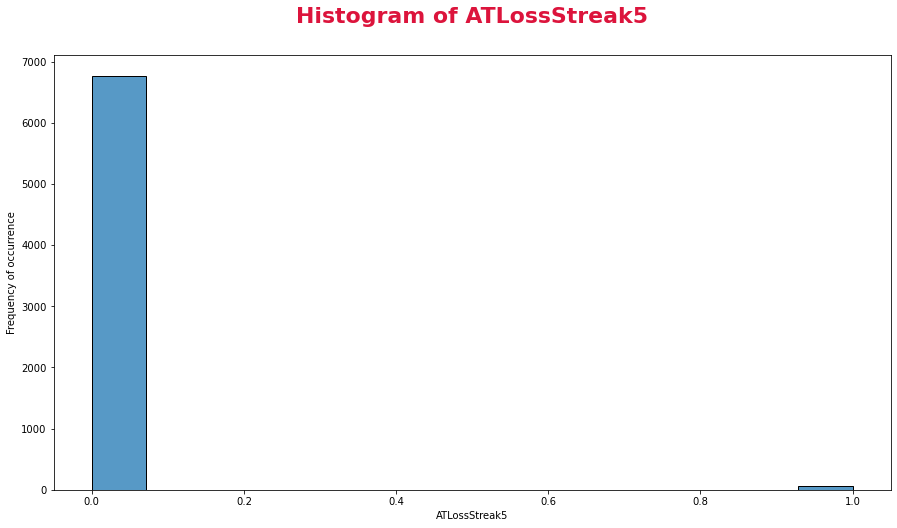

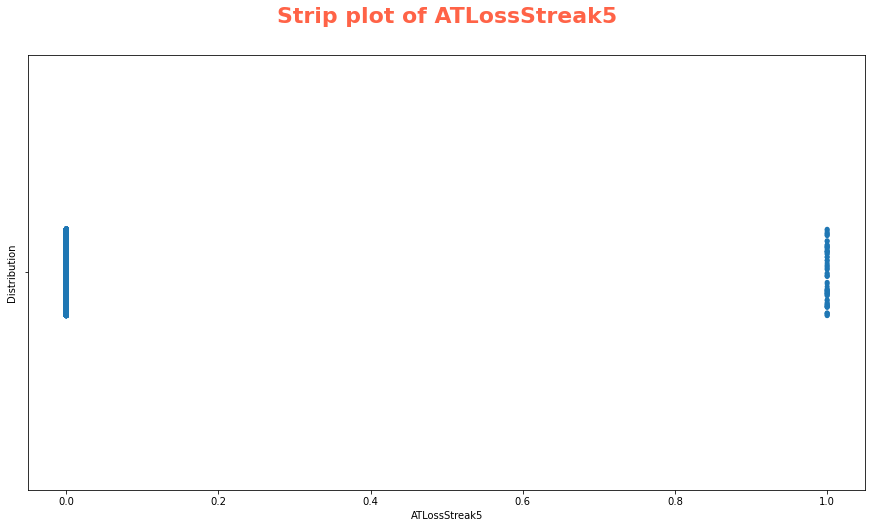

------------------------------

Mean of HTGD: -0.009689931637936695
Median of HTGD: -0.0769230769230769
Minimum value of HTGD: -3.0
Maximum value of HTGD: 4.0
Skewness of HTGD: 0.4817486422813665
Kurtosis of HTGD: 0.6335788187190756
Mode of HTGD 0    0.0
dtype: float64


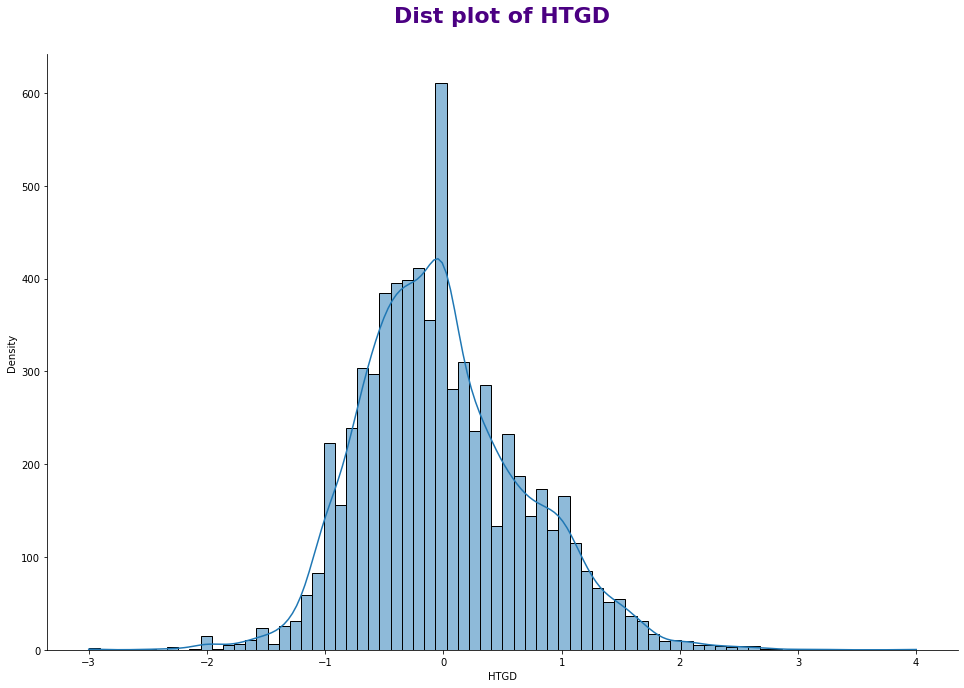

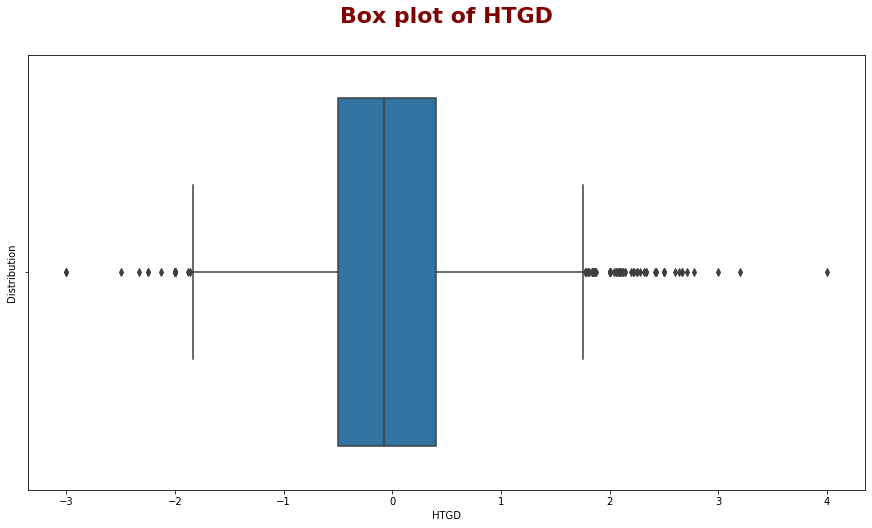

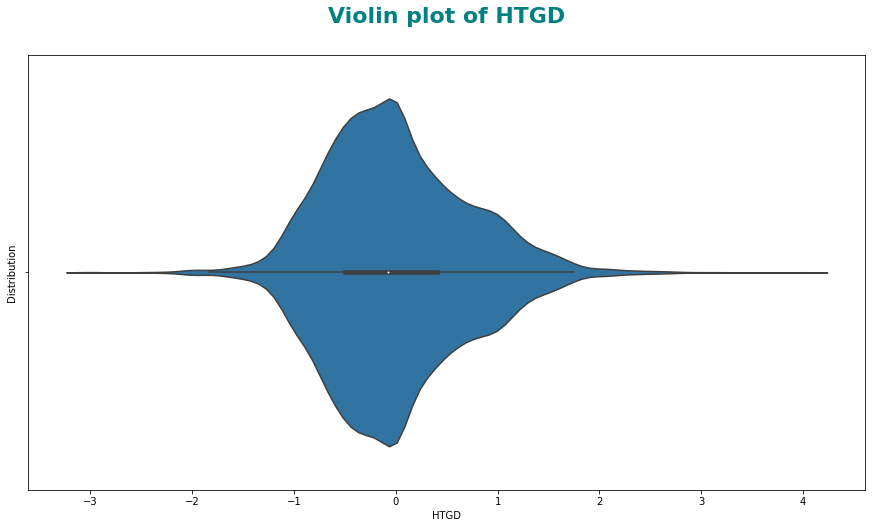

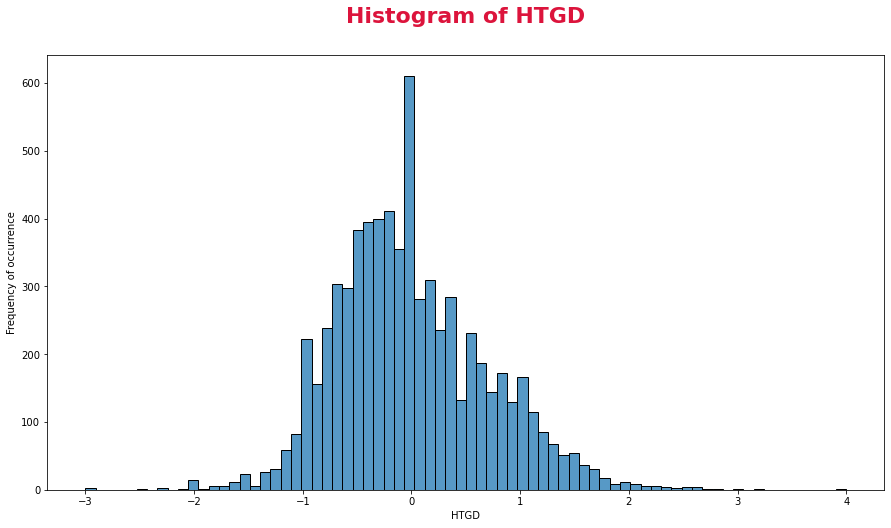

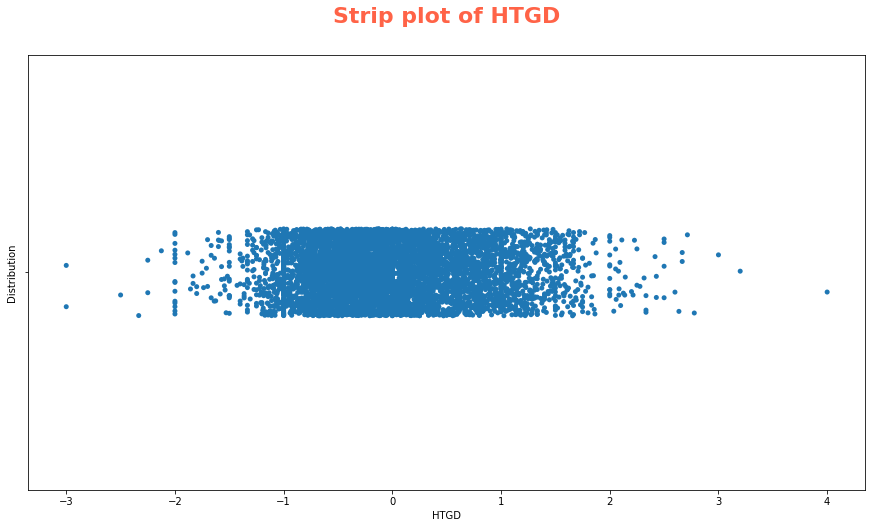

------------------------------

Mean of ATGD: 0.014538977451303406
Median of ATGD: -0.05
Minimum value of ATGD: -3.333333333333333
Maximum value of ATGD: 3.5
Skewness of ATGD: 0.512330919448461
Kurtosis of ATGD: 0.6155144196662685
Mode of ATGD 0    0.0
dtype: float64


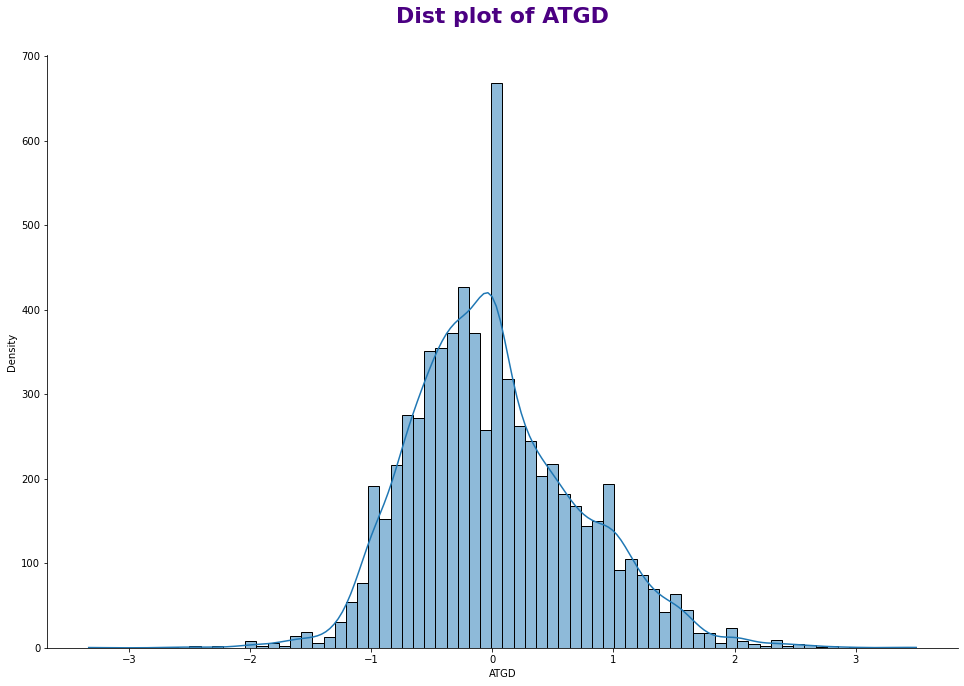

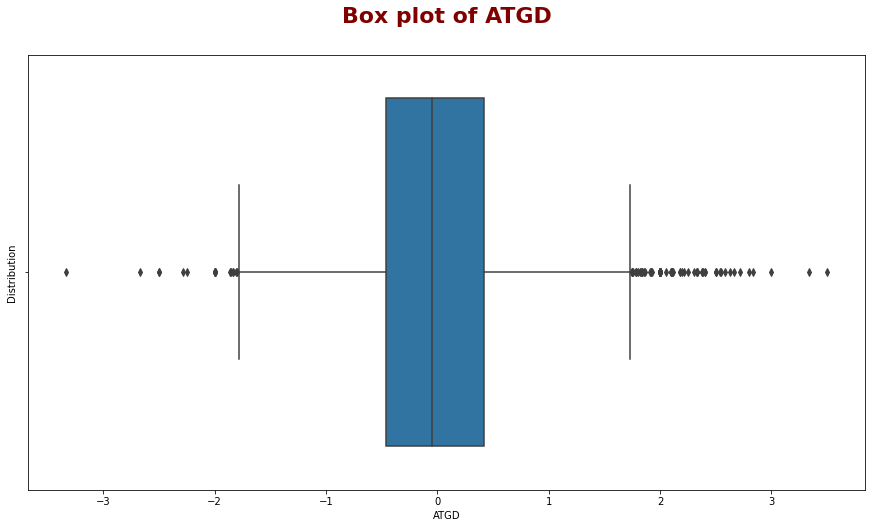

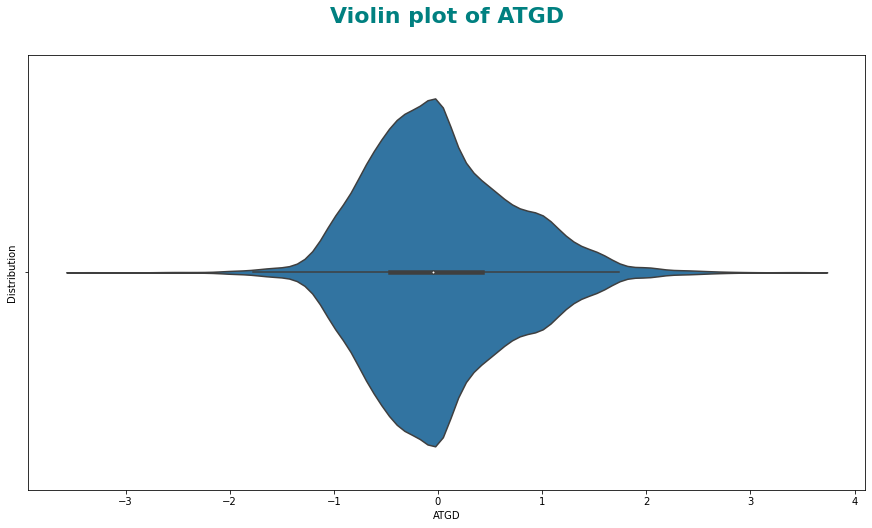

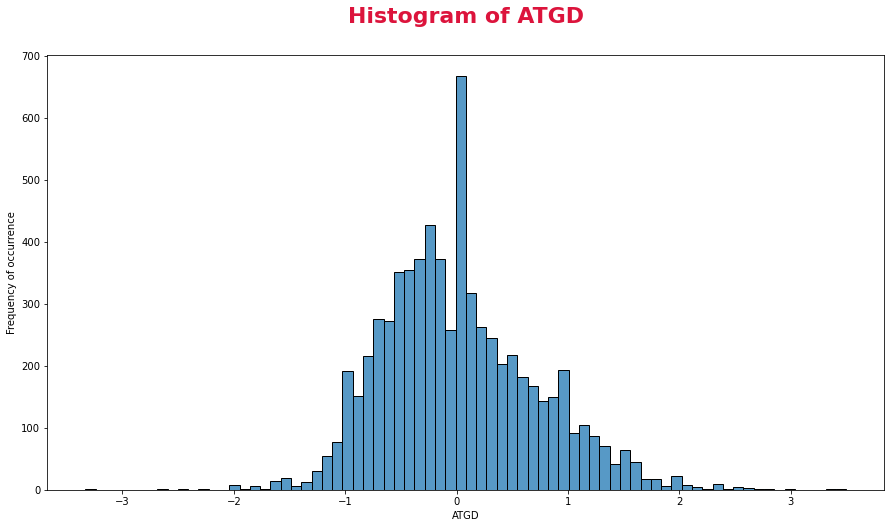

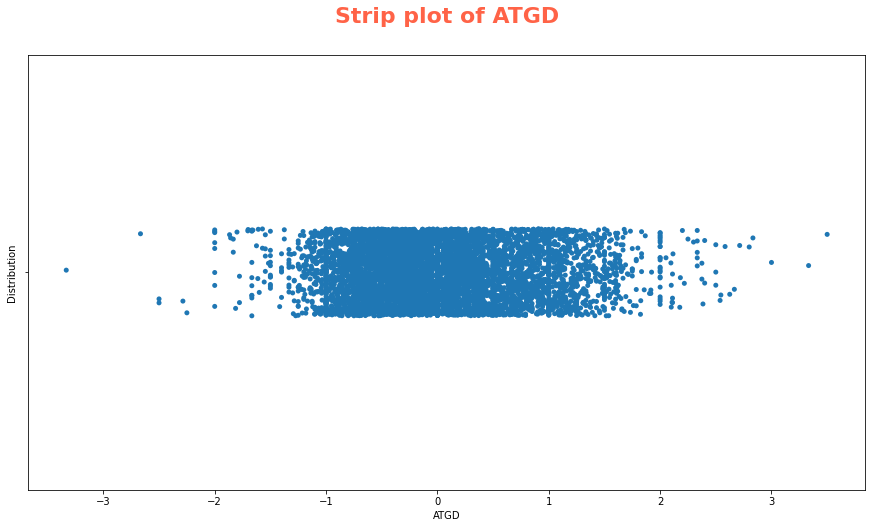

------------------------------

Mean of DiffPts: -0.01775451761648682
Median of DiffPts: 0.0
Minimum value of DiffPts: -2.363636363636364
Maximum value of DiffPts: 2.2857142857142856
Skewness of DiffPts: -0.030861794649778777
Kurtosis of DiffPts: -0.05045062363479014
Mode of DiffPts 0    0.0
dtype: float64


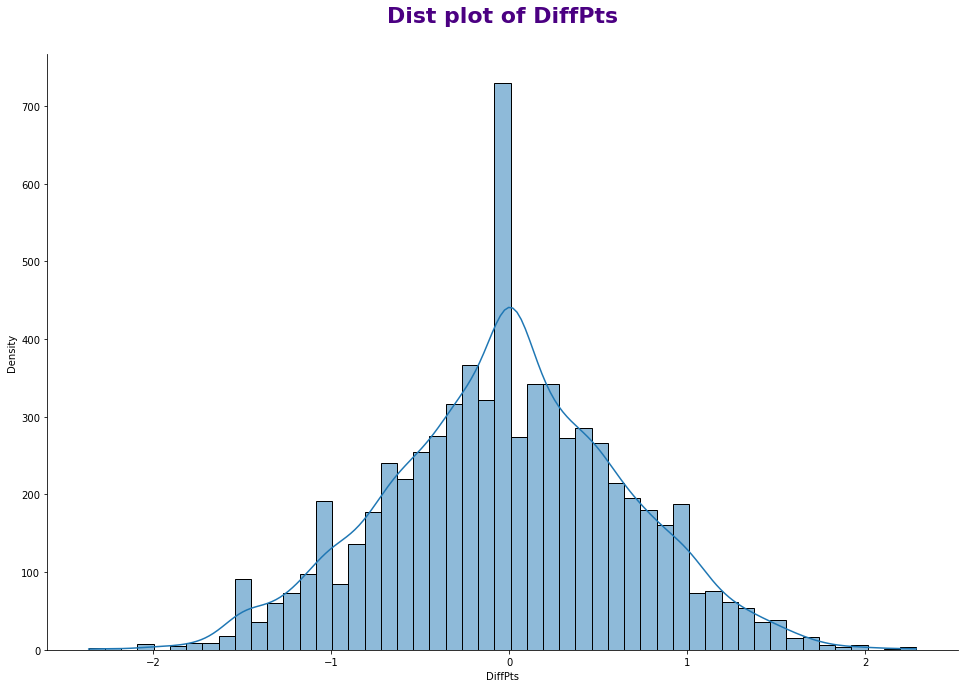

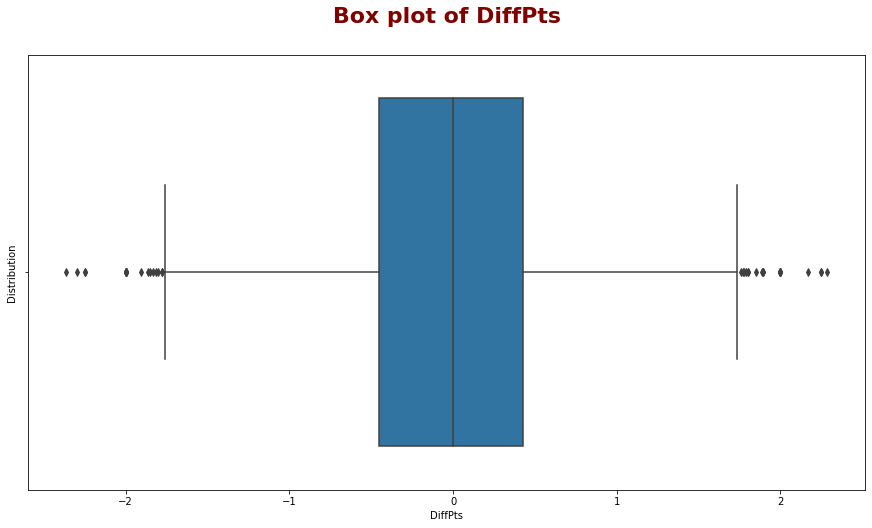

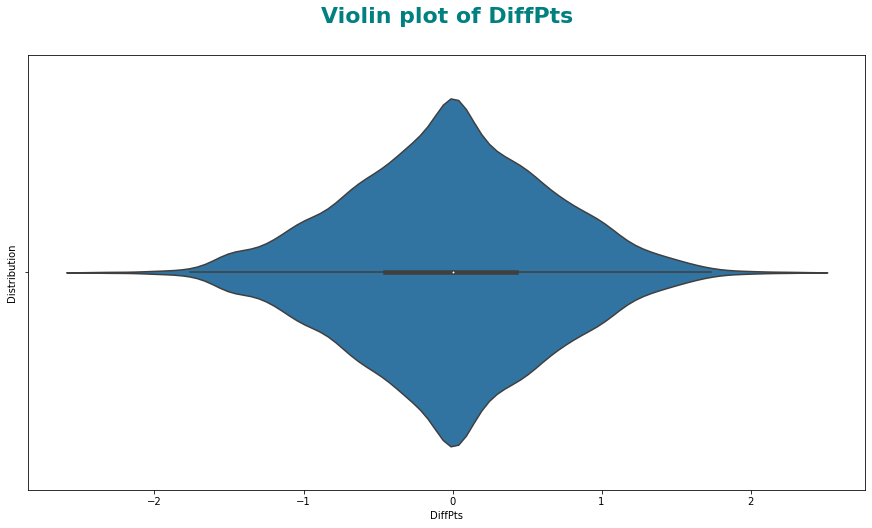

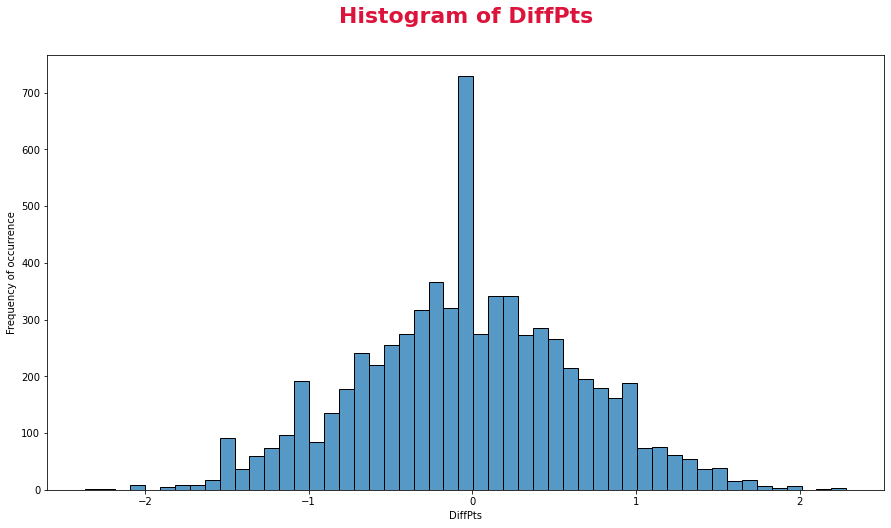

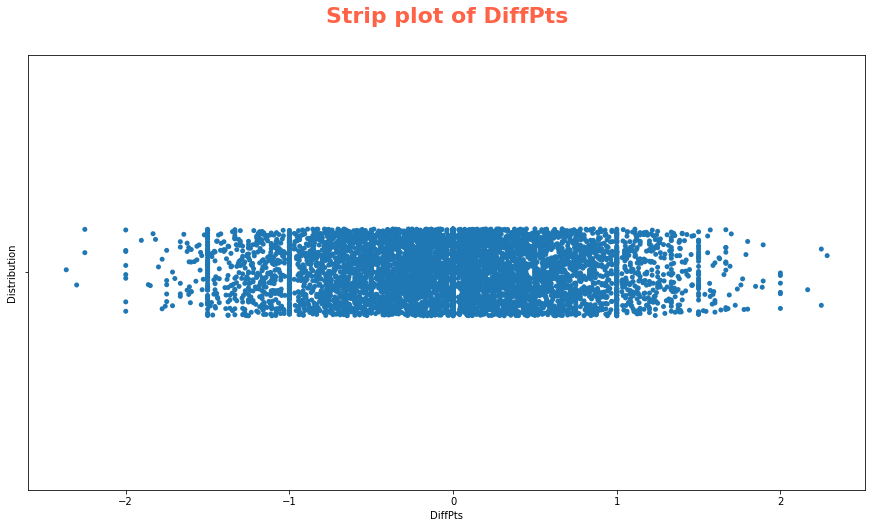

------------------------------

Mean of DiffFormPts: -0.018086116814832905
Median of DiffFormPts: 0.0
Minimum value of DiffFormPts: -2.25
Maximum value of DiffFormPts: 2.25
Skewness of DiffFormPts: -0.16128676310353735
Kurtosis of DiffFormPts: 4.712796893374721
Mode of DiffFormPts 0    0.0
dtype: float64


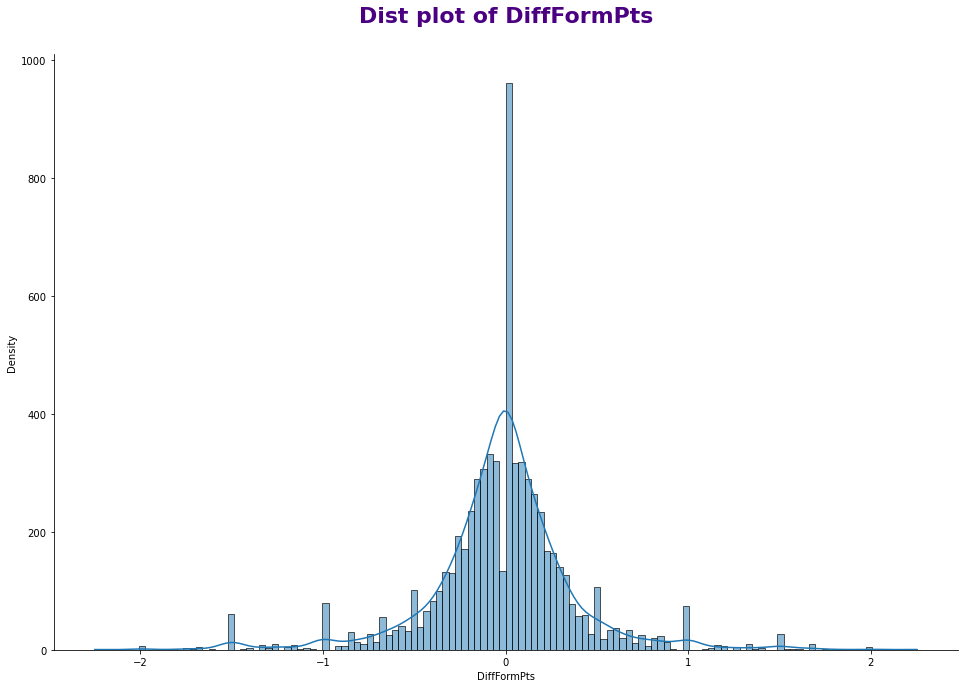

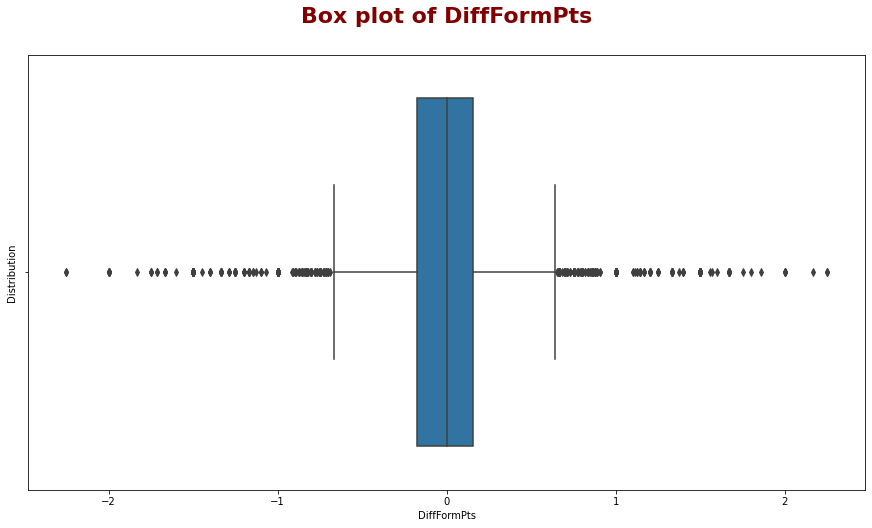

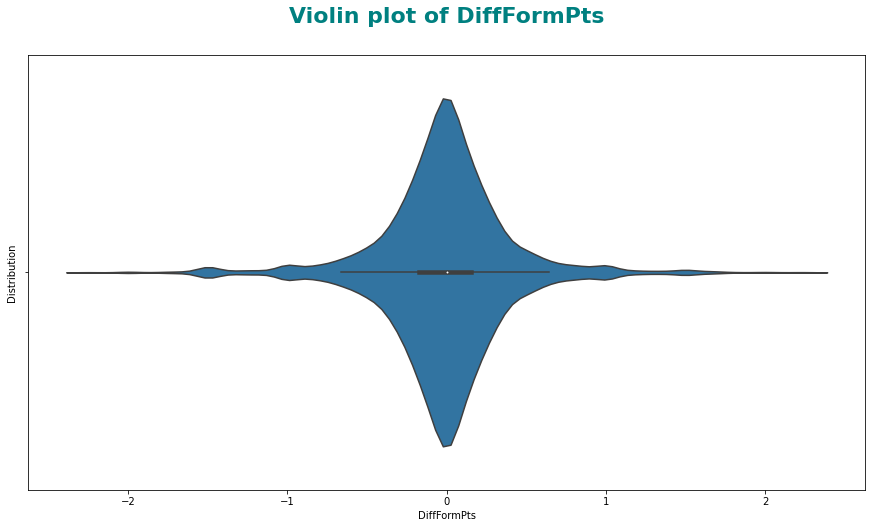

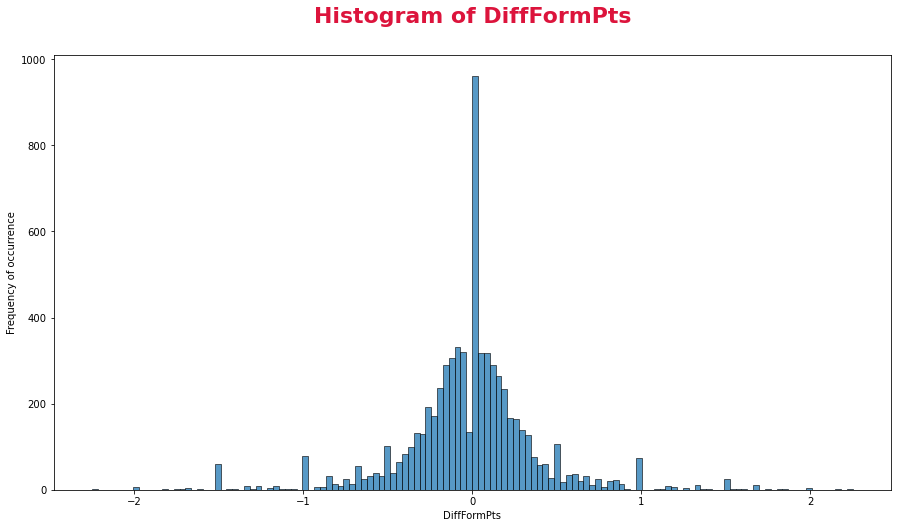

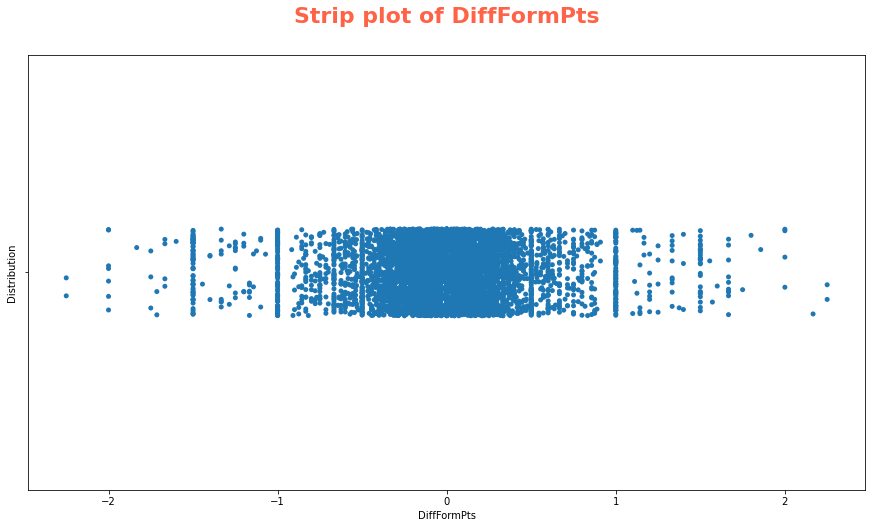

------------------------------



In [12]:
for col in epl_data.columns:
    if type(epl_data[col][0]) != str:
        print('Mean of {}:'.format(col),epl_data[col].mean())
        print('Median of {}:'.format(col),epl_data[col].median())
        print('Minimum value of {}:'.format(col),epl_data[col].min())
        print('Maximum value of {}:'.format(col),epl_data[col].max())
        print('Skewness of {}:'.format(col),epl_data[col].skew())
        print('Kurtosis of {}:'.format(col),epl_data[col].kurtosis())
        print('Mode of {}'.format(col),epl_data[col].mode())
        sns.displot(epl_data[col],kde=True,height=9,aspect=1.5)
        plt.xlabel(col)
        plt.ylabel('Density')
        plt.title('Dist plot of {}'.format(col),pad=32,fontsize=22,fontweight='bold',color='indigo')
        plt.show()
        sns.boxplot(epl_data[col])
        plt.xlabel(col)
        plt.ylabel('Distribution')
        plt.title('Box plot of {}'.format(col),pad=32,fontsize=22,fontweight='bold',color='maroon')
        plt.show()
        sns.violinplot(epl_data[col])
        plt.xlabel(col)
        plt.ylabel('Distribution')
        plt.title('Violin plot of {}'.format(col),pad=32,fontsize=22,fontweight='bold',color='teal')
        plt.show()
        sns.histplot(epl_data[col])
        plt.xlabel(col)
        plt.ylabel('Frequency of occurrence')
        plt.title('Histogram of {}'.format(col),pad=32,fontsize=22,fontweight='bold',color='crimson')
        plt.show()
        sns.stripplot(epl_data[col])
        plt.xlabel(col)
        plt.ylabel('Distribution')
        plt.title('Strip plot of {}'.format(col),pad=32,fontsize=22,fontweight='bold',color='tomato')
        plt.show()
        print('------------------------------')
        print()

## Checking for outliers

In [13]:
for col in epl_data.columns:
    if type(epl_data[col][0]) != str:
        lower_quantile = epl_data[col].quantile(0.25)
        upper_quantile = epl_data[col].quantile(0.75)
        iqr = upper_quantile - lower_quantile
        lower_whisker = epl_data[col].median() - 1.5 * iqr;
        upper_whisker = epl_data[col].median() + 1.5 * iqr;
        print('Inter-quartile range of {}:'.format(col),iqr)
        print('Lower whisker:',lower_whisker)
        print('Upper whisker:',upper_whisker)
        outliers = epl_data[(epl_data[col]<lower_whisker)|(epl_data[col]>upper_whisker)]
        print('Outliers of {}:'.format(col))
        print(outliers[col])
        print('-----------------------')
        print()

Inter-quartile range of FTHG: 1.0
Lower whisker: -0.5
Upper whisker: 2.5
Outliers of FTHG:
0       4
1       4
8       3
14      3
15      4
       ..
6827    3
6833    4
6835    3
6838    5
6839    3
Name: FTHG, Length: 1361, dtype: int64
-----------------------

Inter-quartile range of FTAG: 2.0
Lower whisker: -2.0
Upper whisker: 4.0
Outliers of FTAG:
383     5
445     5
634     6
677     5
1001    5
1034    5
1072    6
1086    6
1116    6
1195    5
1363    5
1646    5
1709    5
2044    5
2777    5
2922    5
2992    6
3019    6
3063    5
3115    5
3233    5
3260    5
3424    6
3434    5
3441    5
3726    5
3739    6
3816    6
4158    5
4207    5
4210    5
4245    5
4267    6
4269    5
4343    5
4429    5
4463    5
4509    6
4563    5
4613    5
4728    5
4899    6
4937    5
5099    5
5148    5
5169    5
5231    6
5341    6
5535    5
5760    5
5796    5
5923    5
5958    6
6216    5
6449    6
6453    7
6459    5
6506    6
6548    5
6601    5
Name: FTAG, dtype: int64
-------------------

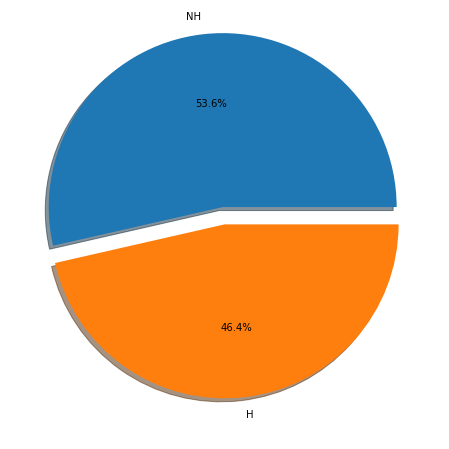

In [14]:
values = epl_data['FTR'].value_counts().values
labels = epl_data['FTR'].value_counts().keys()
explode = (0.1,0)
plt.pie(values,labels=labels,explode=explode,shadow=True,autopct='%1.1f%%')
plt.show()

### Away teams have been more successful as compared to home teams in the English Premier League.

# Bivariate Analysis

In [15]:
fthg_per_team = epl_data.groupby('HomeTeam')['FTHG'].max().sort_values(ascending=False).reset_index()[:10]
fthg_per_team

,HomeTeam,FTHG
0,Tottenham,9
1,Chelsea,8
2,Middlesbrough,8
3,Man United,8
4,Southampton,8
5,Everton,7
6,Portsmouth,7
7,Arsenal,7
8,Blackburn,7
9,Man City,7


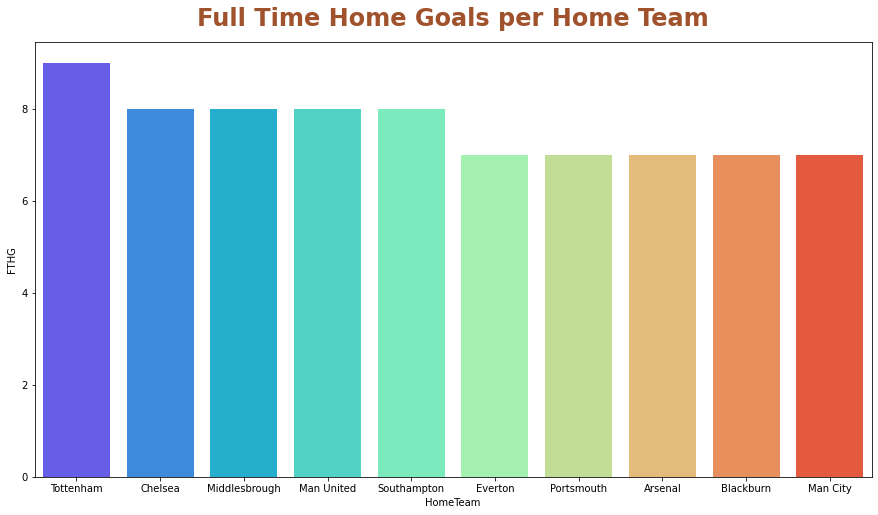

In [16]:
sns.barplot(x='HomeTeam',y='FTHG',data=fthg_per_team,palette='rainbow')
plt.title('Full Time Home Goals per Home Team',fontsize=24,color='sienna',fontweight='bold',pad=16)
plt.show()

### Tottenham Hotspur have scored the most number of goals at home.

In [17]:
ftag_per_team = epl_data.groupby('HomeTeam')['FTAG'].max().sort_values(ascending=False).reset_index()[:10]
ftag_per_team

,HomeTeam,FTAG
0,Hull,7
1,Leicester,6
2,Everton,6
3,Wigan,6
4,Aston Villa,6
5,West Brom,6
6,Watford,6
7,Ipswich,6
8,Burnley,6
9,Cardiff,6


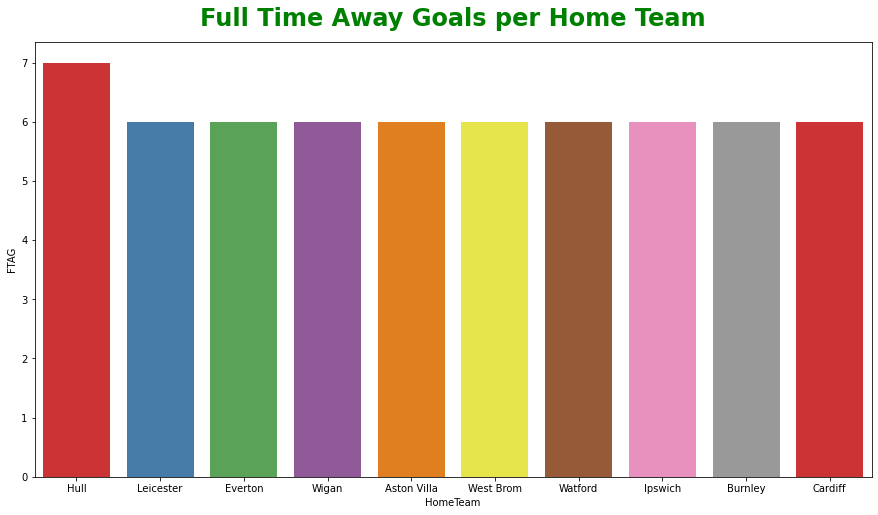

In [18]:
sns.barplot(x='HomeTeam',y='FTAG',data=ftag_per_team,palette='Set1')
plt.title('Full Time Away Goals per Home Team',fontsize=24,color='green',fontweight='bold',pad=16)
plt.show()

### Hull City have scored the most number of goals away from home.

In [19]:
results_hometeam = epl_data.groupby('HomeTeam')['HTGS'].max().sort_values(ascending=False).reset_index()[:10]
results_hometeam

,HomeTeam,HTGS
0,Man City,102
1,Liverpool,99
2,Chelsea,95
3,Man United,87
4,Arsenal,79
5,Tottenham,73
6,Newcastle,70
7,Aston Villa,69
8,Leicester,63
9,Leeds,61


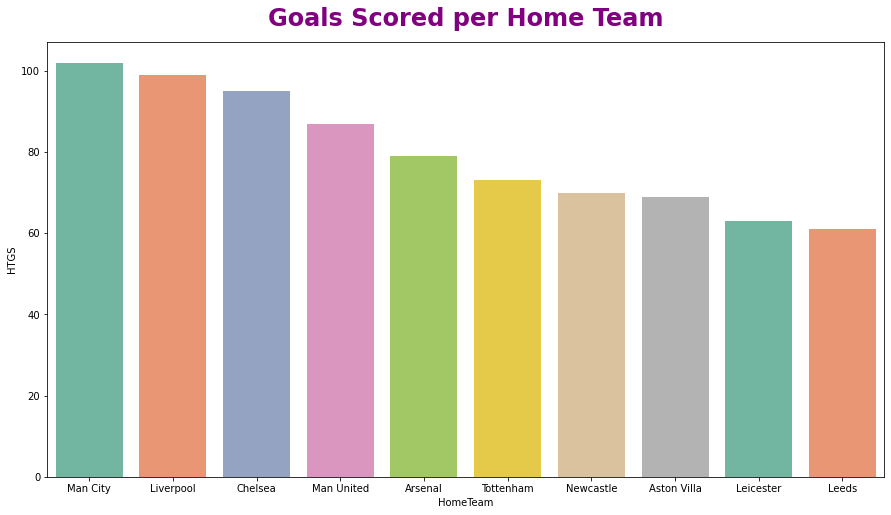

In [20]:
sns.barplot(x='HomeTeam',y='HTGS',data=results_hometeam,palette='Set2')
plt.title('Goals Scored per Home Team',fontsize=24,color='purple',fontweight='bold',pad=16)
plt.show()

### At home, Man City have scored the maximum number of goals which indicates that they are the most clinical side in EPL especially at their home.

In [21]:
results_hometeam = epl_data.groupby('HomeTeam')['ATGS'].max().sort_values(ascending=False).reset_index()[:10]
results_hometeam

,HomeTeam,ATGS
0,Southampton,105
1,West Ham,102
2,Everton,96
3,Crystal Palace,96
4,Tottenham,93
5,Norwich,93
6,Liverpool,93
7,Sunderland,88
8,Newcastle,88
9,Ipswich,87


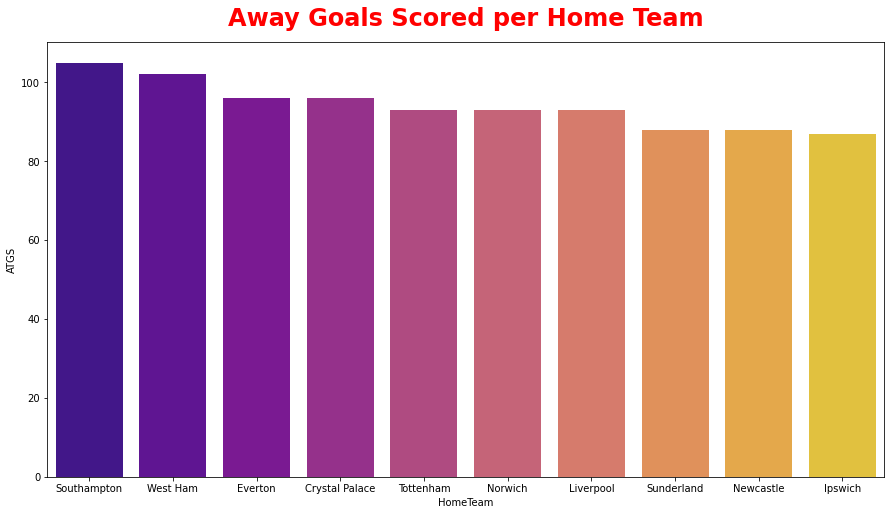

In [22]:
sns.barplot(x='HomeTeam',y='ATGS',data=results_hometeam,palette='plasma')
plt.title('Away Goals Scored per Home Team',fontsize=24,color='red',fontweight='bold',pad=16)
plt.show()

### Southampton have scored the highest number of goals away from home closely followed by West Ham United.

In [23]:
results_hometeam = epl_data.groupby('HomeTeam')['HTGC'].max().sort_values(ascending=False).reset_index()[:10]
results_hometeam

,HomeTeam,HTGC
0,Derby,85
1,Fulham,83
2,Burnley,80
3,Wolves,79
4,Leeds,75
5,Blackburn,75
6,Hull,75
7,Bolton,73
8,Cardiff,72
9,Norwich,71


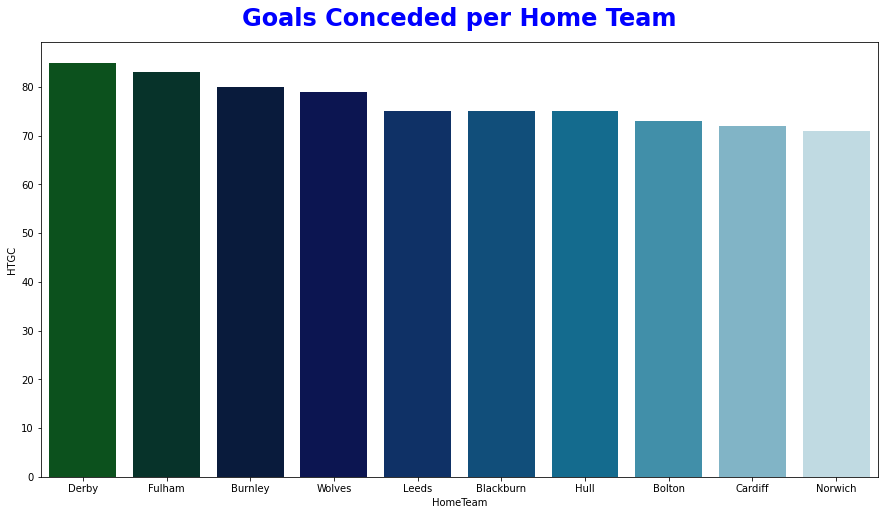

In [24]:
sns.barplot(x='HomeTeam',y='HTGC',data=results_hometeam,palette='ocean')
plt.title('Goals Conceded per Home Team',fontsize=24,color='blue',fontweight='bold',pad=16)
plt.show()

### Derby County F.C. have conceded the most number of goals at home closely followed by Fulham.

In [25]:
results_hometeam = epl_data.groupby('HomeTeam')['ATGC'].max().sort_values(ascending=False).reset_index()[:10]
results_hometeam

,HomeTeam,ATGC
0,Blackburn,82
1,Stoke,79
2,Wigan,79
3,Chelsea,78
4,Swansea,75
5,Birmingham,74
6,Man United,74
7,West Ham,74
8,Newcastle,74
9,Tottenham,74


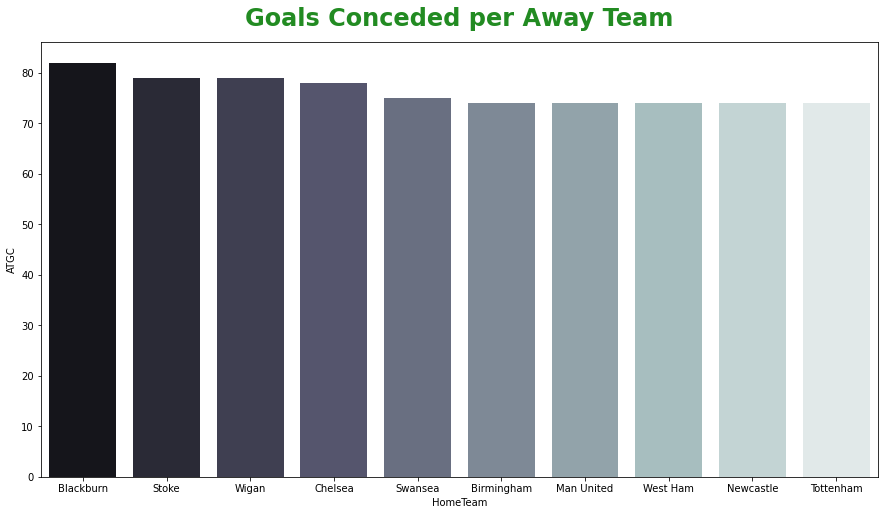

In [26]:
sns.barplot(x='HomeTeam',y='ATGC',data=results_hometeam,palette='bone')
plt.title('Goals Conceded per Away Team',fontsize=24,color='forestgreen',fontweight='bold',pad=16)
plt.show()

### Blackburn Rovers have conceded the most number of goals away from home.

In [27]:
results_hometeam = epl_data.groupby('HomeTeam')['HTP'].max().sort_values(ascending=False).reset_index()[:10]
results_hometeam

,HomeTeam,HTP
0,Man City,2.736842
1,Chelsea,2.700000
2,Arsenal,2.500000
3,Man United,2.448276
4,Charlton,2.400000
5,Tottenham,2.400000
6,Liverpool,2.300000
7,Bolton,2.250000
8,Portsmouth,2.166667
9,Leicester,2.117647


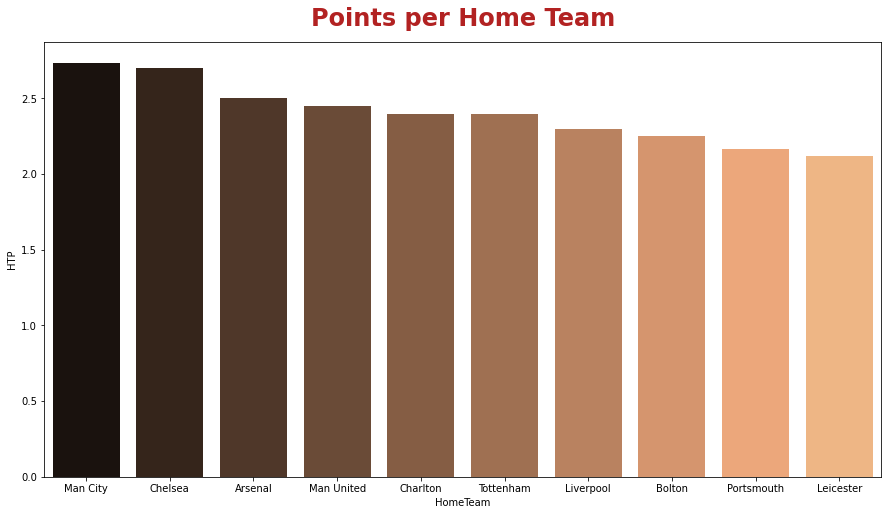

In [28]:
sns.barplot(x='HomeTeam',y='HTP',data=results_hometeam,palette='copper')
plt.title('Points per Home Team',fontsize=24,color='firebrick',fontweight='bold',pad=16)
plt.show()

### Manchester City have an exceptional record at home with maximum number of points, closely followed by Chelsea.

In [29]:
results_hometeam = epl_data.groupby('HomeTeam')['ATP'].max().sort_values(ascending=False).reset_index()[:10]
results_hometeam

,HomeTeam,ATP
0,Crystal Palace,2.761905
1,Newcastle,2.750000
2,Swansea,2.705882
3,Everton,2.700000
4,Liverpool,2.695652
5,Man United,2.687500
6,Aston Villa,2.652174
7,Sunderland,2.636364
8,West Ham,2.619048
9,Burnley,2.615385


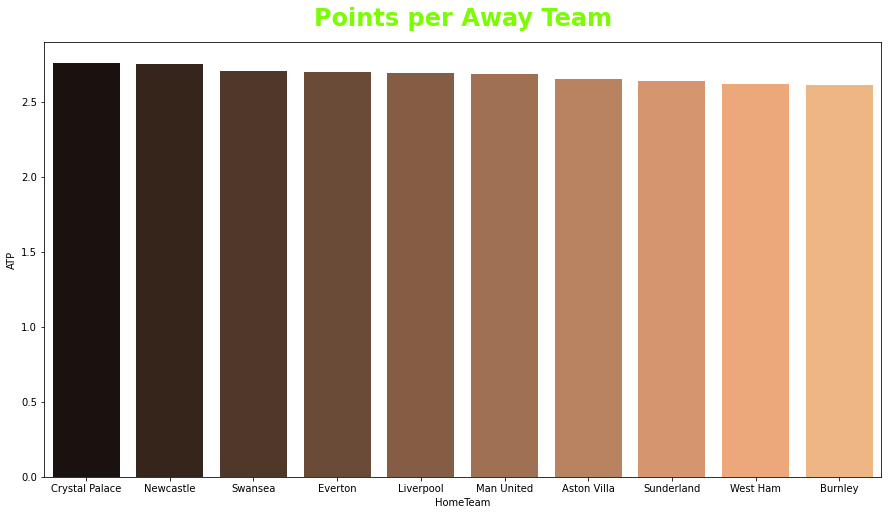

In [30]:
sns.barplot(x='HomeTeam',y='ATP',data=results_hometeam,palette='copper')
plt.title('Points per Away Team',fontsize=24,color='lawngreen',fontweight='bold',pad=16)
plt.show()

### Crystal Palace have a great record away from home closely followed by Newcastle United.

In [31]:
results_hometeam = epl_data.groupby('HomeTeam')['MW'].max().sort_values(ascending=False).reset_index()[:10]
results_hometeam

,HomeTeam,MW
0,Arsenal,38.0
1,Leeds,38.0
2,Liverpool,38.0
3,Man City,38.0
4,Man United,38.0
5,Middlesbrough,38.0
6,Newcastle,38.0
7,Norwich,38.0
8,Portsmouth,38.0
9,Sheffield United,38.0


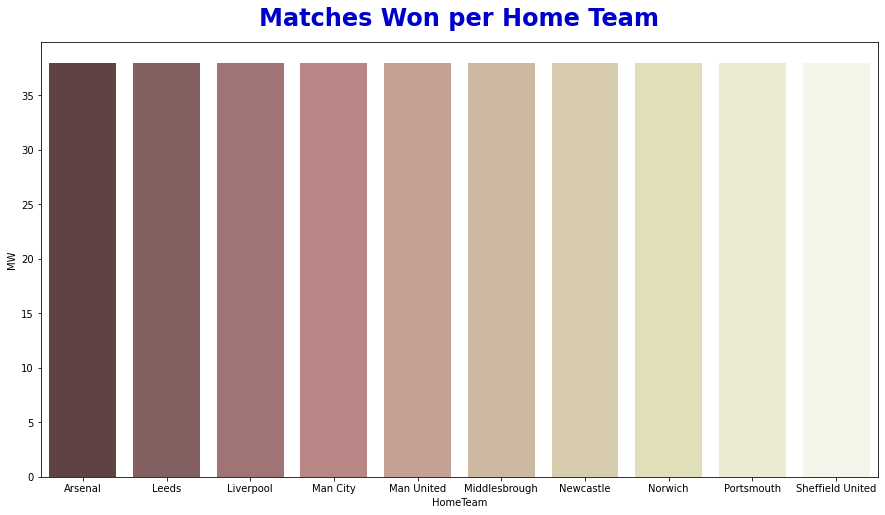

In [32]:
sns.barplot(x='HomeTeam',y='MW',data=results_hometeam,palette='pink')
plt.title('Matches Won per Home Team',fontsize=24,color='mediumblue',fontweight='bold',pad=16)
plt.show()

### Most of the teams have a decent record at home as far as total number of points is concerned.

In [33]:
results_hometeam = epl_data.groupby('HomeTeam')['HTFormPts'].max().sort_values(ascending=False).reset_index()[:30]
results_hometeam

,HomeTeam,HTFormPts
0,Arsenal,15
1,Chelsea,15
2,Wigan,15
3,Tottenham,15
4,Southampton,15
5,Newcastle,15
6,Man United,15
7,Man City,15
8,Liverpool,15
9,Leeds,15


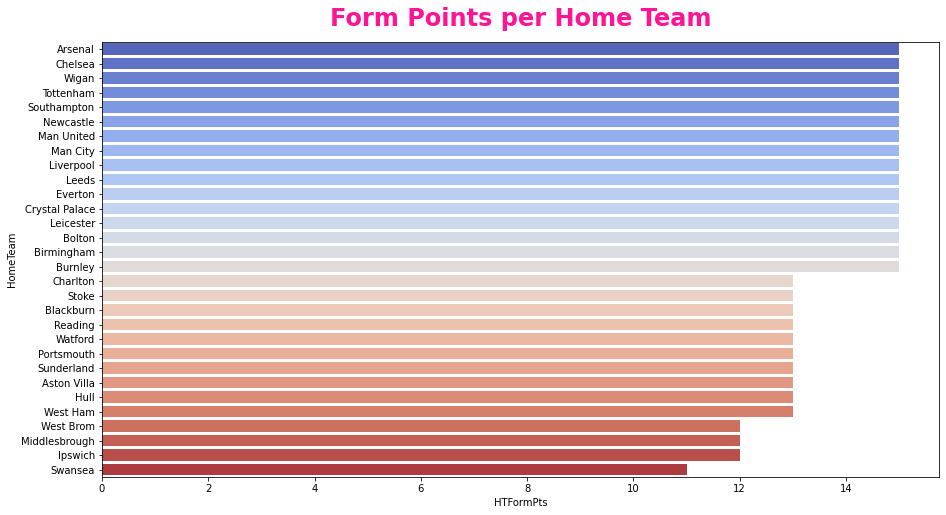

In [34]:
sns.barplot(x='HTFormPts',y='HomeTeam',data=results_hometeam,palette='coolwarm',orient='horizontal')
plt.title('Form Points per Home Team',fontsize=24,color='deeppink',fontweight='bold',pad=16)
plt.show()

In [35]:
results_hometeam = epl_data.groupby('HomeTeam')['ATFormPts'].max().sort_values(ascending=False).reset_index()[:30]
results_hometeam

,HomeTeam,ATFormPts
0,Arsenal,15
1,Aston Villa,15
2,Man City,15
3,Man United,15
4,Middlesboro,15
5,Middlesbrough,15
6,Newcastle,15
7,Norwich,15
8,Portsmouth,15
9,QPR,15


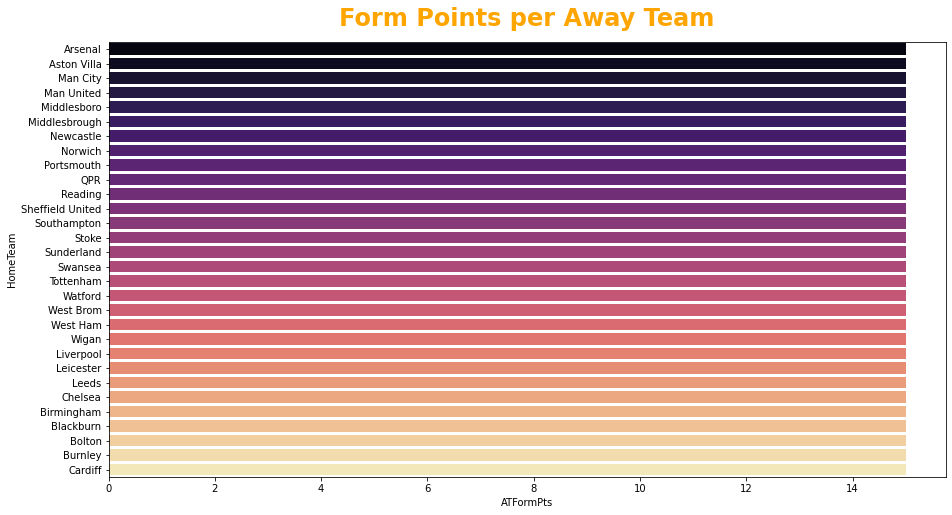

In [36]:
sns.barplot(x='ATFormPts',y='HomeTeam',data=results_hometeam,palette='magma',orient='horizontal')
plt.title('Form Points per Away Team',fontsize=24,color='orange',fontweight='bold',pad=16)
plt.show()

### Most of the teams have been in decent form in all EPL seasons of the last two decades and have managed to retain their form and performance levels at home.

In [37]:
results_hometeam = epl_data.groupby('HomeTeam')['HTWinStreak3'].count().sort_values(ascending=False).reset_index()[:10]
results_hometeam

,HomeTeam,HTWinStreak3
0,Arsenal,342
1,Tottenham,342
2,Man United,342
3,Everton,342
4,Chelsea,342
5,Liverpool,342
6,Man City,323
7,Aston Villa,304
8,Newcastle,304
9,West Ham,285


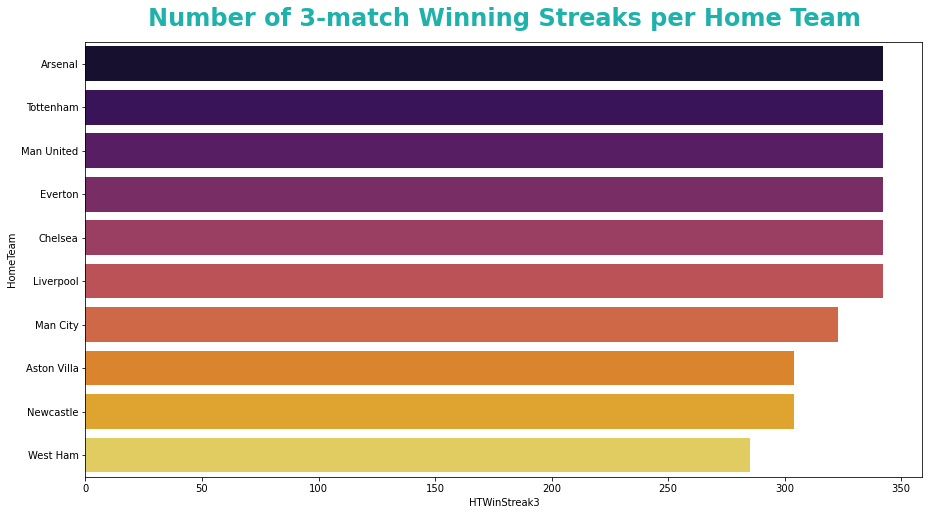

In [38]:
sns.barplot(x='HTWinStreak3',y='HomeTeam',data=results_hometeam,palette='inferno',orient='horizontal')
plt.title('Number of 3-match Winning Streaks per Home Team',fontsize=24,color='lightseagreen',fontweight='bold',pad=16)
plt.show()

In [39]:
results_hometeam = epl_data.groupby('HomeTeam')['HTWinStreak5'].count().sort_values(ascending=False).reset_index()[:10]
results_hometeam

,HomeTeam,HTWinStreak5
0,Arsenal,342
1,Tottenham,342
2,Man United,342
3,Everton,342
4,Chelsea,342
5,Liverpool,342
6,Man City,323
7,Aston Villa,304
8,Newcastle,304
9,West Ham,285


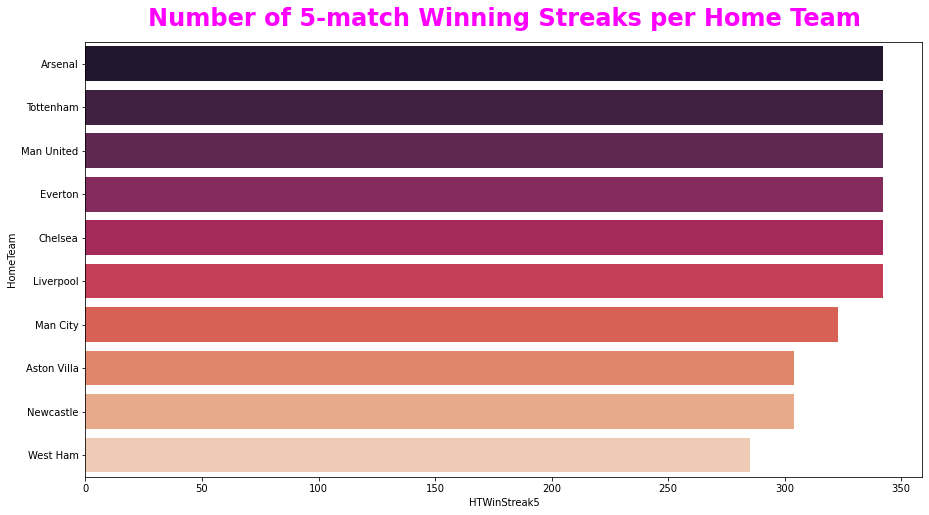

In [40]:
sns.barplot(x='HTWinStreak5',y='HomeTeam',data=results_hometeam,palette='rocket',orient='horizontal')
plt.title('Number of 5-match Winning Streaks per Home Team',fontsize=24,color='fuchsia',fontweight='bold',pad=16)
plt.show()

In [41]:
results_hometeam = epl_data.groupby('HomeTeam')['HTLossStreak3'].count().sort_values(ascending=False).reset_index()[:10]
results_hometeam

,HomeTeam,HTLossStreak3
0,Arsenal,342
1,Tottenham,342
2,Man United,342
3,Everton,342
4,Chelsea,342
5,Liverpool,342
6,Man City,323
7,Aston Villa,304
8,Newcastle,304
9,West Ham,285


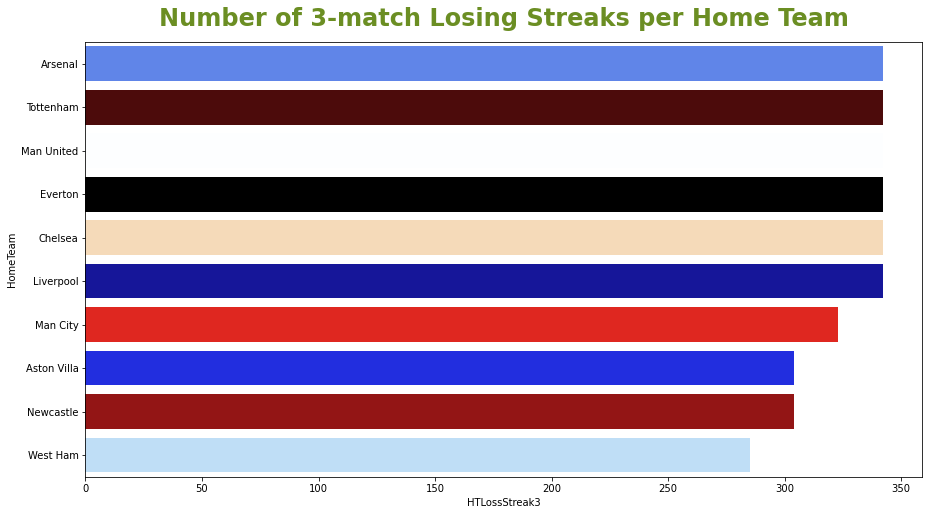

In [42]:
sns.barplot(x='HTLossStreak3',y='HomeTeam',data=results_hometeam,palette='flag',orient='horizontal')
plt.title('Number of 3-match Losing Streaks per Home Team',fontsize=24,color='olivedrab',fontweight='bold',pad=16)
plt.show()

In [43]:
results_hometeam = epl_data.groupby('HomeTeam')['HTLossStreak5'].count().sort_values(ascending=False).reset_index()[:10]
results_hometeam

,HomeTeam,HTLossStreak5
0,Arsenal,342
1,Tottenham,342
2,Man United,342
3,Everton,342
4,Chelsea,342
5,Liverpool,342
6,Man City,323
7,Aston Villa,304
8,Newcastle,304
9,West Ham,285


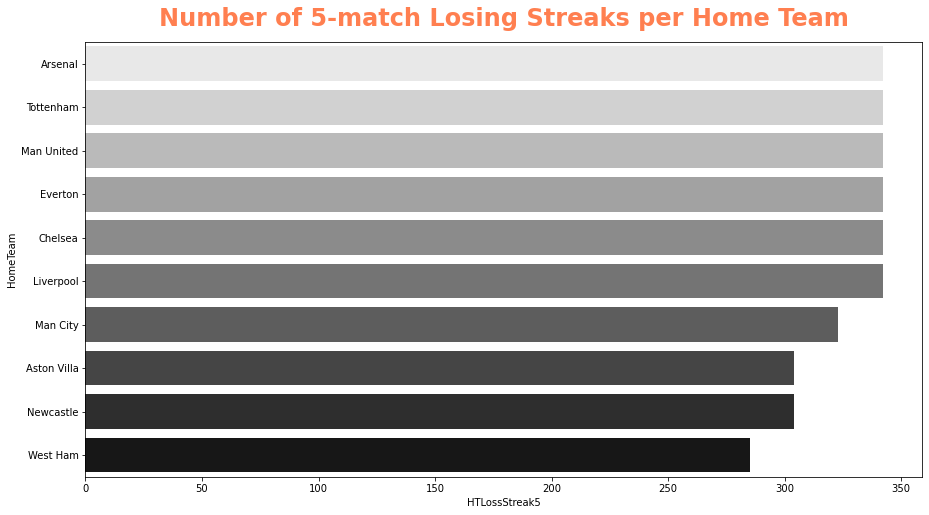

In [44]:
sns.barplot(x='HTLossStreak5',y='HomeTeam',data=results_hometeam,palette='binary',orient='horizontal')
plt.title('Number of 5-match Losing Streaks per Home Team',fontsize=24,color='coral',fontweight='bold',pad=16)
plt.show()

### Arsenal, Tottenham Hotspur, Manchester United, Everton, Chelsea and Liverpool have the most number of 3 and 5-match winning and losing streaks at home in EPL.

In [45]:
results_hometeam = epl_data.groupby('HomeTeam')['HTGD'].max().sort_values(ascending=False).reset_index()[:10]
results_hometeam

,HomeTeam,HTGD
0,Chelsea,4.000000
1,Man United,3.000000
2,Man City,2.777778
3,Swansea,2.666667
4,Arsenal,2.500000
5,Bolton,2.500000
6,Portsmouth,1.750000
7,Tottenham,1.666667
8,Leeds,1.666667
9,Southampton,1.555556


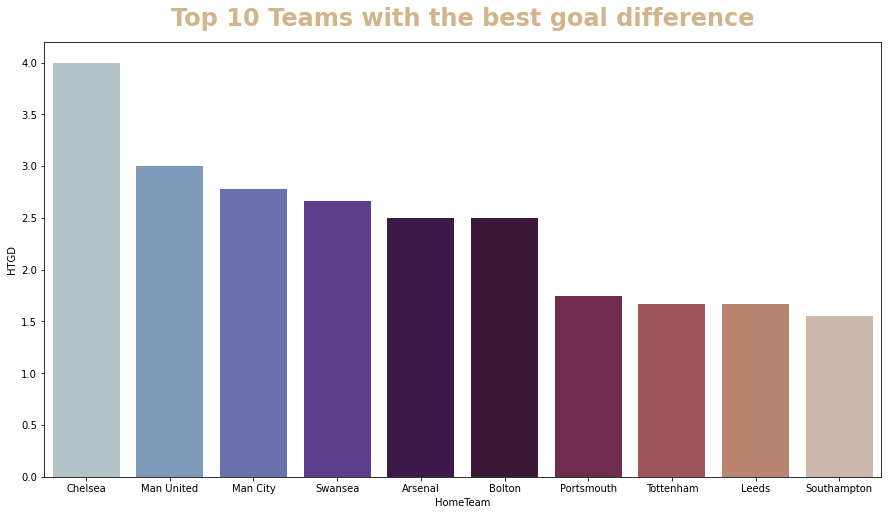

In [46]:
sns.barplot(x='HomeTeam',y='HTGD',data=results_hometeam,palette='twilight')
plt.title('Top 10 Teams with the best goal difference',fontsize=24,color='tan',fontweight='bold',pad=16)
plt.show()

### Chelsea have a superlative goal difference at home in comparison to all other teams in EPL.

In [47]:
results_hometeam = epl_data.groupby('HomeTeam')['HTGD'].min().sort_values().reset_index()[:10]
results_hometeam

,HomeTeam,HTGD
0,West Brom,-3.000000
1,Leicester,-3.000000
2,Norwich,-2.500000
3,Tottenham,-2.333333
4,Wolves,-2.250000
5,Wigan,-2.250000
6,Crystal Palace,-2.125000
7,Swansea,-2.000000
8,Portsmouth,-2.000000
9,West Ham,-2.000000


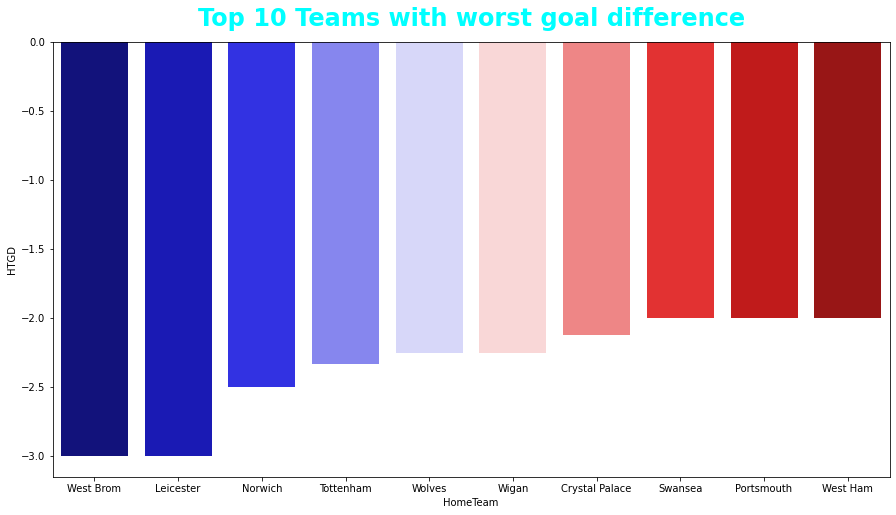

In [48]:
sns.barplot(x='HomeTeam',y='HTGD',data=results_hometeam,palette='seismic')
plt.title('Top 10 Teams with worst goal difference',fontsize=24,color='cyan',fontweight='bold',pad=16)
plt.show()

### West Bromwich Albion and Leicester City have the worst goal difference at home among all teams in EPL.

In [49]:
results_hometeam = epl_data.groupby('HomeTeam')['ATGD'].max().sort_values(ascending=False).reset_index()[:10]
results_hometeam

,HomeTeam,ATGD
0,West Ham,3.500000
1,Man City,3.333333
2,Wigan,3.000000
3,Stoke,2.833333
4,West Brom,2.800000
5,Chelsea,2.714286
6,Man United,2.666667
7,Aston Villa,2.625000
8,Leicester,2.583333
9,QPR,2.545455


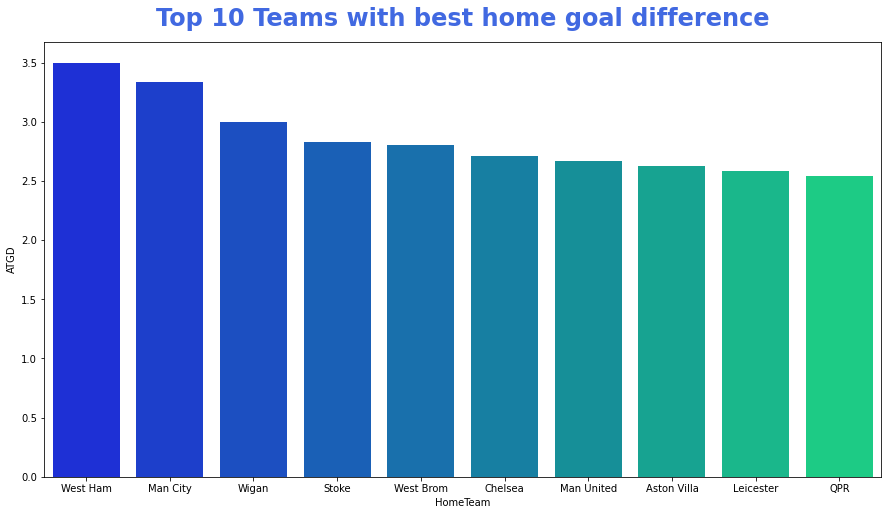

In [50]:
sns.barplot(x='HomeTeam',y='ATGD',data=results_hometeam,palette='winter')
plt.title('Top 10 Teams with best home goal difference',fontsize=24,color='royalblue',fontweight='bold',pad=16)
plt.show()

### West Ham United have the best goal difference at home closely followed by Manchester City.

In [51]:
results_hometeam = epl_data.groupby('HomeTeam')['ATGD'].min().sort_values().reset_index()[:10]
results_hometeam

,HomeTeam,ATGD
0,Tottenham,-3.333333
1,Man United,-2.666667
2,Arsenal,-2.500000
3,Norwich,-2.500000
4,Bolton,-2.285714
5,Derby,-2.250000
6,Leicester,-2.000000
7,Everton,-2.000000
8,Stoke,-2.000000
9,Southampton,-2.000000


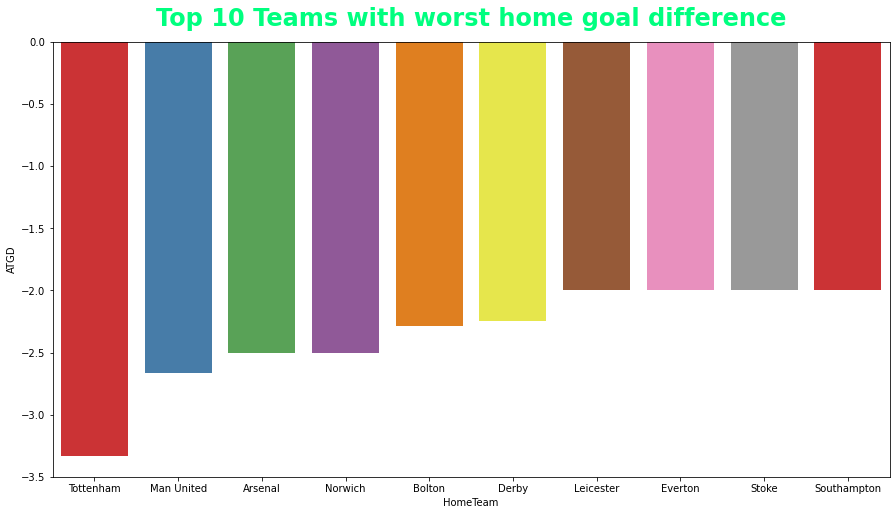

In [52]:
sns.barplot(x='HomeTeam',y='ATGD',data=results_hometeam,palette='Set1')
plt.title('Top 10 Teams with worst home goal difference',fontsize=24,color='springgreen',fontweight='bold',pad=16)
plt.show()

### Tottenham Hotspur have the lowest goal difference away from home.

In [53]:
results_hometeam = epl_data.groupby('HomeTeam')['DiffPts'].max().sort_values(ascending=False).reset_index()[:10]
results_hometeam

,HomeTeam,DiffPts
0,Man United,2.285714
1,Chelsea,2.250000
2,Bolton,2.250000
3,Man City,2.166667
4,Arsenal,2.000000
5,Aston Villa,1.800000
6,Leeds,1.666667
7,Leicester,1.666667
8,Tottenham,1.571429
9,Everton,1.500000


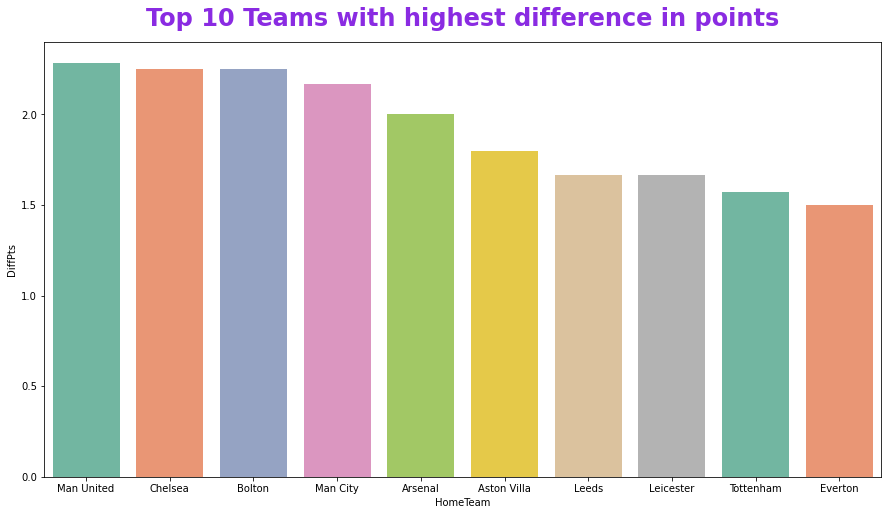

In [54]:
sns.barplot(x='HomeTeam',y='DiffPts',data=results_hometeam,palette='Set2')
plt.title('Top 10 Teams with highest difference in points',fontsize=24,color='blueviolet',fontweight='bold',pad=16)
plt.show()

### Manchester United have the largest difference in points at home as compared to all other teams in EPL.

In [55]:
results_hometeam = epl_data.groupby('HomeTeam')['DiffPts'].min().sort_values().reset_index()[:10]
results_hometeam

,HomeTeam,DiffPts
0,Sunderland,-2.363636
1,Everton,-2.300000
2,West Ham,-2.250000
3,Portsmouth,-2.250000
4,Wolves,-2.000000
5,Fulham,-2.000000
6,Birmingham,-2.000000
7,Tottenham,-2.000000
8,Swansea,-2.000000
9,Newcastle,-2.000000


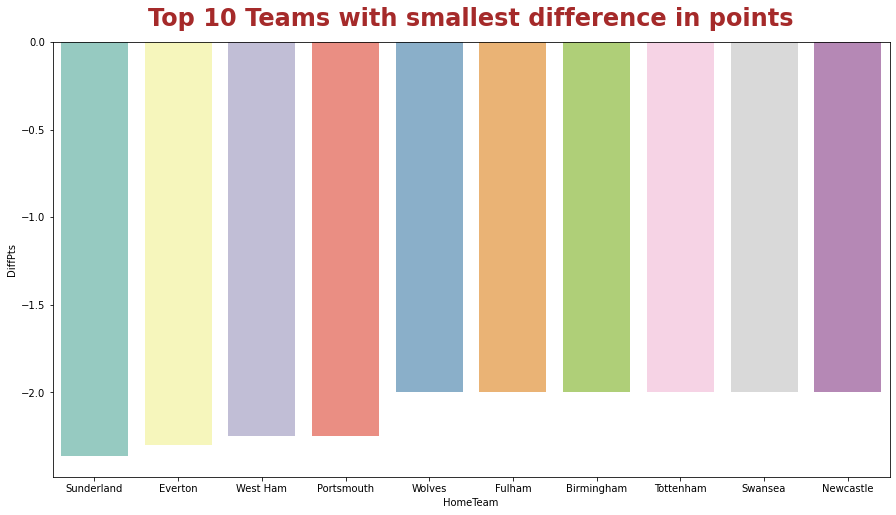

In [56]:
sns.barplot(x='HomeTeam',y='DiffPts',data=results_hometeam,palette='Set3')
plt.title('Top 10 Teams with smallest difference in points',fontsize=24,color='brown',fontweight='bold',pad=16)
plt.show()

### Sunderland has the smallest difference in points as compared to all other teams in EPL. 
### It is quite evident that Sunderland have performed poorly as a home team.

In [57]:
results_hometeam = epl_data.groupby('HomeTeam')['DiffFormPts'].max().sort_values(ascending=False).reset_index()[:10]
results_hometeam

,HomeTeam,DiffFormPts
0,Chelsea,2.250000
1,Bolton,2.250000
2,Man City,2.166667
3,Arsenal,2.000000
4,Man United,2.000000
5,Aston Villa,1.800000
6,Leeds,1.666667
7,Leicester,1.666667
8,Fulham,1.500000
9,Wigan,1.500000


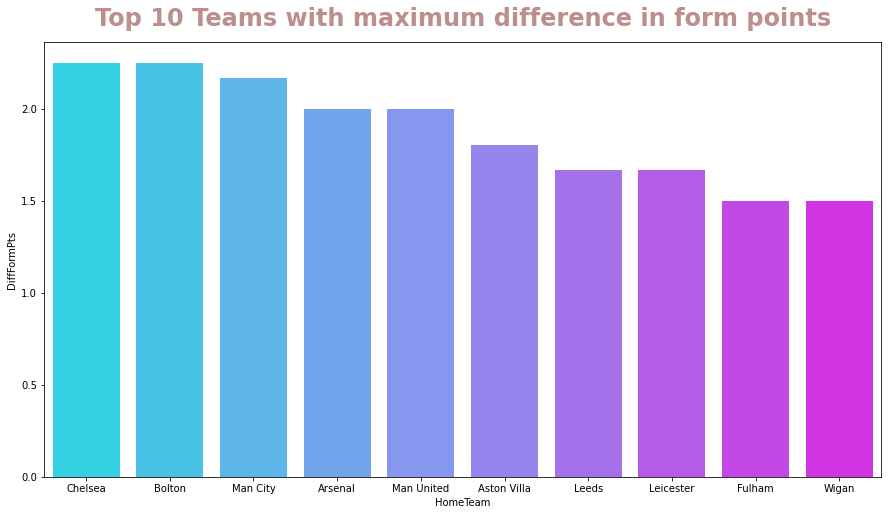

In [58]:
sns.barplot(x='HomeTeam',y='DiffFormPts',data=results_hometeam,palette='cool')
plt.title('Top 10 Teams with maximum difference in form points',fontsize=24,color='rosybrown',fontweight='bold',pad=16)
plt.show()

### Chelsea and Bolton Wanderers F.C. have been the most in-form teams at home. They have a superior record at their respective home grounds.

In [59]:
results_hometeam = epl_data.groupby('HomeTeam')['DiffFormPts'].min().sort_values().reset_index()[:10]
results_hometeam

,HomeTeam,DiffFormPts
0,West Ham,-2.250000
1,Portsmouth,-2.250000
2,Wolves,-2.000000
3,Birmingham,-2.000000
4,Fulham,-2.000000
5,Newcastle,-2.000000
6,Tottenham,-2.000000
7,QPR,-2.000000
8,Swansea,-1.833333
9,Norwich,-1.750000


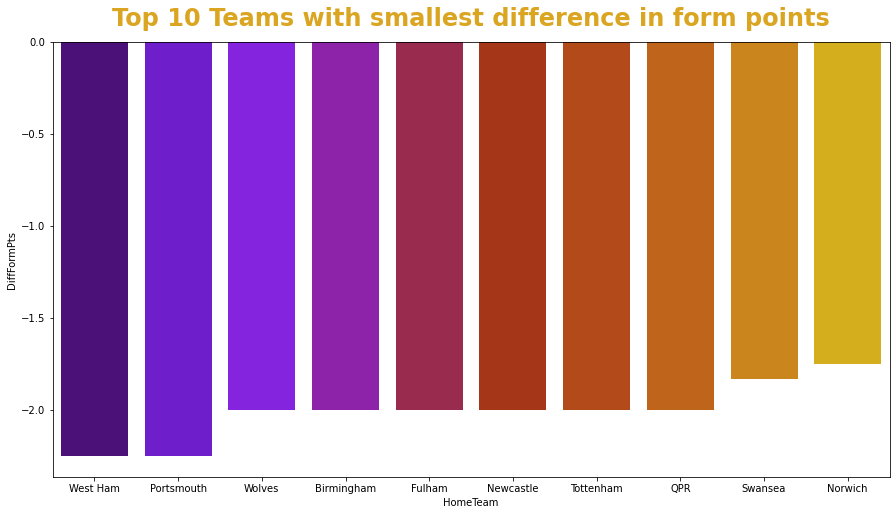

In [60]:
sns.barplot(x='HomeTeam',y='DiffFormPts',data=results_hometeam,palette='gnuplot')
plt.title('Top 10 Teams with smallest difference in form points',fontsize=24,color='goldenrod',fontweight='bold',pad=16)
plt.show()

### Both West Ham United and Portsmouth F.C. have the worst difference in form points at home which indicates that these teams are the most inconsistent.

In [61]:
fthg_per_team = epl_data.groupby('AwayTeam')['FTHG'].max().sort_values(ascending=False).reset_index()[:10]
fthg_per_team

,AwayTeam,FTHG
0,Wigan,9
1,Arsenal,8
2,Sunderland,8
3,Man City,8
4,Aston Villa,8
5,West Ham,7
6,Stoke,7
7,Reading,7
8,Norwich,7
9,Newcastle,7


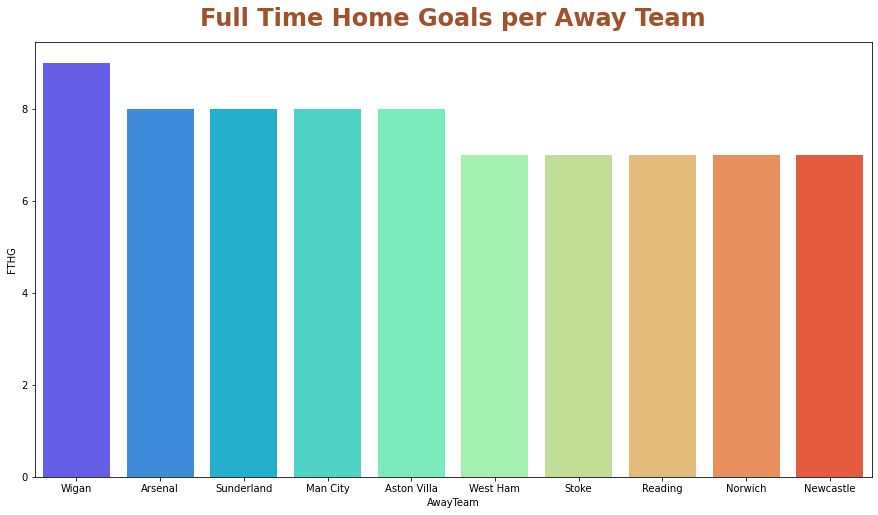

In [62]:
sns.barplot(x='AwayTeam',y='FTHG',data=fthg_per_team,palette='rainbow')
plt.title('Full Time Home Goals per Away Team',fontsize=24,color='sienna',fontweight='bold',pad=16)
plt.show()

### Wigan Athletic F.C. have scored the maximum number of goals in the second half away from home.

In [63]:
ftag_per_team = epl_data.groupby('AwayTeam')['FTAG'].max().sort_values(ascending=False).reset_index()[:10]
ftag_per_team

,AwayTeam,FTAG
0,Tottenham,7
1,Arsenal,6
2,Leeds,6
3,Man City,6
4,Man United,6
5,Chelsea,6
6,Liverpool,6
7,Aston Villa,6
8,Swansea,5
9,Bolton,5


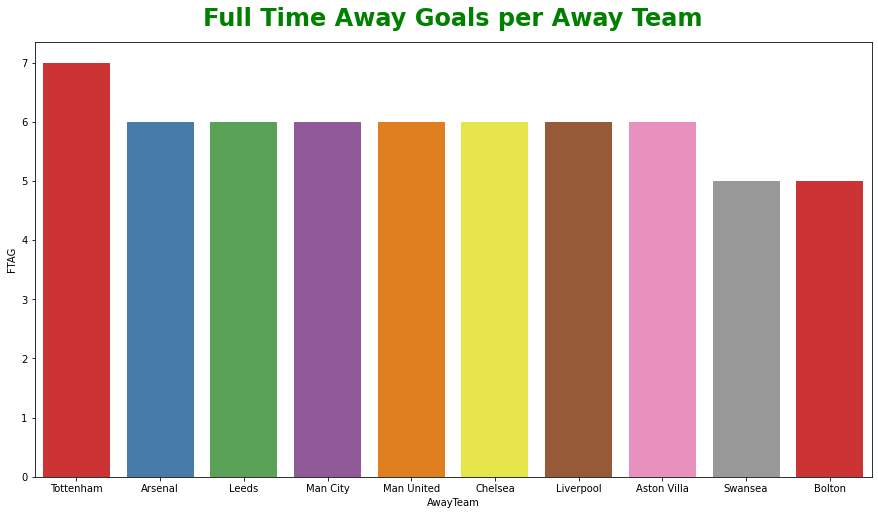

In [64]:
sns.barplot(x='AwayTeam',y='FTAG',data=ftag_per_team,palette='Set1')
plt.title('Full Time Away Goals per Away Team',fontsize=24,color='green',fontweight='bold',pad=16)
plt.show()

### Tottenham Hotspur have scored the maximum number of goals in the second half away from home.

In [65]:
results_hometeam = epl_data.groupby('AwayTeam')['HTGS'].max().sort_values(ascending=False).reset_index()[:10]
results_hometeam

,AwayTeam,HTGS
0,Huddersfield,102
1,Brighton,102
2,West Ham,100
3,Newcastle,99
4,Swansea,98
5,Aston Villa,96
6,Chelsea,96
7,Wigan,95
8,West Brom,91
9,QPR,90


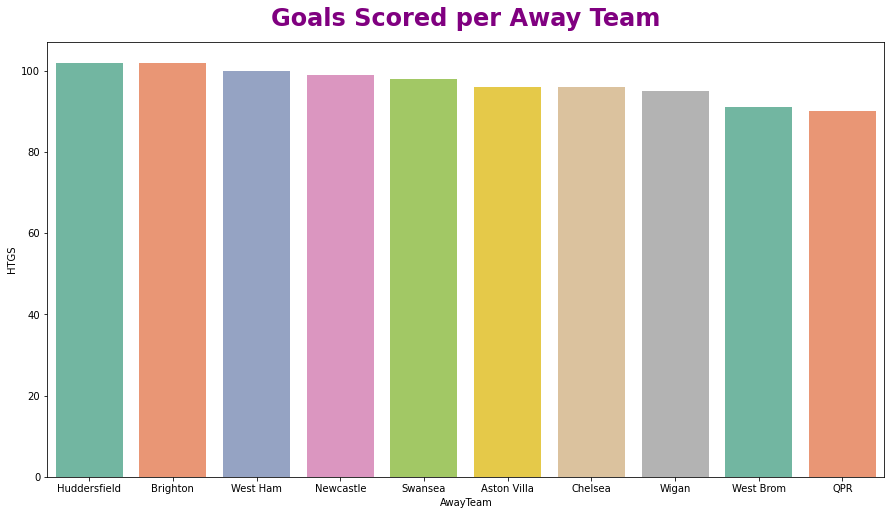

In [66]:
sns.barplot(x='AwayTeam',y='HTGS',data=results_hometeam,palette='Set2')
plt.title('Goals Scored per Away Team',fontsize=24,color='purple',fontweight='bold',pad=16)
plt.show()

### Huddersfield Town F.C. and Brighton and Hove Albion have scored the maximum number of goals by half time as away teams which means they consistently start off well in matches.

In [67]:
results_hometeam = epl_data.groupby('AwayTeam')['ATGS'].max().sort_values(ascending=False).reset_index()[:10]
results_hometeam

,AwayTeam,ATGS
0,Man City,105
1,Liverpool,96
2,Chelsea,93
3,Man United,88
4,Arsenal,86
5,Tottenham,79
6,Newcastle,73
7,Aston Villa,69
8,Leicester,67
9,West Ham,64


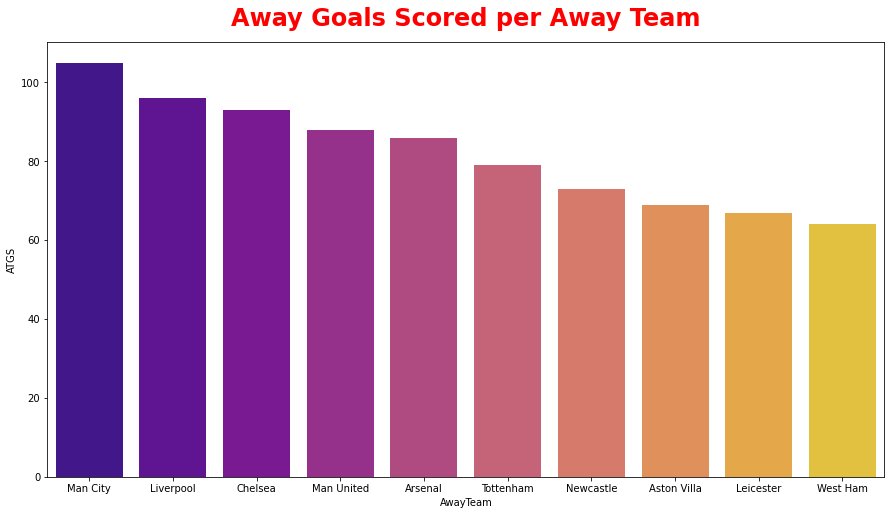

In [68]:
sns.barplot(x='AwayTeam',y='ATGS',data=results_hometeam,palette='plasma')
plt.title('Away Goals Scored per Away Team',fontsize=24,color='red',fontweight='bold',pad=16)
plt.show()

### Manchester City have scored the maximum number of goals away from home.

In [69]:
results_hometeam = epl_data.groupby('AwayTeam')['HTGC'].max().sort_values(ascending=False).reset_index()[:10]
results_hometeam

,AwayTeam,HTGC
0,Reading,85
1,Crystal Palace,83
2,Tottenham,80
3,Everton,79
4,Arsenal,76
5,Wigan,75
6,Charlton,75
7,Liverpool,75
8,Hull,74
9,West Brom,73


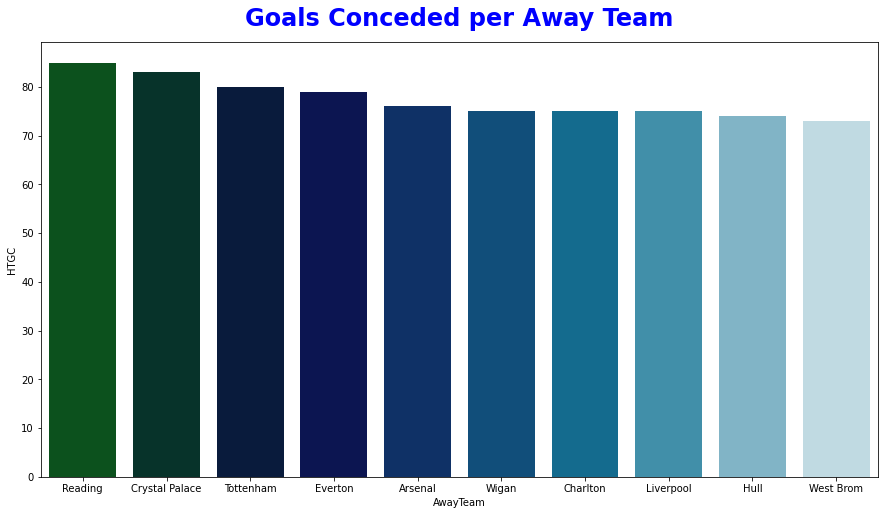

In [70]:
sns.barplot(x='AwayTeam',y='HTGC',data=results_hometeam,palette='ocean')
plt.title('Goals Conceded per Away Team',fontsize=24,color='blue',fontweight='bold',pad=16)
plt.show()

### Reading F.C. have conceded the highest number of goals before half time away from home closely followed by Crystal Palace.

In [71]:
results_hometeam = epl_data.groupby('AwayTeam')['ATGC'].max().sort_values(ascending=False).reset_index()[:10]
results_hometeam

,AwayTeam,ATGC
0,Derby,82
1,Wolves,79
2,Fulham,79
3,Leeds,78
4,Blackburn,76
5,Bolton,75
6,Blackpool,74
7,Burnley,74
8,Hull,73
9,Aston Villa,72


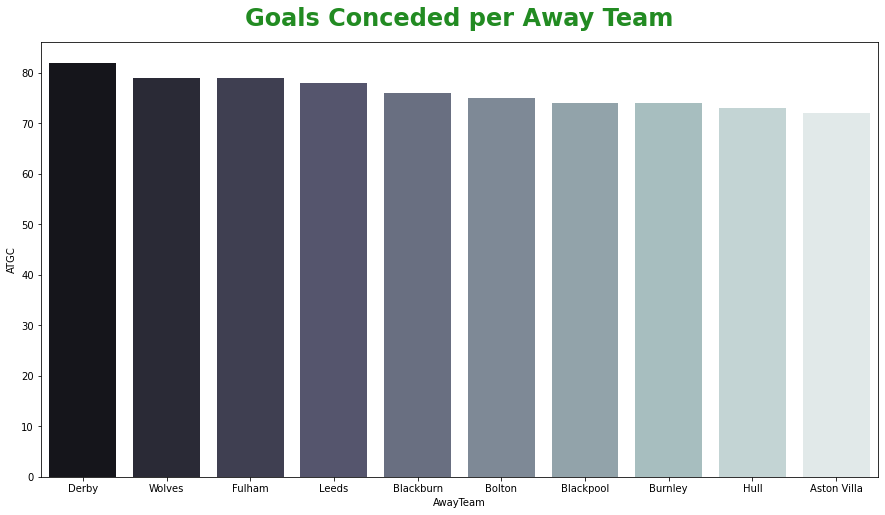

In [72]:
sns.barplot(x='AwayTeam',y='ATGC',data=results_hometeam,palette='bone')
plt.title('Goals Conceded per Away Team',fontsize=24,color='forestgreen',fontweight='bold',pad=16)
plt.show()

### Derby County F.C. have conceded the maximum number of goals away from home closely followed by Wolverhampton Wanderers and Fulham.

In [73]:
results_hometeam = epl_data.groupby('AwayTeam')['HTP'].max().sort_values(ascending=False).reset_index()[:10]
results_hometeam

,AwayTeam,HTP
0,Bournemouth,2.736842
1,Tottenham,2.722222
2,Blackburn,2.700000
3,Watford,2.681818
4,West Ham,2.666667
5,Charlton,2.652174
6,Southampton,2.642857
7,Man United,2.625000
8,Bolton,2.625000
9,West Brom,2.600000


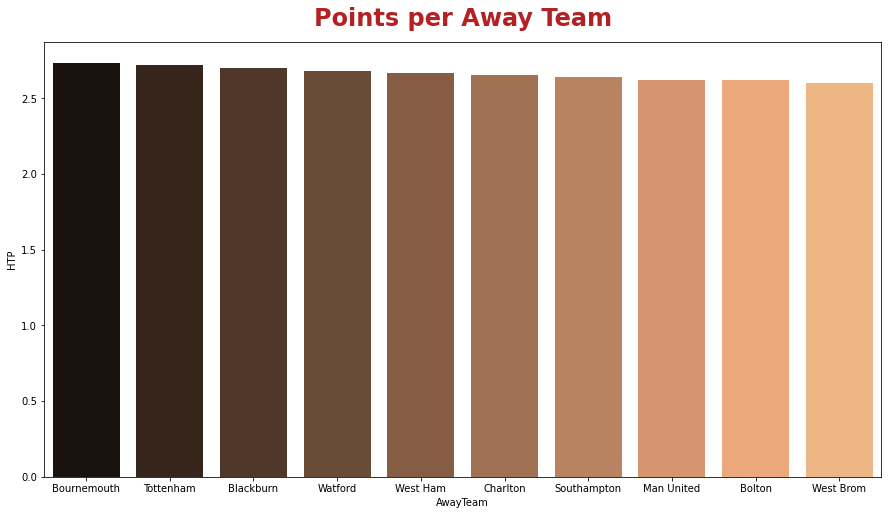

In [74]:
sns.barplot(x='AwayTeam',y='HTP',data=results_hometeam,palette='copper')
plt.title('Points per Away Team',fontsize=24,color='firebrick',fontweight='bold',pad=16)
plt.show()

### A.F.C. Bournemouth have won the highest number of points by half time as an away team closely followed by Tottenham Hotspur which suggests that they are a team which scores quite often in the first half but is unable to successfully close out matches and are consistently prone to comebacks by the opposition teams.

In [75]:
results_hometeam = epl_data.groupby('AwayTeam')['ATP'].max().sort_values(ascending=False).reset_index()[:10]
results_hometeam

,AwayTeam,ATP
0,Man City,2.761905
1,Chelsea,2.700000
2,Arsenal,2.500000
3,Man United,2.500000
4,Liverpool,2.363636
5,Charlton,2.250000
6,Swansea,2.250000
7,Tottenham,2.200000
8,Everton,2.166667
9,Leeds,2.125000


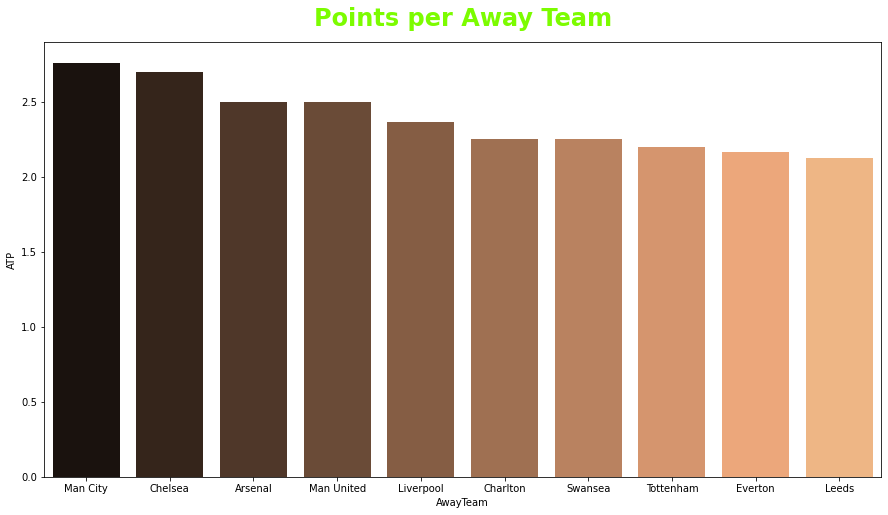

In [76]:
sns.barplot(x='AwayTeam',y='ATP',data=results_hometeam,palette='copper')
plt.title('Points per Away Team',fontsize=24,color='lawngreen',fontweight='bold',pad=16)
plt.show()

### Manchester City have won the maximum number of points away from home closely followed by Chelsea.

In [77]:
results_hometeam = epl_data.groupby('AwayTeam')['MW'].max().sort_values(ascending=False).reset_index()[:10]
results_hometeam

,AwayTeam,MW
0,Arsenal,38.0
1,Reading,38.0
2,Man City,38.0
3,Man United,38.0
4,Middlesboro,38.0
5,Middlesbrough,38.0
6,Newcastle,38.0
7,Norwich,38.0
8,Portsmouth,38.0
9,QPR,38.0


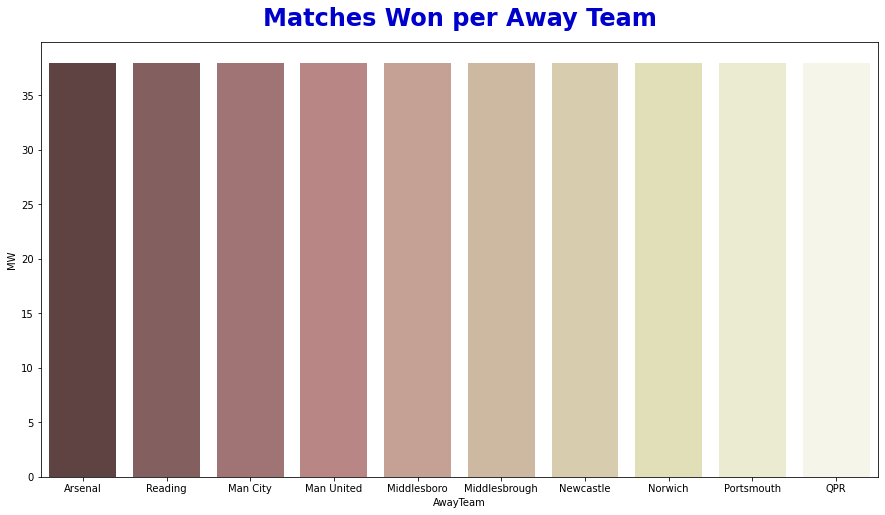

In [78]:
sns.barplot(x='AwayTeam',y='MW',data=results_hometeam,palette='pink')
plt.title('Matches Won per Away Team',fontsize=24,color='mediumblue',fontweight='bold',pad=16)
plt.show()

### Most of the teams have a decent record when it comes to winning matches away from home.

In [79]:
results_hometeam = epl_data.groupby('AwayTeam')['HTFormPts'].max().sort_values(ascending=False).reset_index()[:30]
results_hometeam

,AwayTeam,HTFormPts
0,Arsenal,15
1,Aston Villa,15
2,Man City,15
3,Man United,15
4,Middlesbrough,15
5,Newcastle,15
6,Portsmouth,15
7,QPR,15
8,Reading,15
9,Sheffield United,15


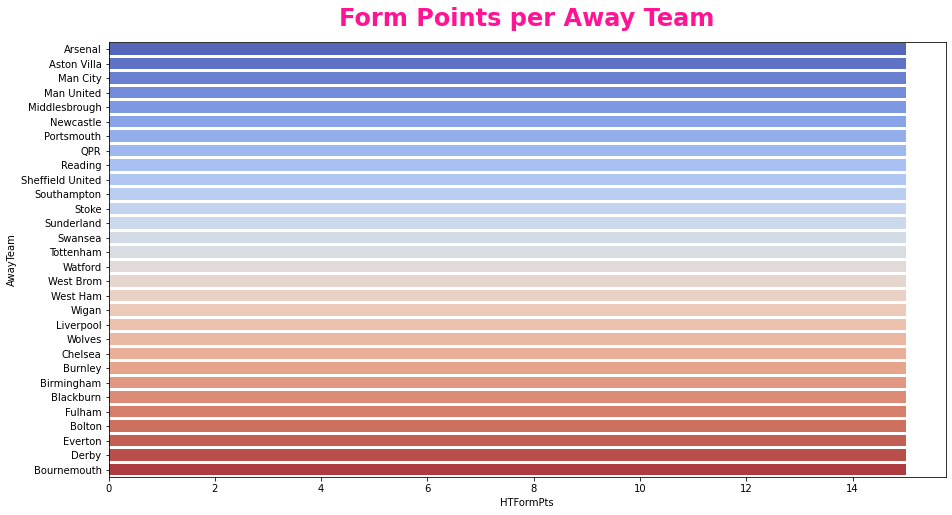

In [80]:
sns.barplot(x='HTFormPts',y='AwayTeam',data=results_hometeam,palette='coolwarm',orient='horizontal')
plt.title('Form Points per Away Team',fontsize=24,color='deeppink',fontweight='bold',pad=16)
plt.show()

In [81]:
results_hometeam = epl_data.groupby('AwayTeam')['ATFormPts'].max().sort_values(ascending=False).reset_index()[:30]
results_hometeam

,AwayTeam,ATFormPts
0,Arsenal,15
1,Charlton,15
2,Liverpool,15
3,Everton,15
4,Man City,15
5,Man United,15
6,Newcastle,15
7,Chelsea,15
8,Leeds,15
9,Tottenham,15


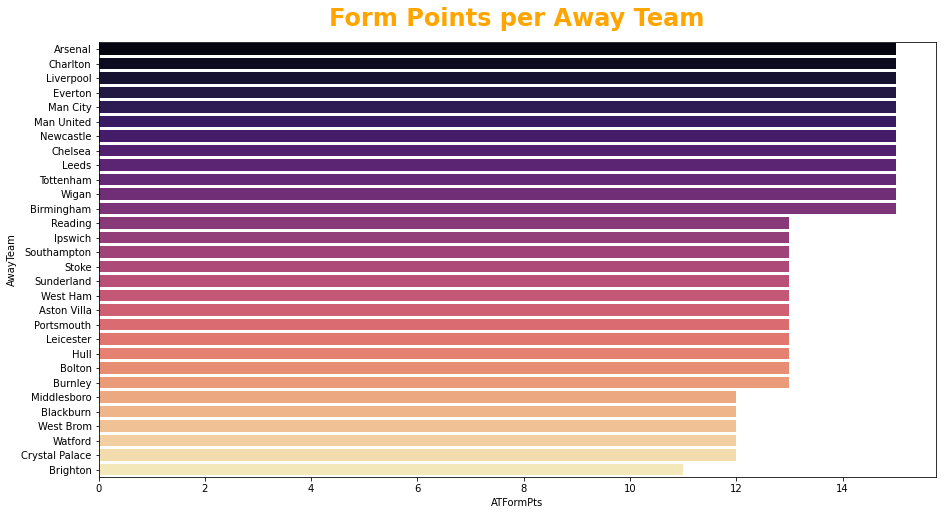

In [82]:
sns.barplot(x='ATFormPts',y='AwayTeam',data=results_hometeam,palette='magma',orient='horizontal')
plt.title('Form Points per Away Team',fontsize=24,color='orange',fontweight='bold',pad=16)
plt.show()

### Most of the teams have managed to maintain their performance levels away from home.

In [83]:
results_hometeam = epl_data.groupby('AwayTeam')['HTWinStreak3'].count().sort_values(ascending=False).reset_index()[:10]
results_hometeam

,AwayTeam,HTWinStreak3
0,Arsenal,342
1,Tottenham,342
2,Man United,342
3,Everton,342
4,Chelsea,342
5,Liverpool,342
6,Man City,323
7,Aston Villa,304
8,Newcastle,304
9,West Ham,285


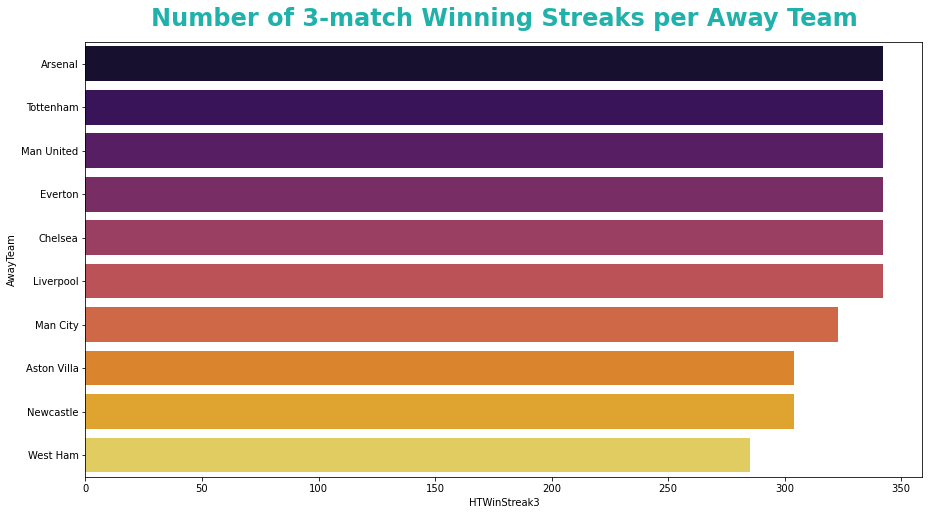

In [84]:
sns.barplot(x='HTWinStreak3',y='AwayTeam',data=results_hometeam,palette='inferno',orient='horizontal')
plt.title('Number of 3-match Winning Streaks per Away Team',fontsize=24,color='lightseagreen',fontweight='bold',pad=16)
plt.show()

In [85]:
results_hometeam = epl_data.groupby('AwayTeam')['HTWinStreak5'].count().sort_values(ascending=False).reset_index()[:10]
results_hometeam

,AwayTeam,HTWinStreak5
0,Arsenal,342
1,Tottenham,342
2,Man United,342
3,Everton,342
4,Chelsea,342
5,Liverpool,342
6,Man City,323
7,Aston Villa,304
8,Newcastle,304
9,West Ham,285


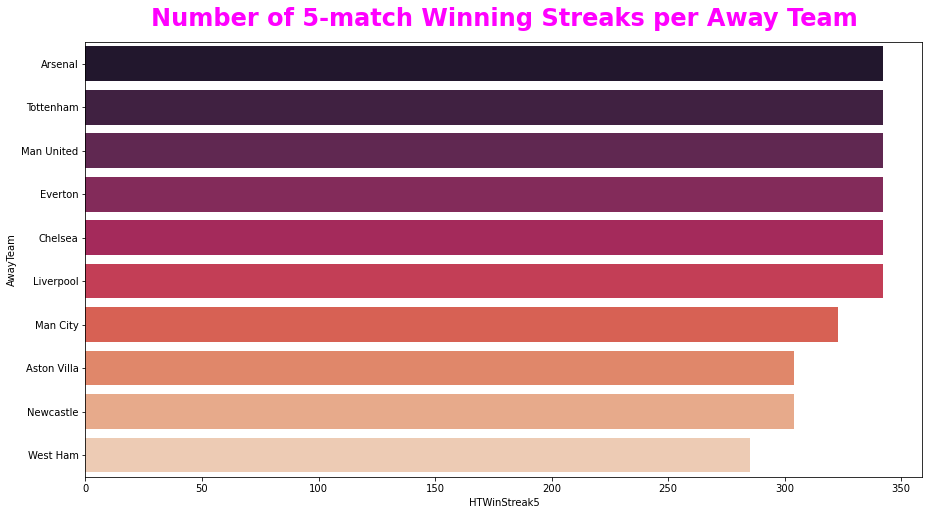

In [86]:
sns.barplot(x='HTWinStreak5',y='AwayTeam',data=results_hometeam,palette='rocket',orient='horizontal')
plt.title('Number of 5-match Winning Streaks per Away Team',fontsize=24,color='fuchsia',fontweight='bold',pad=16)
plt.show()

In [87]:
results_hometeam = epl_data.groupby('AwayTeam')['HTLossStreak3'].count().sort_values(ascending=False).reset_index()[:10]
results_hometeam

,AwayTeam,HTLossStreak3
0,Arsenal,342
1,Tottenham,342
2,Man United,342
3,Everton,342
4,Chelsea,342
5,Liverpool,342
6,Man City,323
7,Aston Villa,304
8,Newcastle,304
9,West Ham,285


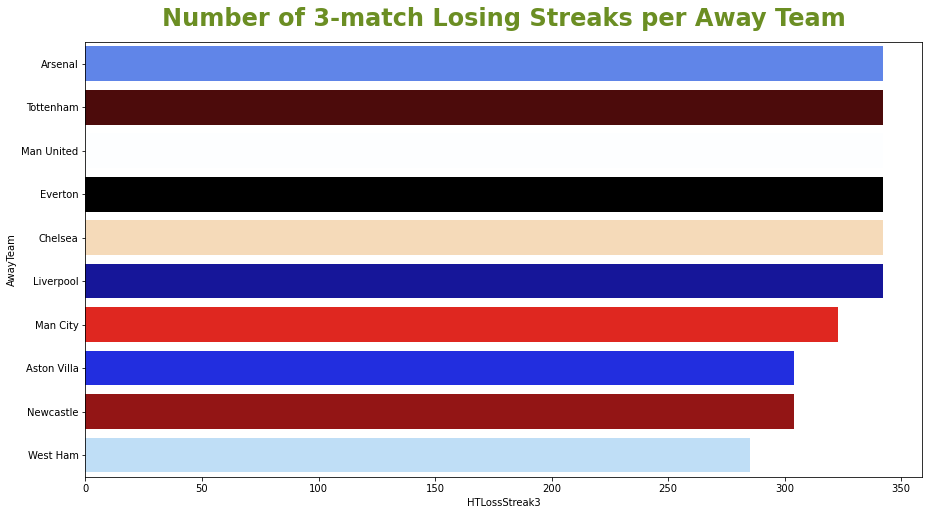

In [88]:
sns.barplot(x='HTLossStreak3',y='AwayTeam',data=results_hometeam,palette='flag',orient='horizontal')
plt.title('Number of 3-match Losing Streaks per Away Team',fontsize=24,color='olivedrab',fontweight='bold',pad=16)
plt.show()

In [89]:
results_hometeam = epl_data.groupby('AwayTeam')['HTLossStreak5'].count().sort_values(ascending=False).reset_index()[:10]
results_hometeam

,AwayTeam,HTLossStreak5
0,Arsenal,342
1,Tottenham,342
2,Man United,342
3,Everton,342
4,Chelsea,342
5,Liverpool,342
6,Man City,323
7,Aston Villa,304
8,Newcastle,304
9,West Ham,285


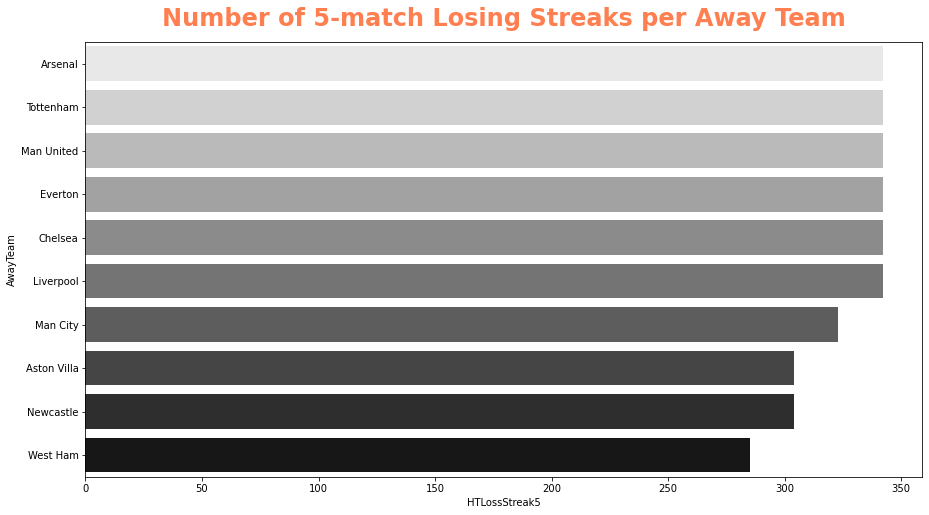

In [90]:
sns.barplot(x='HTLossStreak5',y='AwayTeam',data=results_hometeam,palette='binary',orient='horizontal')
plt.title('Number of 5-match Losing Streaks per Away Team',fontsize=24,color='coral',fontweight='bold',pad=16)
plt.show()

### Arsenal, Tottenham Hotspur, Manchester United, Everton, Chelsea and Liverpool have had the most number of 3 and 5-match winning and losing streaks away from home in EPL.

In [91]:
results_hometeam = epl_data.groupby('AwayTeam')['HTGD'].max().sort_values(ascending=False).reset_index()[:10]
results_hometeam

,AwayTeam,HTGD
0,Stoke,4.000000
1,Blackpool,3.200000
2,Chelsea,3.000000
3,Burnley,2.777778
4,Arsenal,2.714286
5,Sunderland,2.666667
6,Leicester,2.666667
7,Wolves,2.600000
8,West Ham,2.500000
9,Portsmouth,2.500000


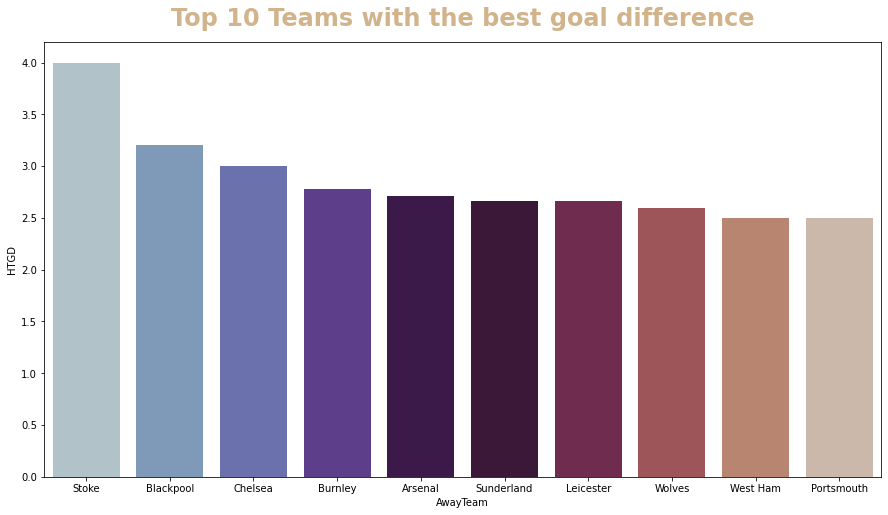

In [92]:
sns.barplot(x='AwayTeam',y='HTGD',data=results_hometeam,palette='twilight')
plt.title('Top 10 Teams with the best goal difference',fontsize=24,color='tan',fontweight='bold',pad=16)
plt.show()

### Stoke City F.C. have a superior goal difference by half time as an away team.

In [93]:
results_hometeam = epl_data.groupby('AwayTeam')['HTGD'].min().sort_values().reset_index()[:10]
results_hometeam

,AwayTeam,HTGD
0,Ipswich,-3.000000
1,Sunderland,-3.000000
2,QPR,-2.500000
3,Man City,-2.333333
4,Portsmouth,-2.250000
5,Chelsea,-2.125000
6,Arsenal,-2.000000
7,Wigan,-2.000000
8,Man United,-2.000000
9,Huddersfield,-2.000000


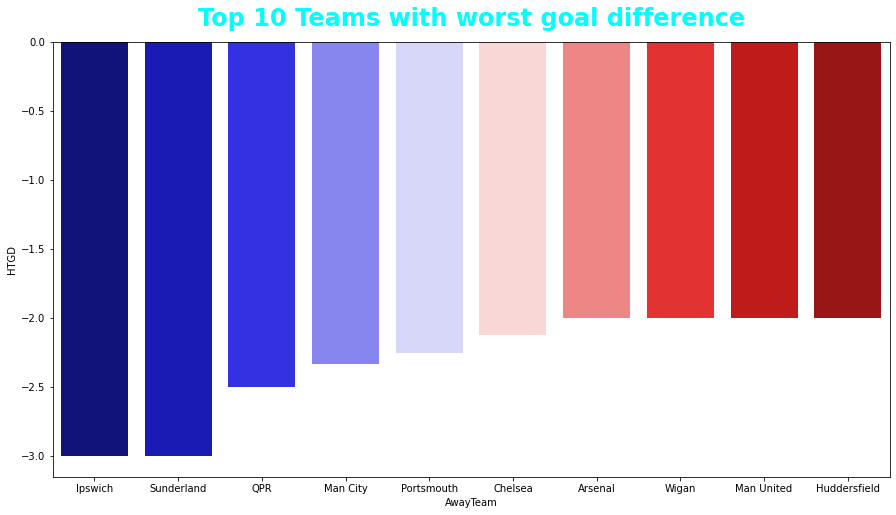

In [94]:
sns.barplot(x='AwayTeam',y='HTGD',data=results_hometeam,palette='seismic')
plt.title('Top 10 Teams with worst goal difference',fontsize=24,color='cyan',fontweight='bold',pad=16)
plt.show()

### Ipswich Town and Sunderland F.C. have the worst goal difference by half time away from home among all teams in EPL.

In [95]:
results_hometeam = epl_data.groupby('AwayTeam')['ATGD'].max().sort_values(ascending=False).reset_index()[:10]
results_hometeam

,AwayTeam,ATGD
0,Chelsea,3.500000
1,Man United,2.833333
2,Man City,2.800000
3,Arsenal,2.666667
4,Fulham,2.500000
5,Blackburn,2.000000
6,Blackpool,2.000000
7,Bolton,2.000000
8,Swansea,2.000000
9,Charlton,2.000000


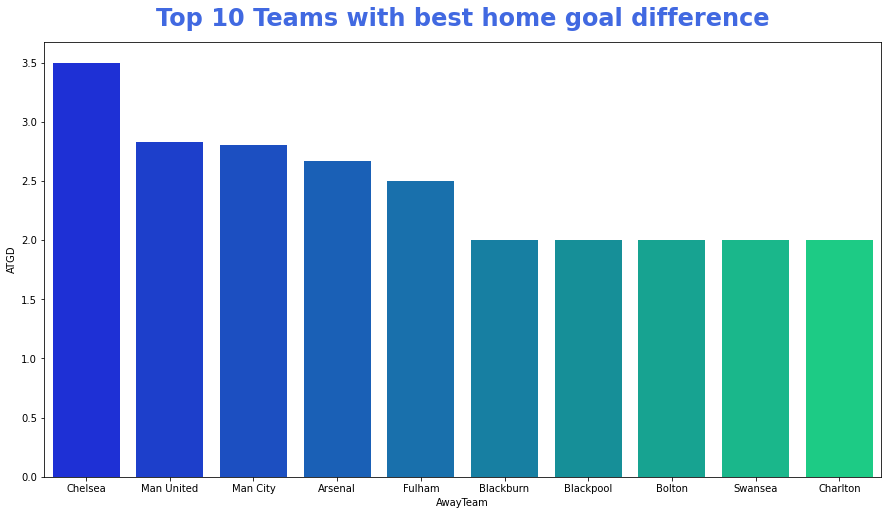

In [96]:
sns.barplot(x='AwayTeam',y='ATGD',data=results_hometeam,palette='winter')
plt.title('Top 10 Teams with best home goal difference',fontsize=24,color='royalblue',fontweight='bold',pad=16)
plt.show()

### Chelsea have the best goal difference away from home among all teams in the Premier League.

In [97]:
results_hometeam = epl_data.groupby('AwayTeam')['ATGD'].min().sort_values().reset_index()[:10]
results_hometeam

,AwayTeam,ATGD
0,Wigan,-3.333333
1,Wolves,-2.666667
2,QPR,-2.500000
3,Leicester,-2.500000
4,West Ham,-2.000000
5,Middlesbrough,-2.000000
6,Everton,-2.000000
7,Derby,-2.000000
8,Crystal Palace,-1.857143
9,West Brom,-1.666667


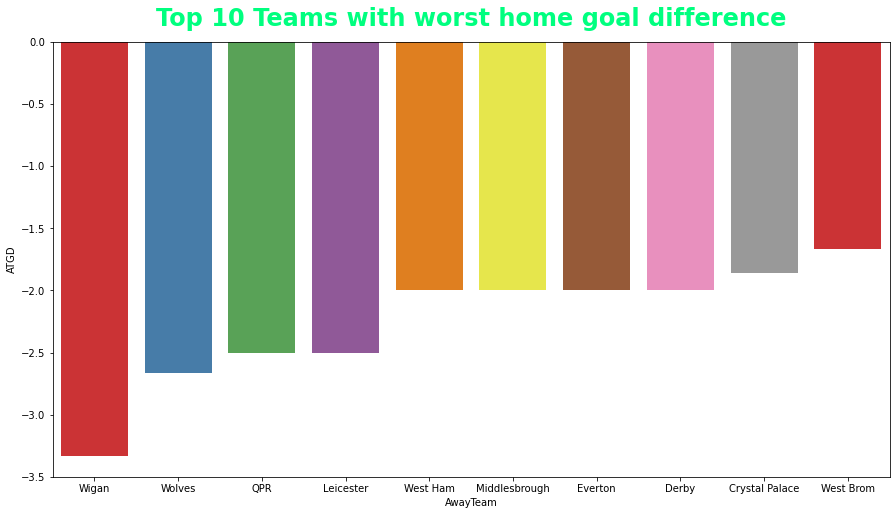

In [98]:
sns.barplot(x='AwayTeam',y='ATGD',data=results_hometeam,palette='Set1')
plt.title('Top 10 Teams with worst home goal difference',fontsize=24,color='springgreen',fontweight='bold',pad=16)
plt.show()

### Wigan Athletic F.C. have the worst goal difference among all teams away from home.

In [99]:
results_hometeam = epl_data.groupby('AwayTeam')['DiffPts'].max().sort_values(ascending=False).reset_index()[:10]
results_hometeam

,AwayTeam,DiffPts
0,Crystal Palace,2.285714
1,Southampton,2.250000
2,Sunderland,2.250000
3,Wolves,2.000000
4,West Ham,2.000000
5,Derby,2.000000
6,Stoke,2.000000
7,Tottenham,2.000000
8,Bournemouth,1.894737
9,Birmingham,1.894737


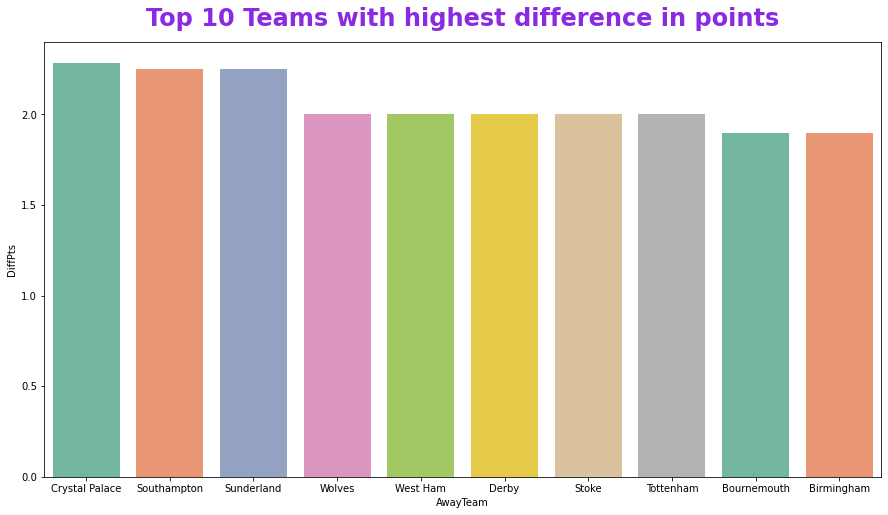

In [100]:
sns.barplot(x='AwayTeam',y='DiffPts',data=results_hometeam,palette='Set2')
plt.title('Top 10 Teams with highest difference in points',fontsize=24,color='blueviolet',fontweight='bold',pad=16)
plt.show()

### Crystal Palace has the maximum difference in points as an away team closely followed by Southampton and Sunderland.

In [101]:
results_hometeam = epl_data.groupby('AwayTeam')['DiffPts'].min().sort_values().reset_index()[:10]
results_hometeam

,AwayTeam,DiffPts
0,Chelsea,-2.363636
1,Man City,-2.250000
2,Leeds,-2.000000
3,Man United,-2.000000
4,Charlton,-2.000000
5,Liverpool,-1.818182
6,Arsenal,-1.800000
7,Portsmouth,-1.750000
8,Huddersfield,-1.750000
9,Everton,-1.666667


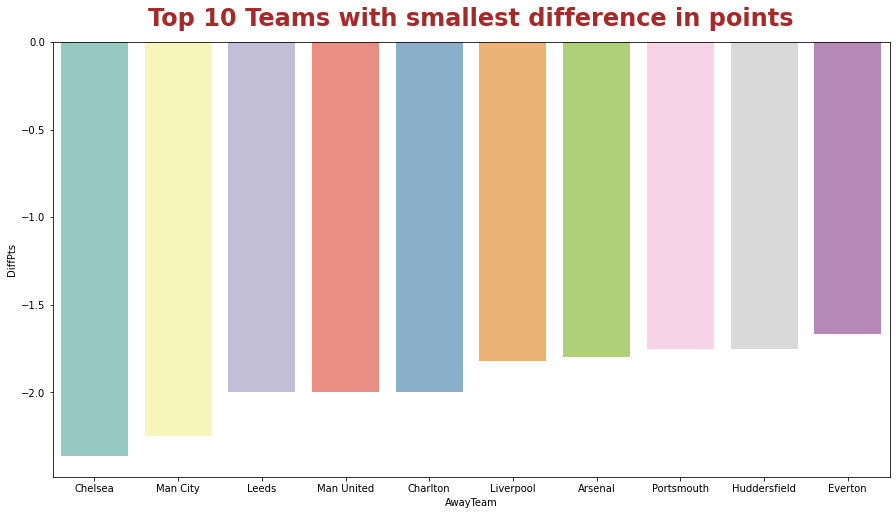

In [102]:
sns.barplot(x='AwayTeam',y='DiffPts',data=results_hometeam,palette='Set3')
plt.title('Top 10 Teams with smallest difference in points',fontsize=24,color='brown',fontweight='bold',pad=16)
plt.show()

### Chelsea have the lowest difference in points away from home closely followed by Man City.

In [103]:
results_hometeam = epl_data.groupby('AwayTeam')['DiffFormPts'].max().sort_values(ascending=False).reset_index()[:10]
results_hometeam

,AwayTeam,DiffFormPts
0,Sunderland,2.250000
1,Southampton,2.250000
2,Crystal Palace,2.166667
3,Wolves,2.000000
4,Tottenham,2.000000
5,Stoke,2.000000
6,Derby,2.000000
7,Portsmouth,1.800000
8,Swansea,1.750000
9,Norwich,1.666667


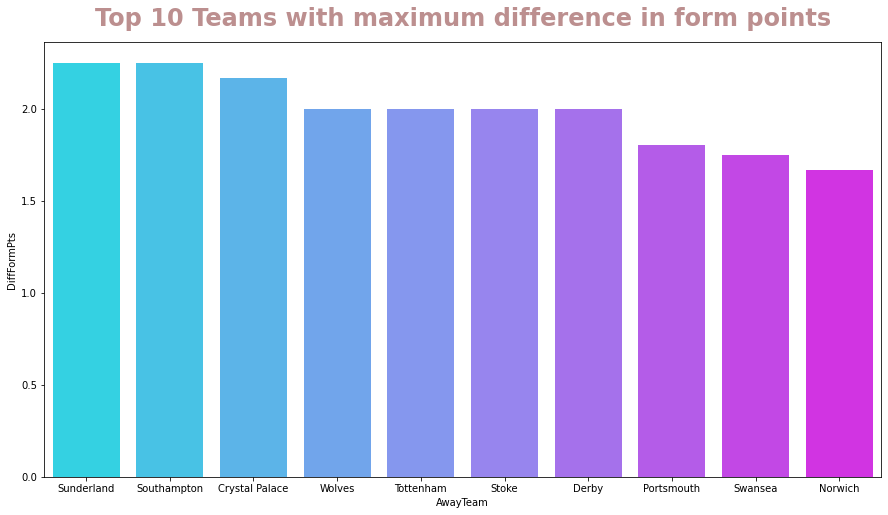

In [104]:
sns.barplot(x='AwayTeam',y='DiffFormPts',data=results_hometeam,palette='cool')
plt.title('Top 10 Teams with maximum difference in form points',fontsize=24,color='rosybrown',fontweight='bold',pad=16)
plt.show()

### Sunderland and Southampton have the highest difference in form points away from home among all teams in EPL which suggests that both of them have won a considerable number of matches as away sides.

In [105]:
results_hometeam = epl_data.groupby('AwayTeam')['DiffFormPts'].min().sort_values().reset_index()[:10]
results_hometeam

,AwayTeam,DiffFormPts
0,Man City,-2.250000
1,Chelsea,-2.250000
2,Leeds,-2.000000
3,Man United,-2.000000
4,Charlton,-2.000000
5,Portsmouth,-1.750000
6,Huddersfield,-1.750000
7,Arsenal,-1.750000
8,Everton,-1.666667
9,Birmingham,-1.500000


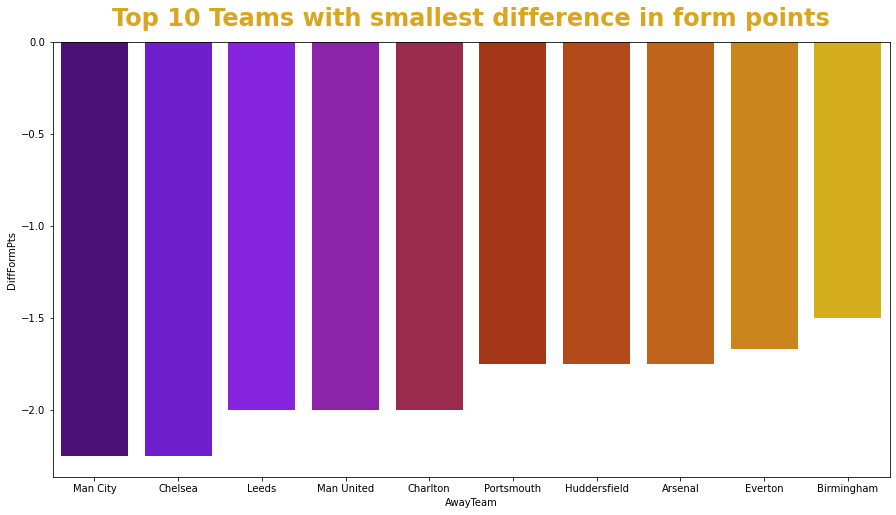

In [106]:
sns.barplot(x='AwayTeam',y='DiffFormPts',data=results_hometeam,palette='gnuplot')
plt.title('Top 10 Teams with smallest difference in form points',fontsize=24,color='goldenrod',fontweight='bold',pad=16)
plt.show()

### Manchester City and Chelsea have the lowest difference in form points playing away from home among all teams in the EPL which indicates that they have lost a considerable number of matches away from home.

In [107]:
epl_data.drop(columns=["HTWinStreak3","HTWinStreak5","HTLossStreak3","HTLossStreak5","ATWinStreak3","ATWinStreak5","ATLossStreak5"],inplace=True)

## Exploring correlations

In [108]:
epl_data.corr()

,FTHG,FTAG,HTGS,ATGS,HTGC,ATGC,HTP,ATP,MW,HTFormPts,ATFormPts,ATLossStreak3,HTGD,ATGD,DiffPts,DiffFormPts
FTHG,1.000000,-0.055298,0.141783,-0.067467,-0.058357,0.097771,0.202384,-0.151024,0.023668,0.154322,-0.122068,0.029133,0.236631,-0.185343,0.278694,0.165823
FTAG,-0.055298,1.000000,-0.077894,0.105804,0.069377,-0.066379,-0.149760,0.178364,-0.005910,-0.126204,0.148145,-0.035724,-0.161605,0.213954,-0.258355,-0.169638
HTGS,0.141783,-0.077894,1.000000,0.712447,0.617738,0.758437,0.584100,0.216469,0.847961,0.477020,0.197392,0.063186,0.416794,-0.023754,0.293827,0.155921
ATGS,-0.067467,0.105804,0.712447,1.000000,0.755646,0.617540,0.238331,0.568414,0.846988,0.211259,0.477074,-0.031620,0.002246,0.394392,-0.255819,-0.088395
HTGC,-0.058357,0.069377,0.617738,0.755646,1.000000,0.783772,-0.026110,0.237425,0.883658,-0.004983,0.216832,0.061912,-0.327763,-0.010941,-0.206512,-0.067654
ATGC,0.097771,-0.066379,0.758437,0.617540,0.783772,1.000000,0.262475,-0.049999,0.884655,0.212295,-0.006433,0.153928,0.016293,-0.351036,0.247290,0.132287
HTP,0.202384,-0.149760,0.584100,0.238331,-0.026110,0.262475,1.000000,0.194476,0.292767,0.785582,0.191946,0.038789,0.824356,-0.021055,0.640877,0.494798
ATP,-0.151024,0.178364,0.216469,0.568414,0.237425,-0.049999,0.194476,1.000000,0.266437,0.184509,0.781990,-0.157021,-0.004682,0.821816,-0.628352,-0.462956
MW,0.023668,-0.005910,0.847961,0.846988,0.883658,0.884655,0.292767,0.266437,1.000000,0.247948,0.241314,0.071585,0.014176,-0.015359,0.023676,0.040583
HTFormPts,0.154322,-0.126204,0.477020,0.211259,-0.004983,0.212295,0.785582,0.184509,0.247948,1.000000,0.196920,0.036594,0.625665,0.000667,0.478628,0.495629


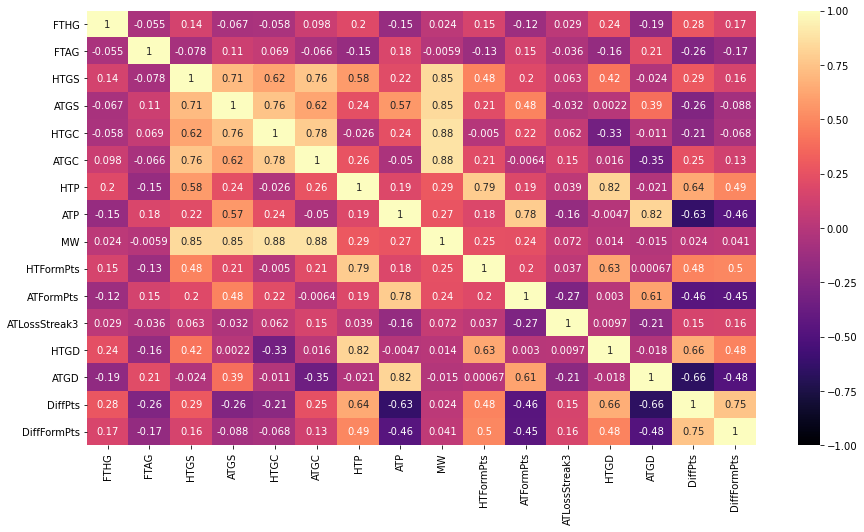

In [109]:
sns.heatmap(epl_data.corr(),annot=True,vmin=-1,vmax=1,cmap='magma')
plt.show()

### There is strong positive correlation between each of HTGD and DiffPts, ATGD and ATFormPts, HTGD and HTFormPts, ATFormPts and ATP, HTGD and HTP, MW and (each of HTGS, ATGS, HTGC and ATGC), HTGC and ATGC, ATGC and ATGS, ATGC and HTGC and ATGS and HTGS.

### There is strong negative correlation between each of DiffPts and ATP and DiffPts and ATGD.

### There is mild positive correlation between each of DiffFormPts and HTGD, DiffFormPts and HTFormPts, DiffPts and HTFormPts, HTP and DiffFormPts, HTP and HTGS, ATP and ATGS and HTGS and HTGD.

### There is mild negative correlation between each of DiffFormPts and ATGD, DiffFormPts and ATFormPts, DiffFormPts and ATP, DiffPts and ATFormPts and ATGD and DiffFormPts.

# Regression Analysis

## Let's perform multivariate regression analysis for a few parameters of interest.

### Independent variables: DiffPts, HTFormPts, HTP
### Dependent variable: HTGD

In [121]:
X = epl_data[['DiffPts','HTFormPts','HTP']]
Y = epl_data['HTGD']

In [122]:
X1 = sm.add_constant(X)
reg = sm.OLS(Y,X1).fit()

In [123]:
reg.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                   HTGD   R-squared:                       0.709
Model:                            OLS   Adj. R-squared:                  0.708
Method:                 Least Squares   F-statistic:                     5540.
Date:                Mon, 29 Nov 2021   Prob (F-statistic):               0.00
Time:                        16:49:02   Log-Likelihood:                -2985.8
No. Observations:                6840   AIC:                             5980.
Df Residuals:                    6836   BIC:                             6007.
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         -1.0907      0.014    -76.201      0.000      -1.119      -1.063
DiffPts        0.2255      0.009     25.514      0.000       0.208       0.243
HTFormPts     -0.0084      0.002     -4.088      0.000      -0.012      -0.004
HTP            0.9406      0.016     59.492      0.000       0.910       0.972
==============================================================================
Omnibus:                     1126.791   Durbin-Watson:                   1.477
Prob(Omnibus):                  0.000   Jarque-Bera (JB):             2808.268
Skew:                           0.919   Prob(JB):                         0.00
Kurtosis:                       5.545   Cond. No.                         33.3
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

### Regression equation: HTGD = -1.0907 + 0.2255XDiffPts - 0.0084XHTFormPts + 0.9406XHTP

### Let's predict HTGD by some new data

#### DiffPts: 9, HTFormPts: 12, HTP: 32

In [124]:
-1.0907 + 0.2255*9 - 0.0084*12 + 0.9406*32

30.9372

#### Predicted HTGD: 31 approx.

### Independent variables: HTGC, MW, ATGS
### Dependent variable: ATGC

In [125]:
X = epl_data[['HTGC','MW','ATGS']]
Y = epl_data['ATGC']

In [126]:
X1 = sm.add_constant(X)
reg = sm.OLS(Y,X1).fit()

In [127]:
reg.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                   ATGC   R-squared:                       0.844
Model:                            OLS   Adj. R-squared:                  0.844
Method:                 Least Squares   F-statistic:                 1.234e+04
Date:                Mon, 29 Nov 2021   Prob (F-statistic):               0.00
Time:                        16:56:15   Log-Likelihood:                -22456.
No. Observations:                6840   AIC:                         4.492e+04
Df Residuals:                    6836   BIC:                         4.495e+04
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         -1.9031      0.160    -11.891      0.000      -2.217      -1.589
HTGC           0.0245      0.010      2.415      0.016       0.005       0.044
MW             1.8750      0.019    100.094      0.000       1.838       1.912
ATGS          -0.4452      0.009    -51.957      0.000      -0.462      -0.428
==============================================================================
Omnibus:                      254.404   Durbin-Watson:                   1.839
Prob(Omnibus):                  0.000   Jarque-Bera (JB):              491.831
Skew:                           0.278   Prob(JB):                    1.59e-107
Kurtosis:                       4.190   Cond. No.                         95.9
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

## Regression Equation: -1.9031 + 0.0245XHTGC + 1.8750XMW - 0.4452XATGS

### Let's predict ATGC by some new data.

#### HTGC: 6, MW: 5, ATGS: 13

In [128]:
-1.9031 + 0.0245*6 + 1.8750*5 - 0.4452*13

1.8313000000000006

### Predicted ATGC: 1.83 approx.

# Multivariate Analysis

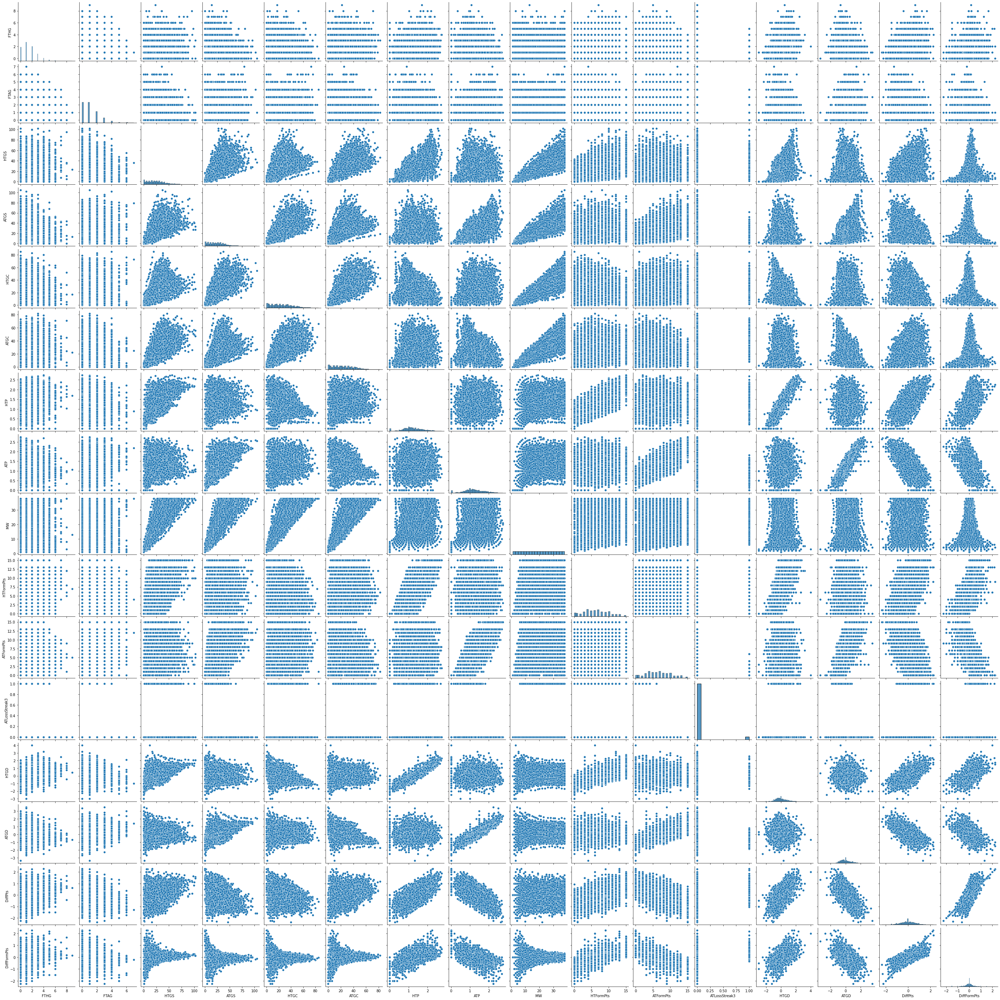

In [110]:
sns.pairplot(epl_data)
plt.show()

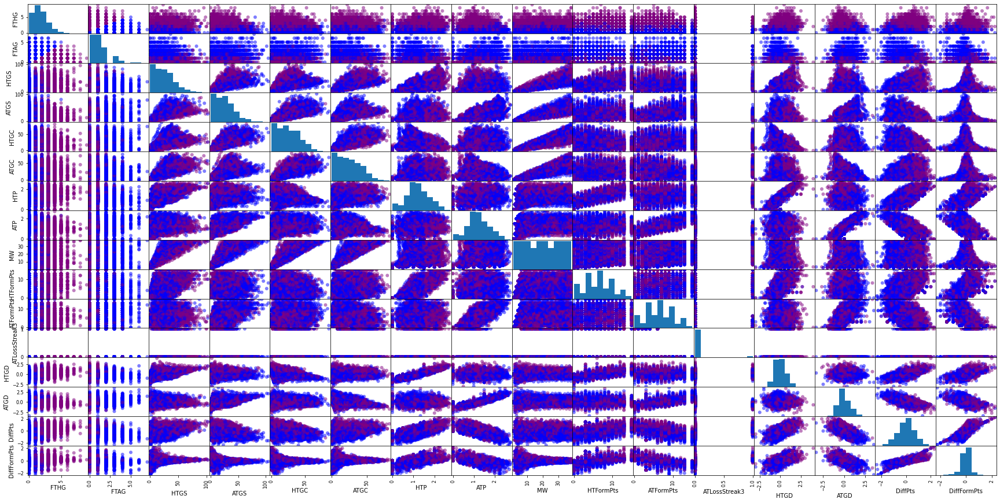

In [120]:
colors = {'NH': 'blue', 'H': 'purple'}
pd.plotting.scatter_matrix(epl_data,grid=True,marker='o',c=epl_data['FTR'].map(colors),figsize=(30,15))
plt.show()